In [1]:
from pathlib import Path

import numpy as np
import pandas as pd

from rdkit import Chem
from rdkit.Chem import AllChem

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, Lasso, BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score

plt.rcParams["figure.figsize"] = (6, 4)

print("Imports OK")

Imports OK


In [2]:
smiles_df = pd.read_csv("/Users/kishu/Downloads/flp_xyz_smiles_obabelonly.csv")
print(smiles_df.shape)
smiles_df

(133, 4)


,xyz_path,filename,smiles,error
0,data\raw\xyz\1\1.xyz,1.xyz,c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C...,NaN
1,data\raw\xyz\10\10.xyz,10.xyz,c1(ccccc1N1C(CCCC1(C)C)(C)C)B,NaN
2,data\raw\xyz\103\103.xyz,103.xyz,P1(B(c2cccc3cccc1c23)c1c(cc(cc1C)C)C)c1c(cc(cc...,NaN
3,data\raw\xyz\104\104.xyz,104.xyz,P1(B(c2cccc3cccc1c23)c1c(cccc1C)C)c1c(cccc1C)C,NaN
4,data\raw\xyz\105\105.xyz,105.xyz,[P]1([B](c2c3c1cccc3ccc2)(c1c(cc(cc1C)C)C)c1c(...,NaN
...,...,...,...,...
128,data\raw\xyz\95\95.xyz,95.xyz,P(/C(=C\C(C)(C)C)/B(c1c(c(c(c(c1F)F)F)F)F)c1c(...,NaN
129,data\raw\xyz\96\96.xyz,96.xyz,P(c1c(c(c(c(c1F)F)F)F)F)(c1c(c(c(c(c1F)F)F)F)F...,NaN
130,data\raw\xyz\97\97.xyz,97.xyz,N1(C2=NCCCN2CCC1)B1[C@H]2CCC[C@@H]1CCC2,NaN
131,data\raw\xyz\98\98.xyz,98.xyz,[N@@]12[C]3[N@](CCC[N@]3[B]2(C2CCCCC2)C2CCCCC2...,NaN


In [3]:
import pandas as pd
import numpy as np
from rdkit import Chem, DataStructs
from rdkit.Chem import rdFingerprintGenerator

# 1) Load your CSV
csv_path = "flp_xyz_smiles_obabelonly.csv"  # adjust path if needed
df = pd.read_csv(csv_path)

print(df.head())
# Columns should be: ['xyz_path', 'filename', 'smiles', 'error']

# 2) Create a Morgan fingerprint generator (radius=2, size=2048)
gen = rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=2048)

def smiles_to_morgan_array(smi, radius=2, n_bits=2048):
    """
    Convert a SMILES string to a Morgan fingerprint (NumPy array of 0/1).
    Returns None if the SMILES cannot be parsed.
    """
    if pd.isna(smi):
        return None
    
    mol = Chem.MolFromSmiles(smi)
    if mol is None:
        # Bad SMILES
        return None
    
    fp = gen.GetFingerprint(mol)  # RDKit ExplicitBitVect
    arr = np.zeros((fp.GetNumBits(),), dtype=int)
    DataStructs.ConvertToNumpyArray(fp, arr)
    return arr

# 3) Apply to all rows
fingerprints = []
valid_mask = []

for idx, smi in df["smiles"].items():
    arr = smiles_to_morgan_array(smi)
    fingerprints.append(arr)
    valid_mask.append(arr is not None)

df["fp_array"] = fingerprints  # each cell is either a 2048-dim np.array or None

print("Total rows:", len(df))
print("Valid fingerprints:", sum(valid_mask))

                   xyz_path filename  \
0      data\raw\xyz\1\1.xyz    1.xyz   
1    data\raw\xyz\10\10.xyz   10.xyz   
2  data\raw\xyz\103\103.xyz  103.xyz   
3  data\raw\xyz\104\104.xyz  104.xyz   
4  data\raw\xyz\105\105.xyz  105.xyz   

                                              smiles error  
0  c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C...   NaN  
1                      c1(ccccc1N1C(CCCC1(C)C)(C)C)B   NaN  
2  P1(B(c2cccc3cccc1c23)c1c(cc(cc1C)C)C)c1c(cc(cc...   NaN  
3     P1(B(c2cccc3cccc1c23)c1c(cccc1C)C)c1c(cccc1C)C   NaN  
4  [P]1([B](c2c3c1cccc3ccc2)(c1c(cc(cc1C)C)C)c1c(...   NaN  
Total rows: 133
Valid fingerprints: 74


[18:56:56] Explicit valence for atom # 1 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 10 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 10 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 6 N, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 5 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 5 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 5 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 0 B, 4, is greater than permitted
[18:56:56] Explicit valence for atom # 28 N, 4, i

Rows in CSV: 133
                   xyz_path filename  \
0      data\raw\xyz\1\1.xyz    1.xyz   
1    data\raw\xyz\10\10.xyz   10.xyz   
2  data\raw\xyz\103\103.xyz  103.xyz   
3  data\raw\xyz\104\104.xyz  104.xyz   
4  data\raw\xyz\105\105.xyz  105.xyz   

                                              smiles error  
0  c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C...   NaN  
1                      c1(ccccc1N1C(CCCC1(C)C)(C)C)B   NaN  
2  P1(B(c2cccc3cccc1c23)c1c(cc(cc1C)C)C)c1c(cc(cc...   NaN  
3     P1(B(c2cccc3cccc1c23)c1c(cccc1C)C)c1c(cccc1C)C   NaN  
4  [P]1([B](c2c3c1cccc3ccc2)(c1c(cc(cc1C)C)C)c1c(...   NaN  
Valid SMILES (can be visualized): 74


[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] Explicit valence for atom # 1 B, 4, is greater than permitted
[19:03:43] Explicit valence for atom # 10 B, 4, is greater than permitted
[19:03:43] Explicit valence for atom # 10 B, 4, is greater than permitted
[19:03:43] Explicit valence for atom # 0 B, 4, is greater than permitted
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] DEPRECATION WARNING: please use MorganGenerator
[19:03:43] Explicit valence for atom # 6 N, 4, is greater than permitted
[19:03:43] DEPRECATION WARNING: please use 

FLPs with visualizable Morgan bits: 74

=== FLP #0 ===
SMILES: c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C)F)F)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)F)F
<class 'IPython.core.display.SVG'>


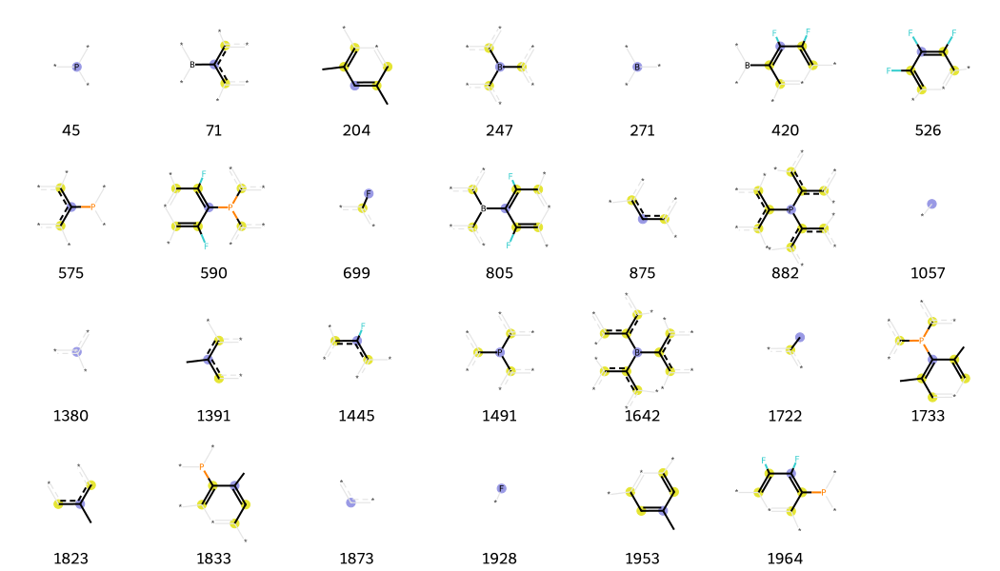


=== FLP #1 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)B
<class 'IPython.core.display.SVG'>


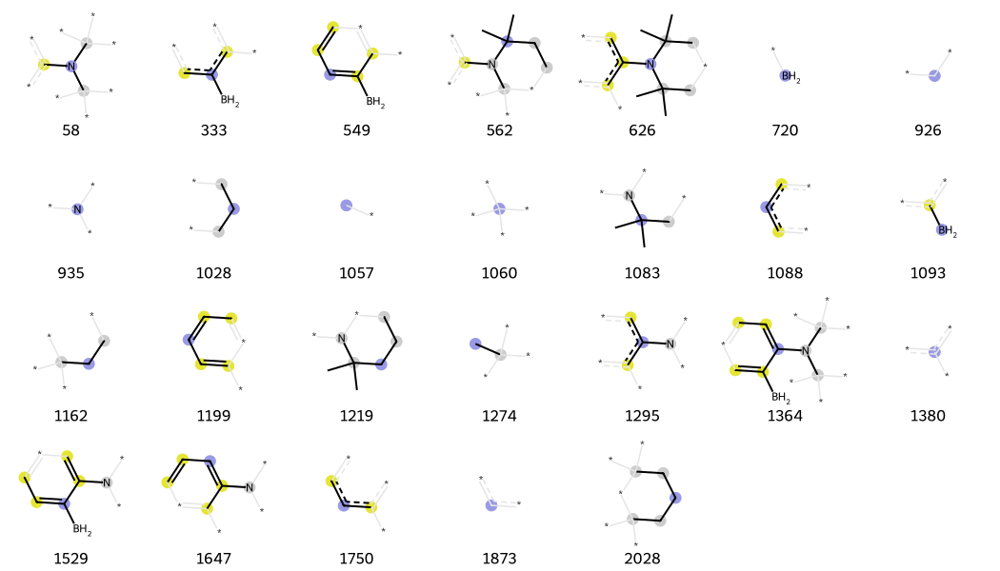


=== FLP #2 ===
SMILES: P1(B(c2cccc3cccc1c23)c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C
<class 'IPython.core.display.SVG'>


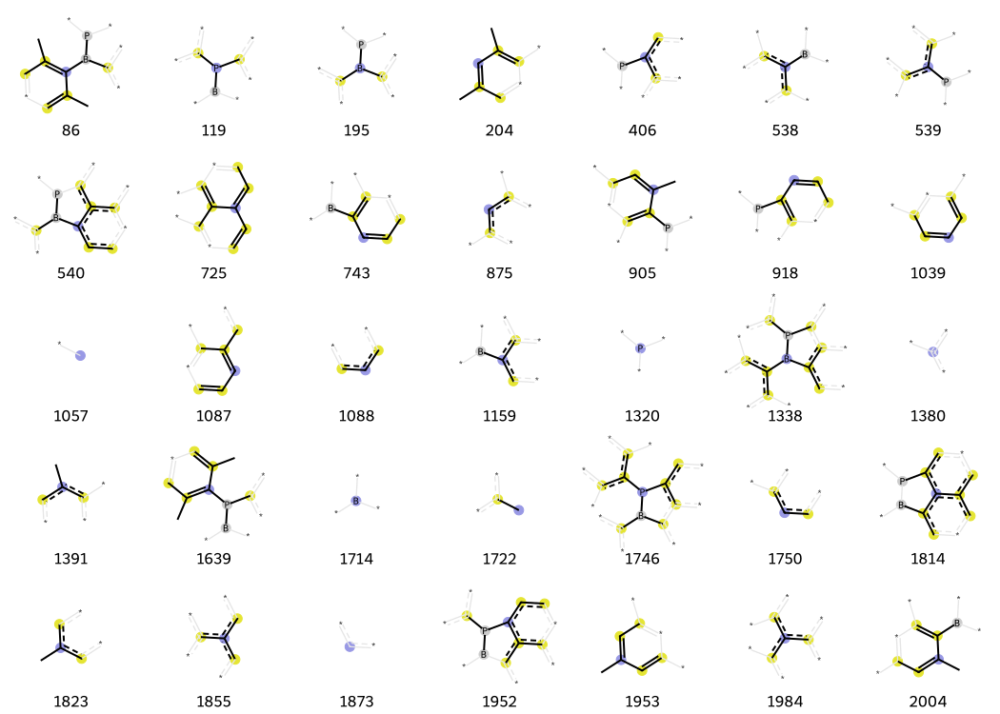

In [5]:
import pandas as pd
import numpy as np
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, Draw
from IPython.display import SVG, display

# 1) Load CSV with FLP SMILES
csv_path = "flp_xyz_smiles_obabelonly.csv"  # adjust path if needed
df = pd.read_csv(csv_path)

print("Rows in CSV:", len(df))
print(df.head())

# 2) Helper: SMILES → Morgan fingerprint + bit_info (for visualization)
def smiles_to_morgan_with_bitinfo(smiles, radius=2, n_bits=2048):
    """
    Convert a SMILES string to:
      - RDKit Mol
      - Morgan fingerprint (ExplicitBitVect)
      - bit_info dict: bit_idx -> list[(atom_idx, radius)]
    Returns (mol, fp, bit_info) or (None, None, None) if invalid.
    """
    if pd.isna(smiles):
        return None, None, None

    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        # RDKit couldn't parse this SMILES (valence error, etc.)
        return None, None, None

    bit_info = {}
    fp = AllChem.GetMorganFingerprintAsBitVect(
        mol,
        radius=radius,
        nBits=n_bits,
        bitInfo=bit_info,   # fills bit_info in-place
    )

    return mol, fp, bit_info


# 3) Compute Morgan fingerprint + bit_info for all FLPs
mols = []
fps = []
bit_infos = []

for idx, smi in df["smiles"].items():
    mol, fp, bit_info = smiles_to_morgan_with_bitinfo(smi)
    mols.append(mol)
    fps.append(fp)
    bit_infos.append(bit_info)

df["mol"] = mols
df["fp"] = fps
df["bit_info"] = bit_infos

valid_mask = df["mol"].notnull()
print("Valid SMILES (can be visualized):", valid_mask.sum())


# 4) Helper to draw Morgan bits for one FLP row
def draw_morgan_bits_for_row(row, mols_per_row=7, max_bits=None):
    """
    Given a row with 'mol', 'fp', 'bit_info':
      - builds the (mol, bit, bit_info) tuples
      - returns an SVG string of the Morgan-bit environments
    """
    mol = row["mol"]
    fp = row["fp"]
    bit_info = row["bit_info"]

    if mol is None or fp is None or bit_info is None:
        return None

    on_bits = list(fp.GetOnBits())
    if max_bits is not None:
        on_bits = on_bits[:max_bits]  # avoid huge grids

    if not on_bits:
        return None

    tpls = [(mol, bit, bit_info) for bit in on_bits]
    legends = [str(bit) for bit in on_bits]

    svg_str = Draw.DrawMorganBits(
        tpls,
        molsPerRow=mols_per_row,
        legends=legends,
        useSVG=True,
    )  # returns SVG XML as a string

    return svg_str


# 5) Generate visualization SVGs for all valid FLPs
df["morgan_bits_svg"] = df.apply(draw_morgan_bits_for_row, axis=1)

valid_viz = df[df["morgan_bits_svg"].notnull()].reset_index(drop=True)
print("FLPs with visualizable Morgan bits:", len(valid_viz))


# 6) Example: display Morgan fingerprint visualization
#    for all FLPs (careful: lots of output) or just a few

for i in range(min(3, len(valid_viz))):
    print(f"\n=== FLP #{i} ===")
    print("SMILES:", valid_viz.loc[i, "smiles"])
    svg_obj = valid_viz.loc[i, "morgan_bits_svg"]
    print(type(svg_obj))   # will show <class 'IPython.core.display.SVG'>
    display(svg_obj)       # ✅ already an SVG object

# If you *really* want all:
# for i in range(len(valid_viz)):
#     print(f"\n=== FLP #{i} ===")
#     print("SMILES:", valid_viz.loc[i, 'smiles'])
#     display(SVG(valid_viz.loc[i, 'morgan_bits_svg']))


=== FLP #0 ===
SMILES: c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C)F)F)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)F)F


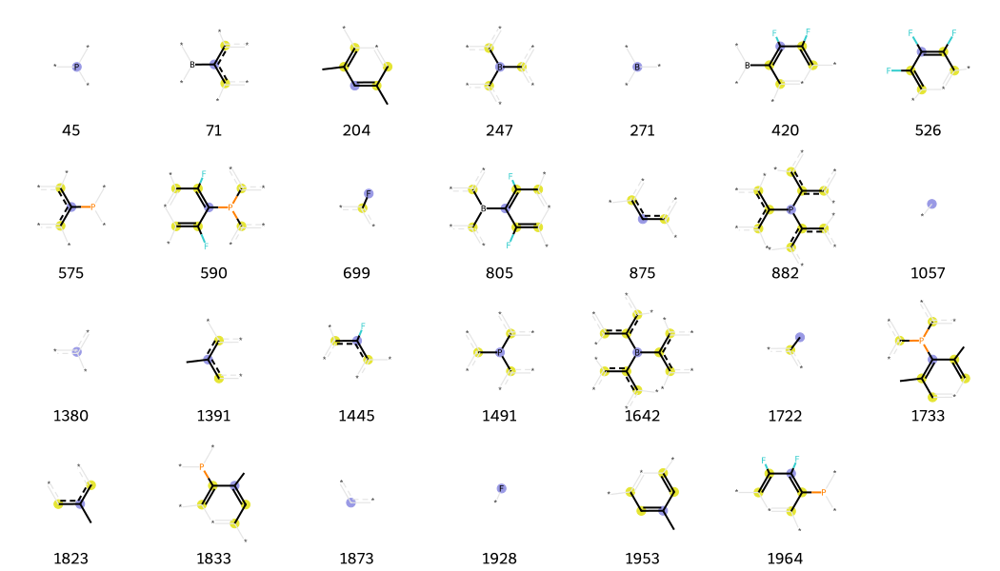


=== FLP #1 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)B


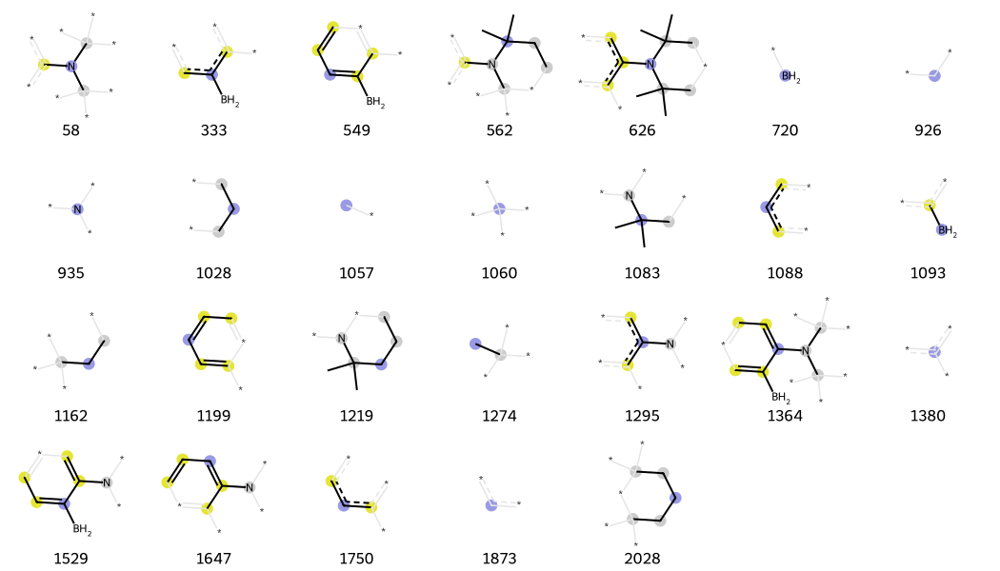


=== FLP #2 ===
SMILES: P1(B(c2cccc3cccc1c23)c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


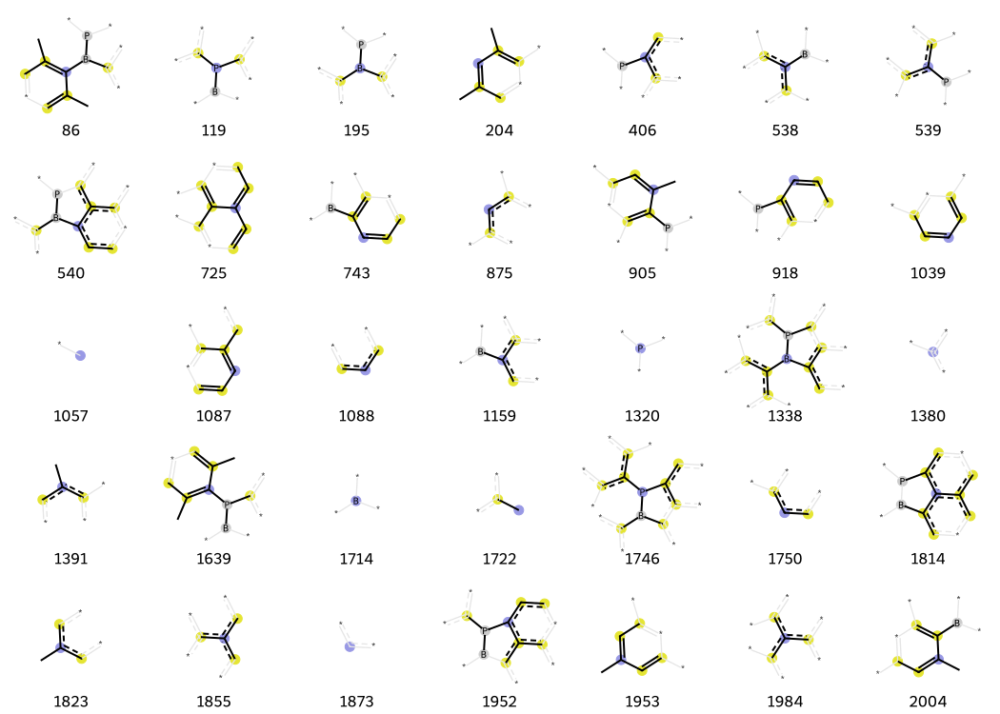


=== FLP #3 ===
SMILES: P1(B(c2cccc3cccc1c23)c1c(cccc1C)C)c1c(cccc1C)C


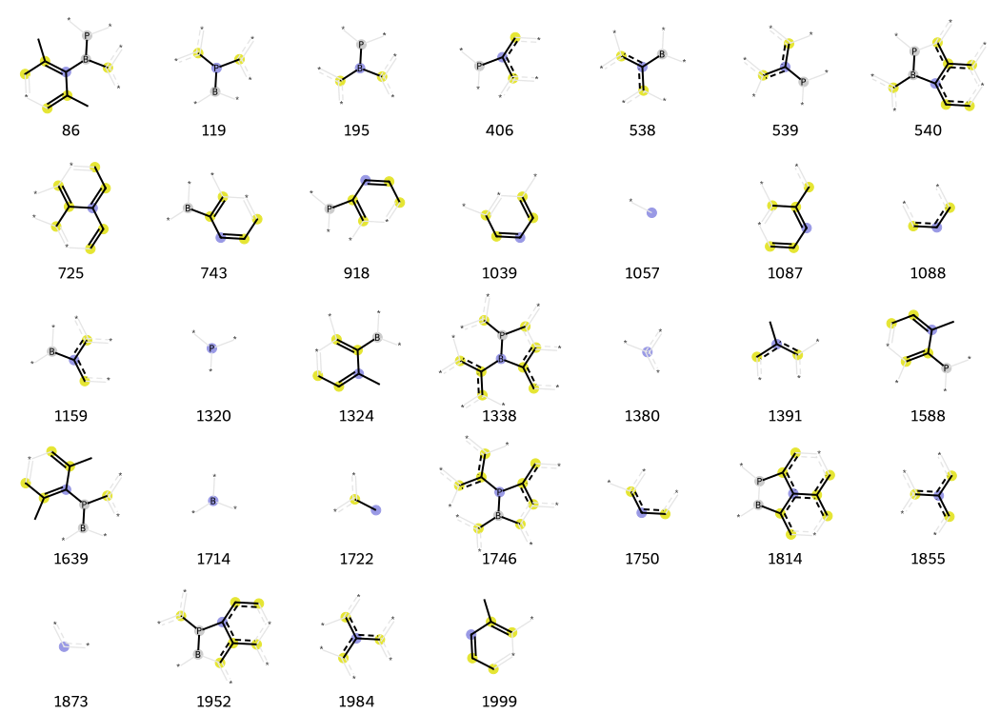


=== FLP #4 ===
SMILES: B(c1c2c(ccc3c2c(cc1)CC3)P(c1ccccc1)c1ccccc1)(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


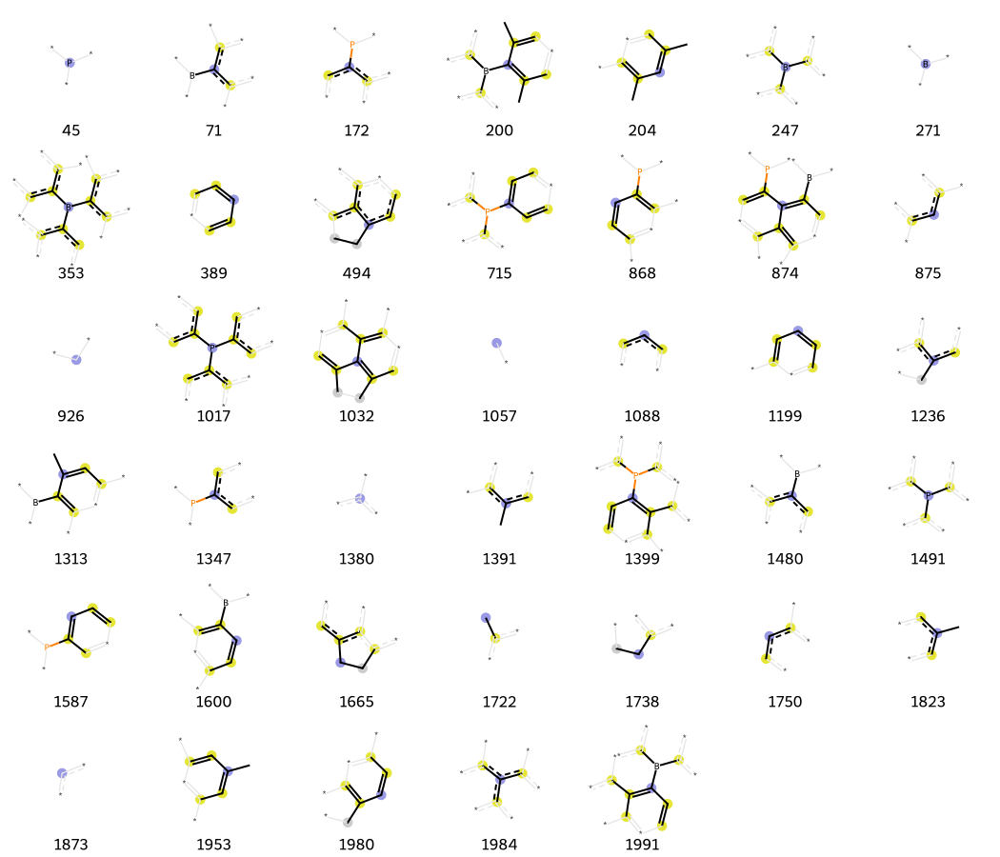


=== FLP #5 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)B(Cl)Cl


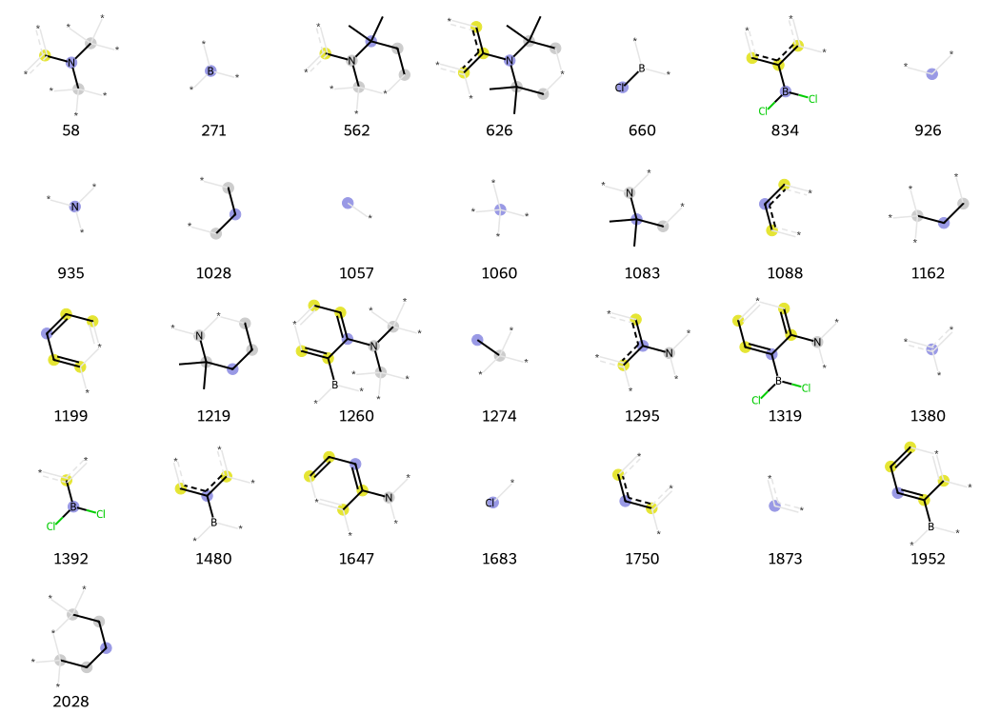


=== FLP #6 ===
SMILES: P(c1ccccc1)(c1c2-c3c(cccc3-c2ccc1)B(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C)c1ccccc1


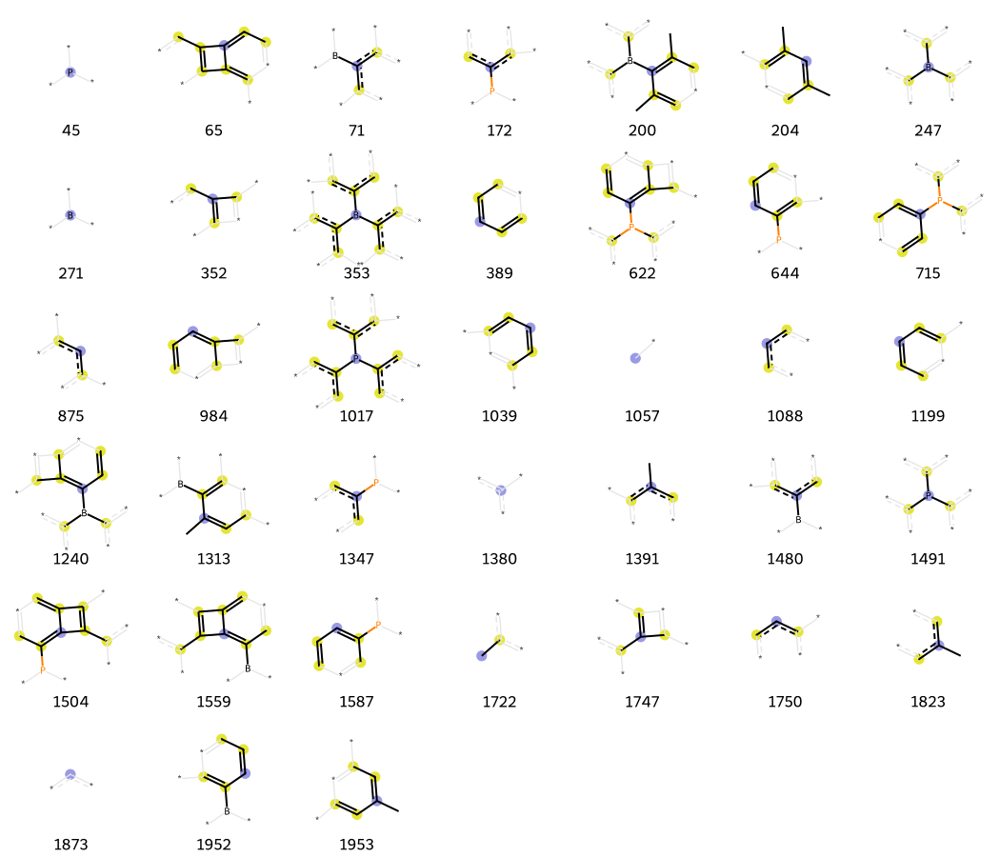


=== FLP #7 ===
SMILES: P(c1cccc2-c3cccc(c3-c12)B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


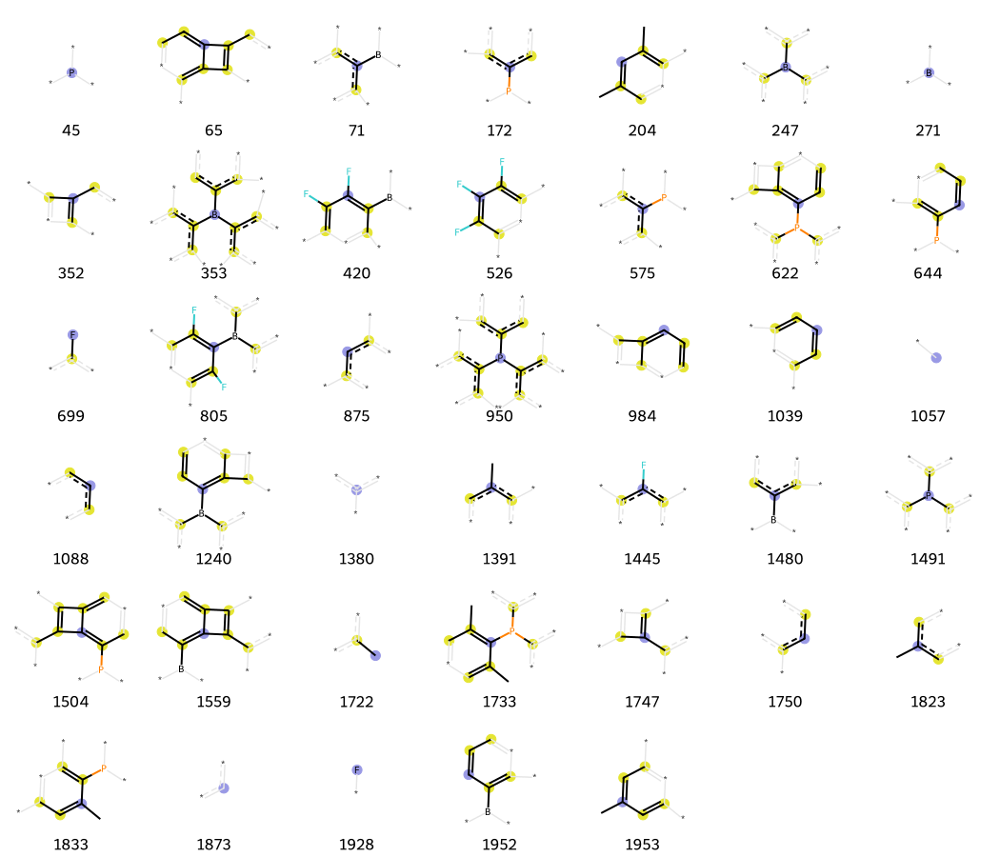


=== FLP #8 ===
SMILES: P(c1ccccc1B(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C)(C1CCCCC1)C1CCCCC1


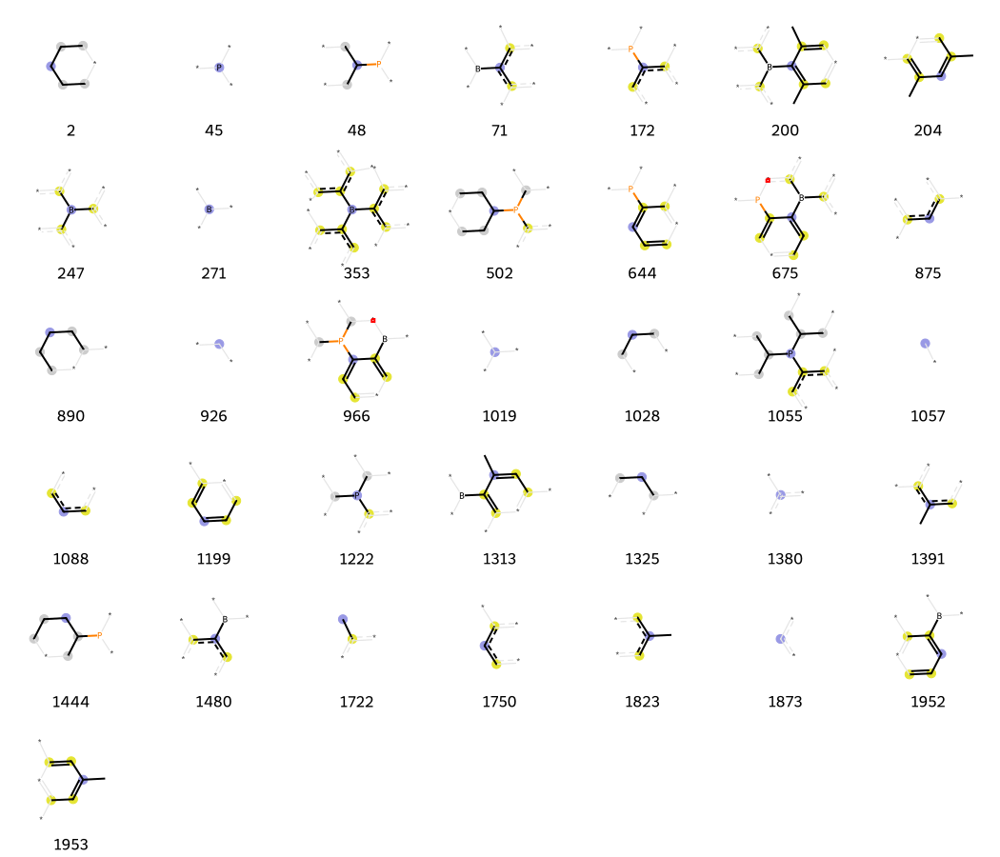


=== FLP #9 ===
SMILES: B([C@H]1[C@H](N2CCCCC2)CCC1)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


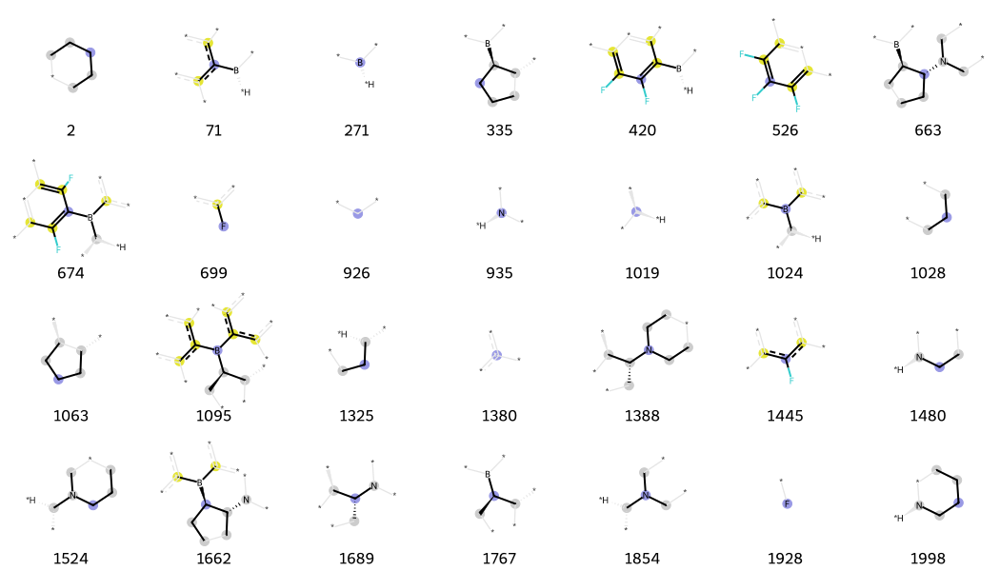


=== FLP #10 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)BCl


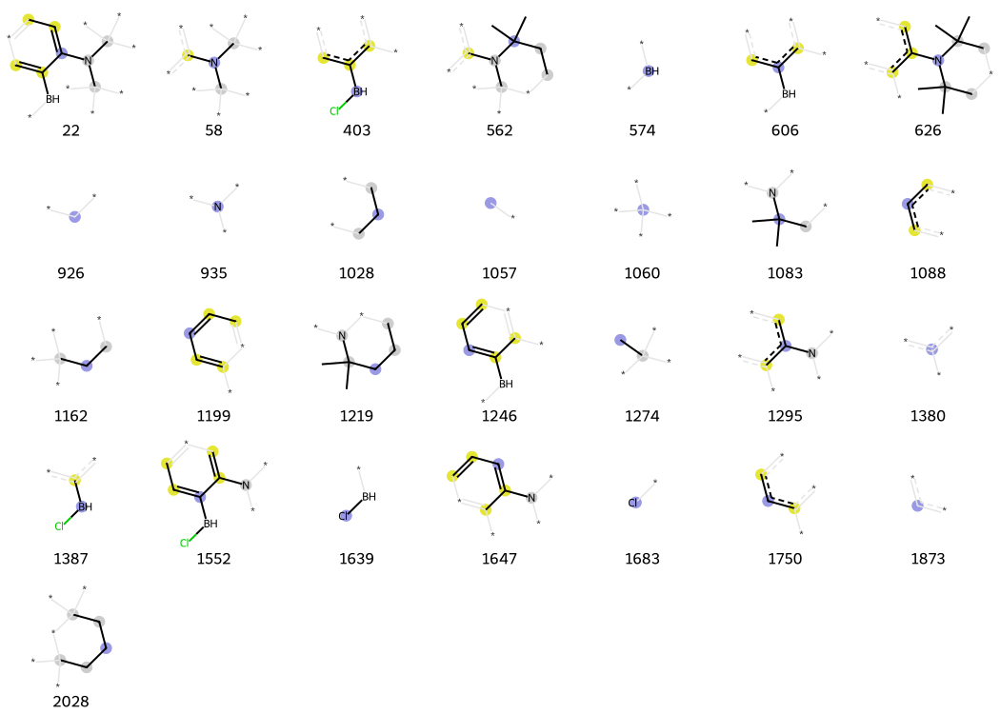


=== FLP #11 ===
SMILES: N1(CCCB(c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)C(CCCC1(C)C)(C)C


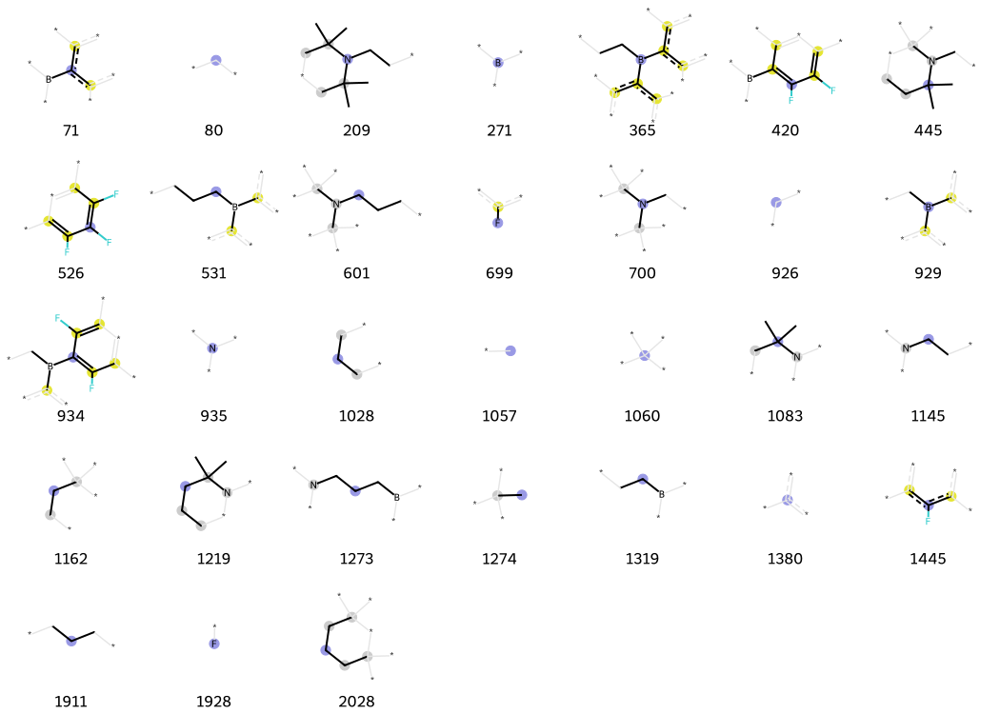


=== FLP #12 ===
SMILES: P(c1c(B(OC)OC)cccc1)(c1ccccc1)c1ccccc1


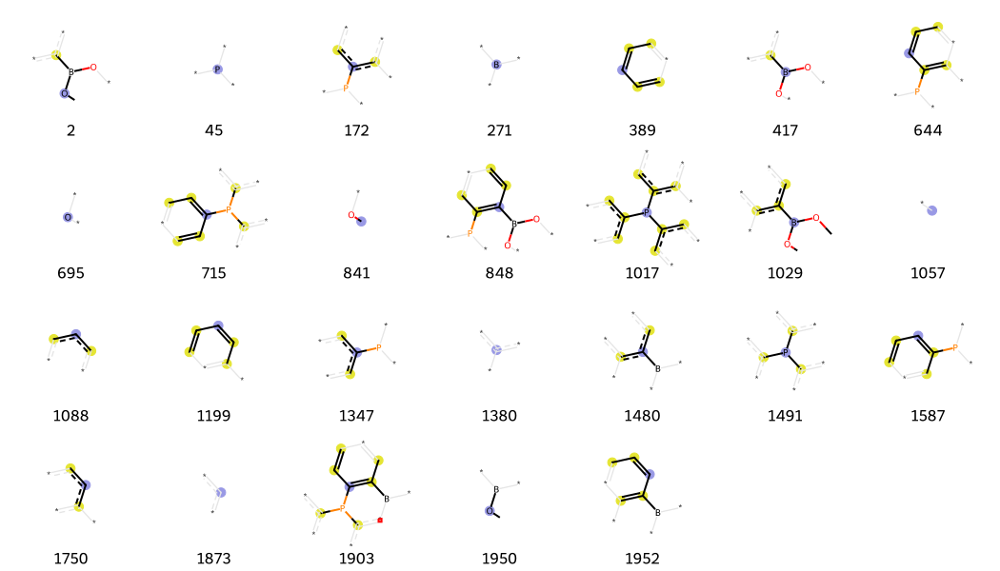


=== FLP #13 ===
SMILES: P(c1c(B2OC(C(O2)(C)C)(C)C)cccc1)(c1ccccc1)c1ccccc1


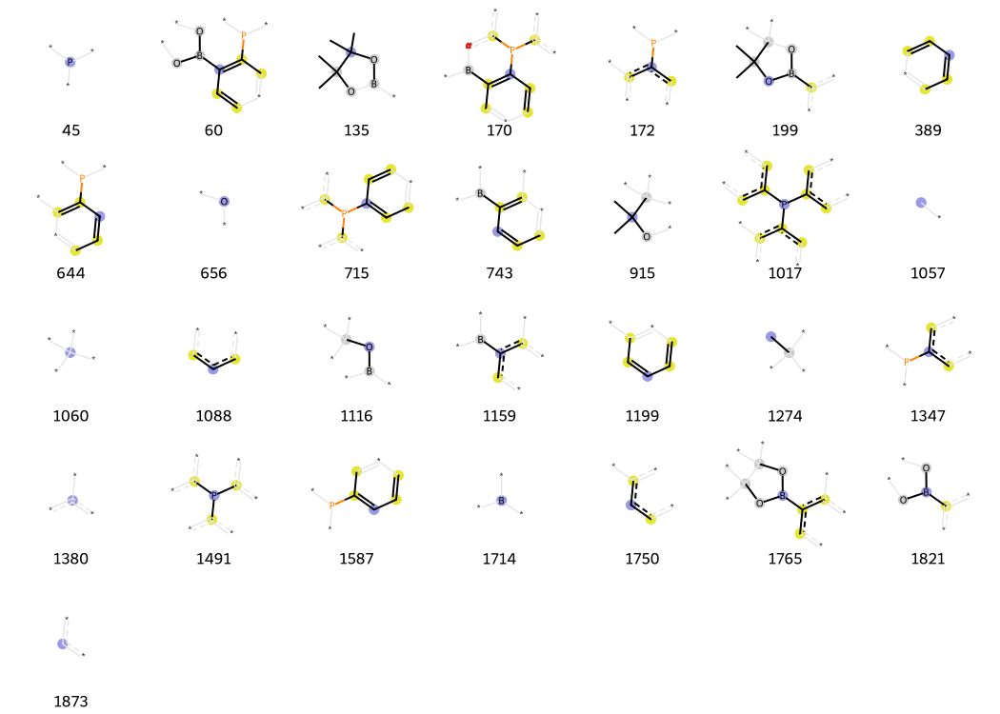


=== FLP #14 ===
SMILES: P(c1c(B2OCC(CO2)(C)C)cccc1)(c1ccccc1)c1ccccc1


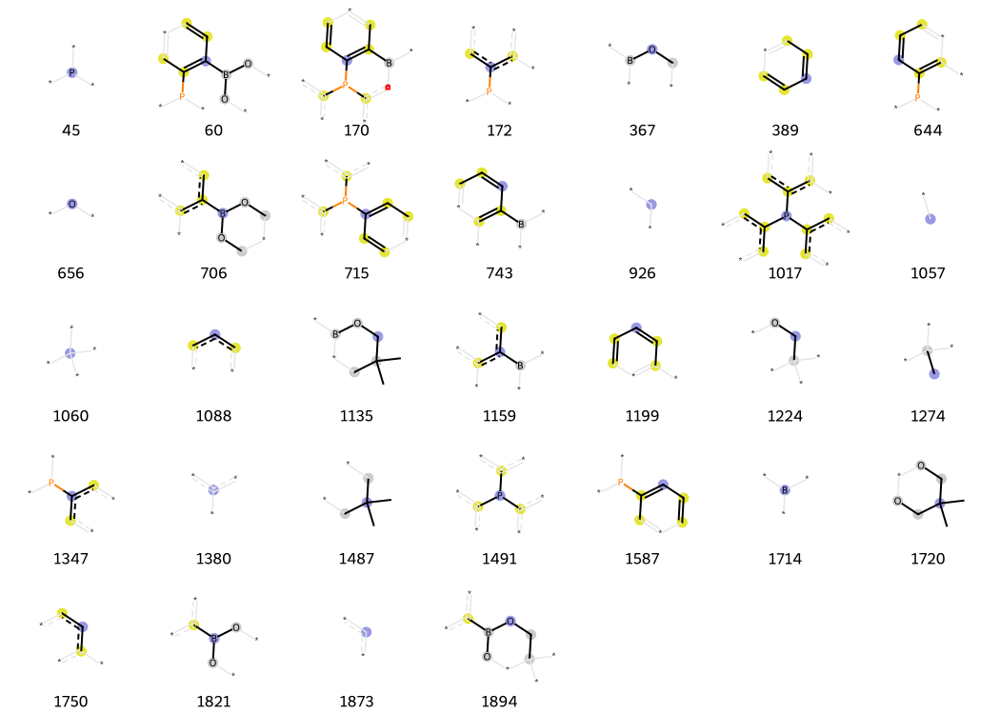


=== FLP #15 ===
SMILES: P(c1c(B(OC)OC)cccc1)(C(C)C)C(C)C


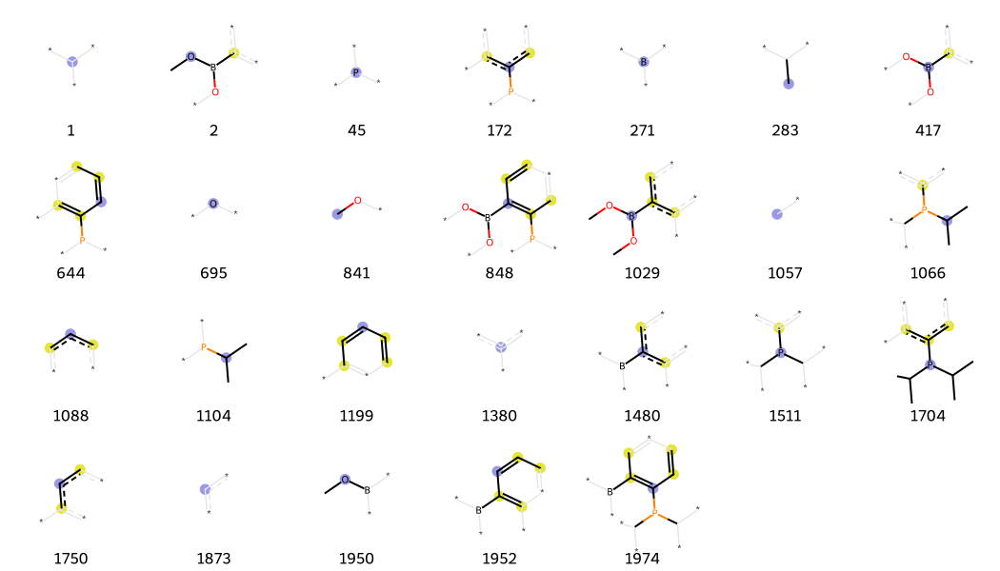


=== FLP #16 ===
SMILES: P(c1c(b2oc3c(o2)cccc3)cccc1)(C(C)C)C(C)C


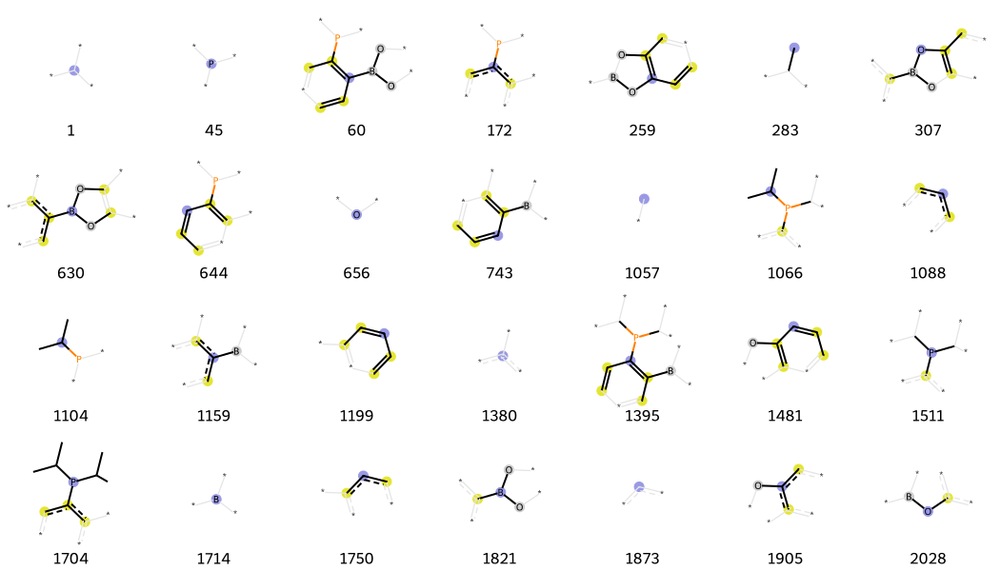


=== FLP #17 ===
SMILES: P(c1c(B2OC(C(O2)(C)C)(C)C)cccc1)(C(C)C)C(C)C


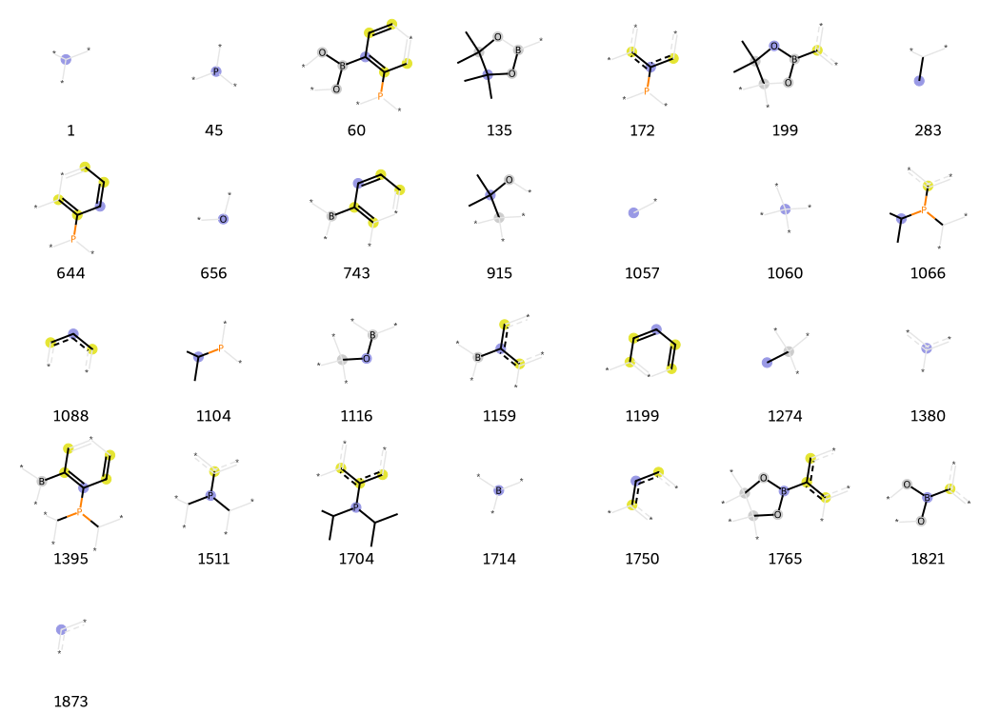


=== FLP #18 ===
SMILES: Cc1cc(C)cc(c1B(c1c(C)cc(C)cc1C)c1c(N(C)C)cccc1)C


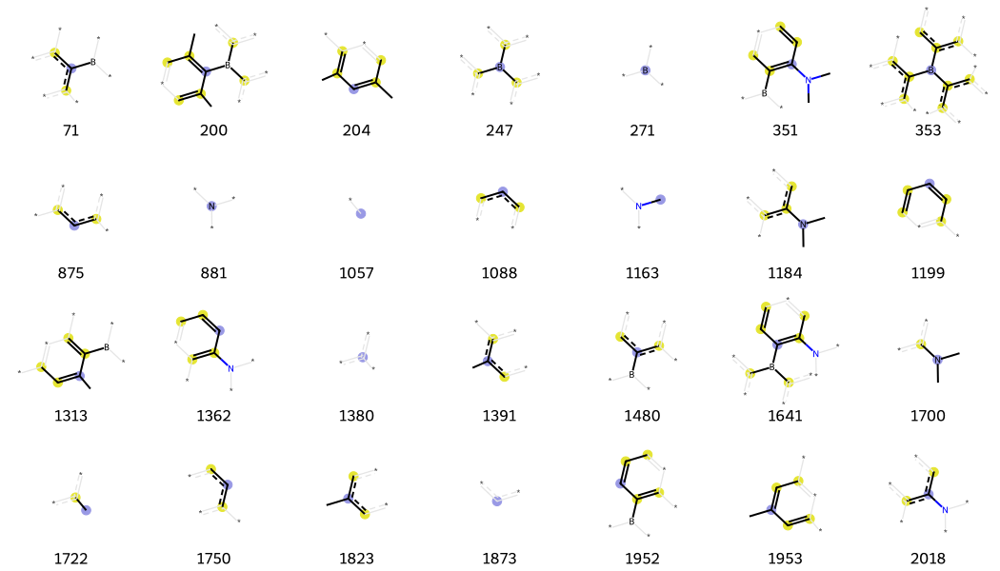


=== FLP #19 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)B(c1c(F)c(F)c(F)c(F)c1F)Cl


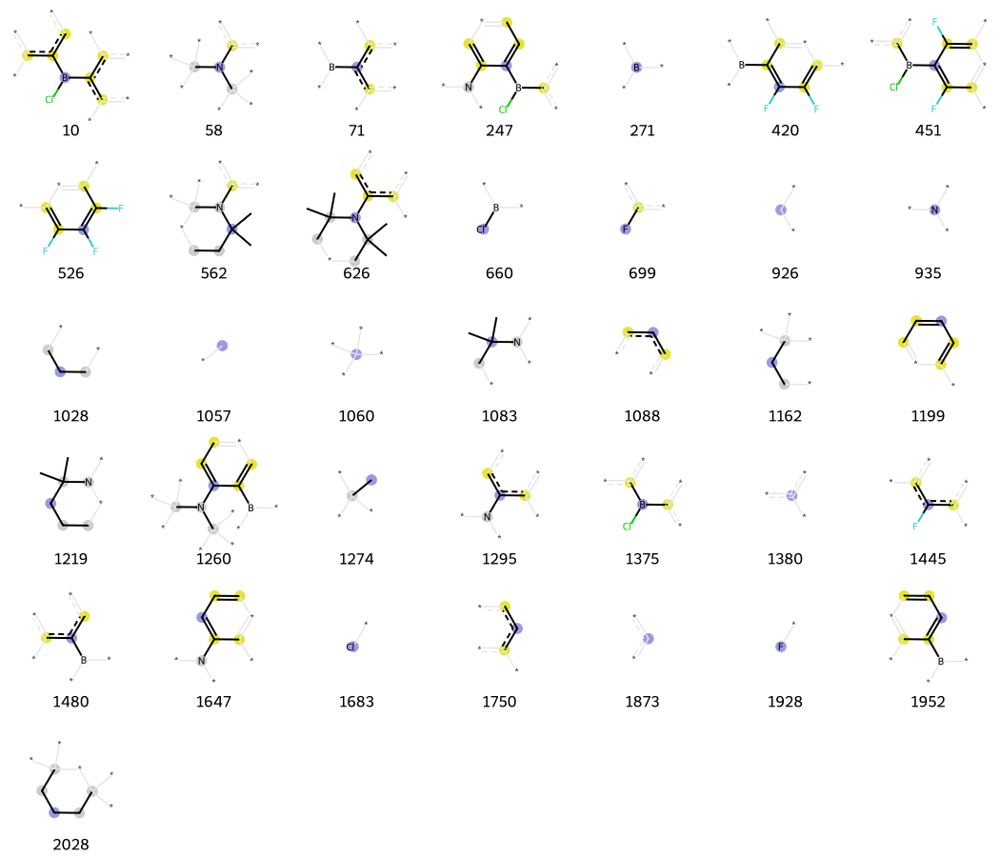


=== FLP #20 ===
SMILES: Cc1cc(C)c(C)cc1B(c1c(C)cc(C)c(C)c1)c1c(N(C)C)cccc1


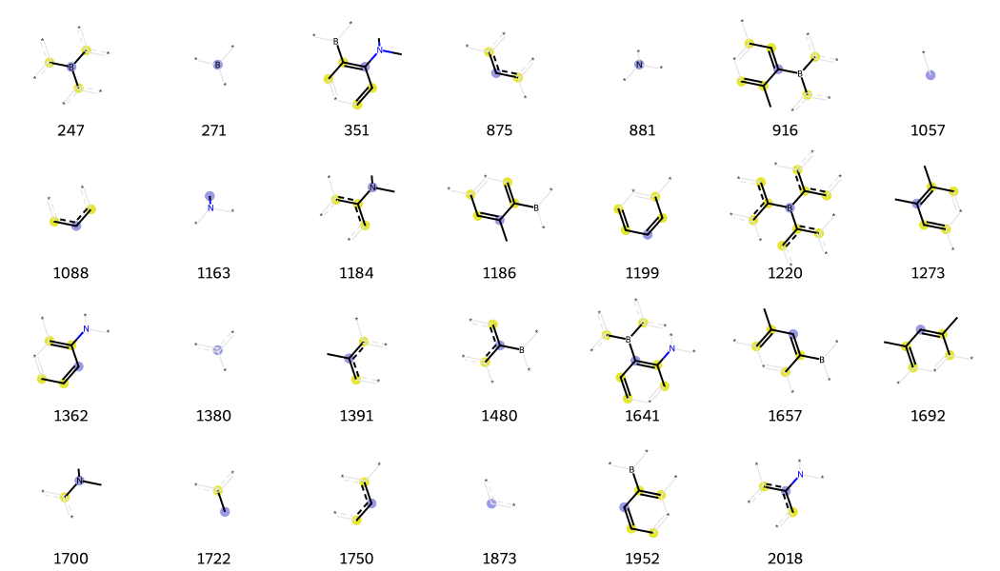


=== FLP #21 ===
SMILES: P(c1ccc([C@H]2[C@H](B(c3c(F)c(F)c(F)c(F)c3F)c3c(F)c(F)c(F)c(F)c3F)[C@H]3CC[C@@]2(C3(C)C)C)cc1)(C(C)(C)C)C(C)(C)C


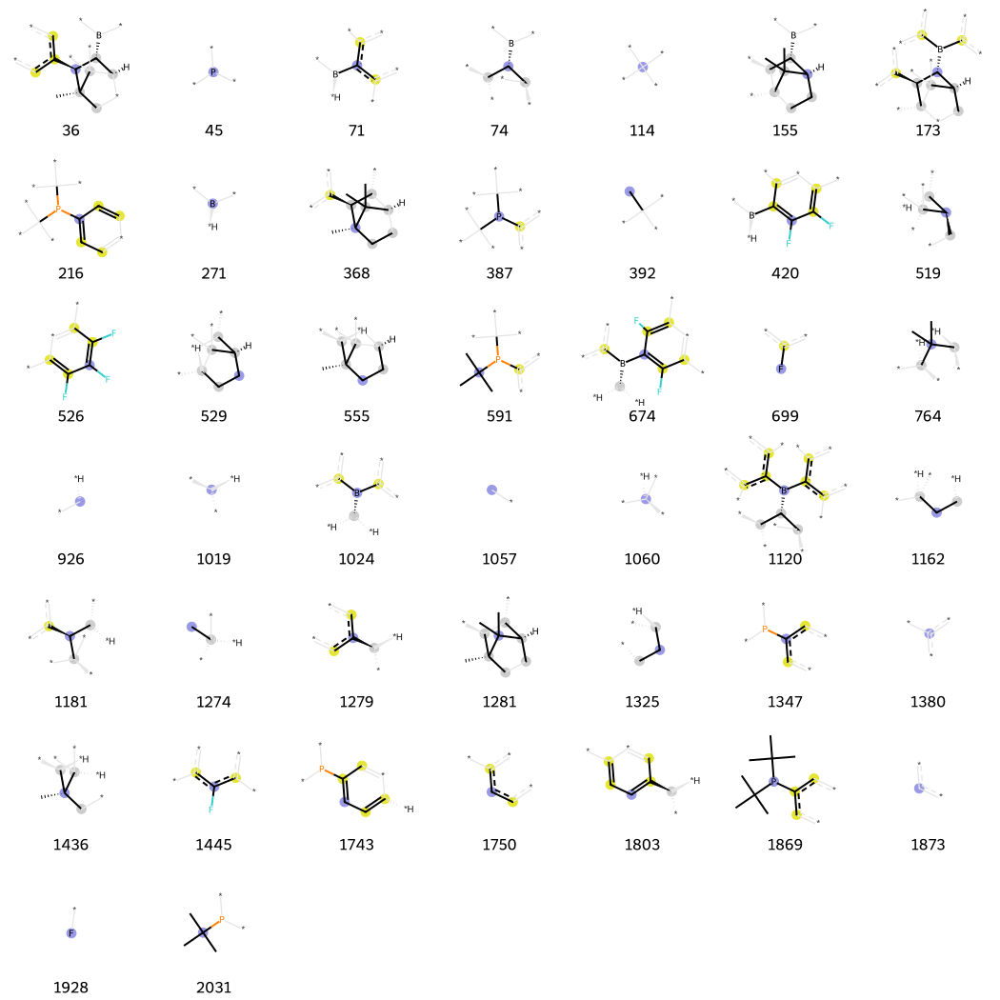


=== FLP #22 ===
SMILES: [C@]12([C@@H]([C@H]([C@@H](CC1)C2(C)C)B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)N1CCCCC1)C


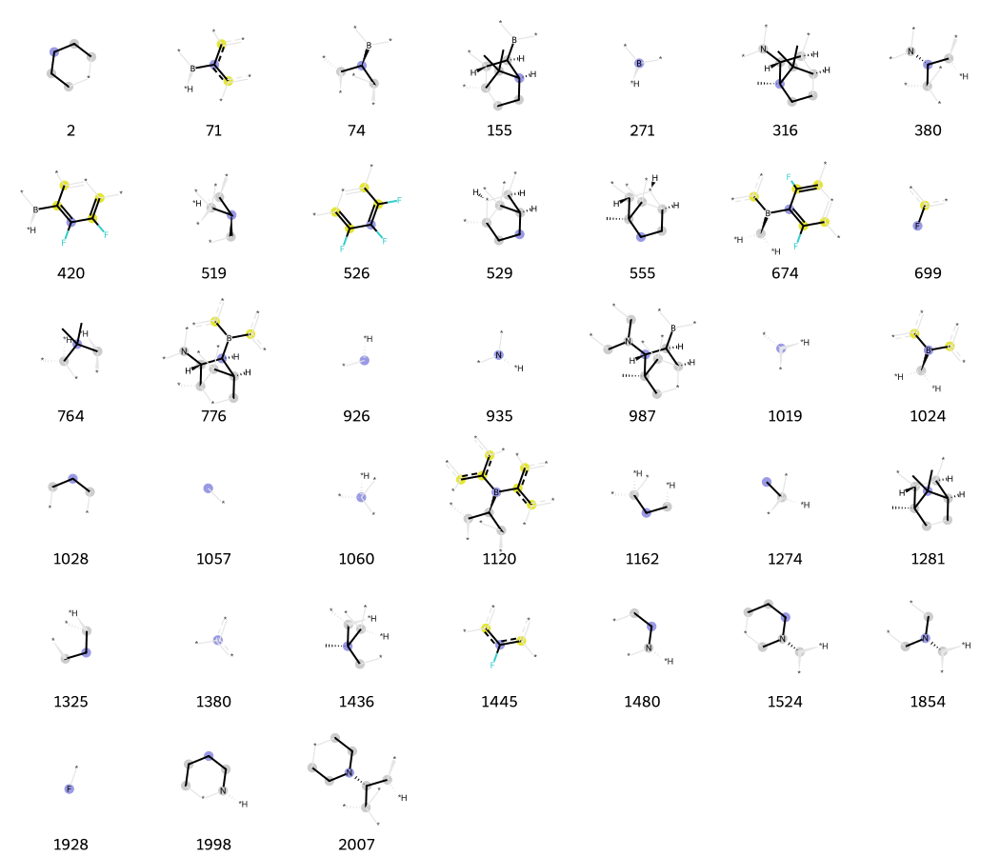


=== FLP #23 ===
SMILES: P(/C(=C(\B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)/c1c(F)c(F)c(F)c(F)c1F)/c1ccccc1)(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


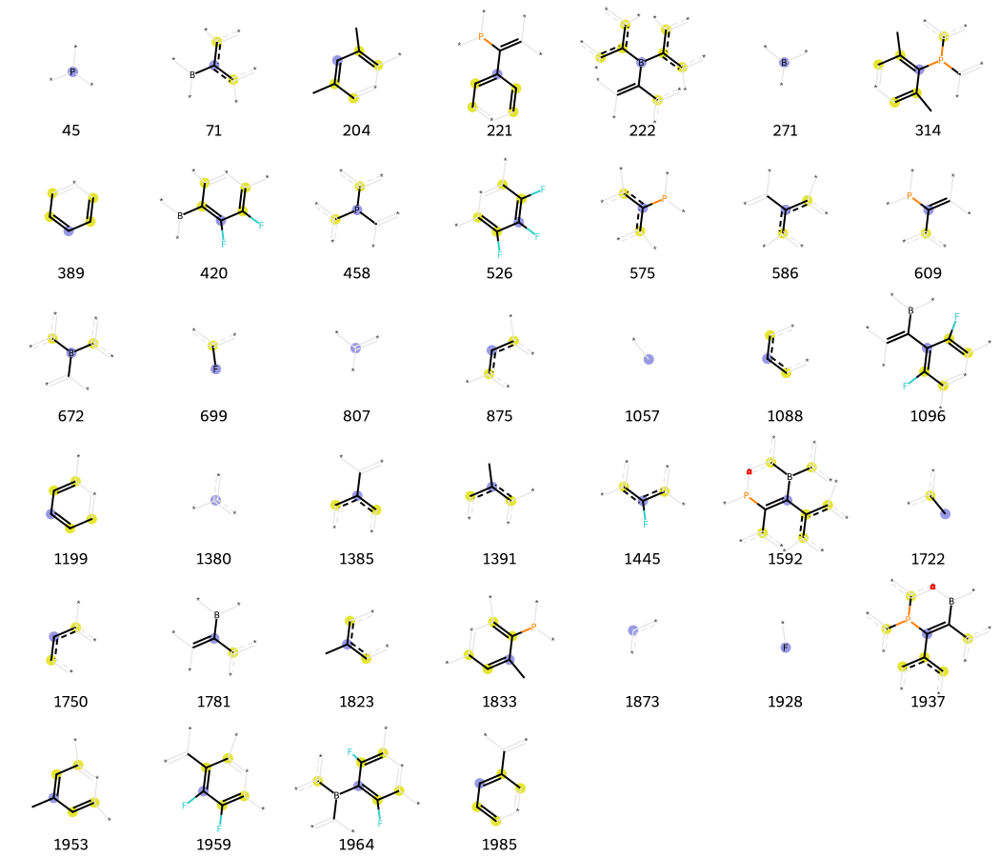


=== FLP #24 ===
SMILES: P([C@@H](CC)B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


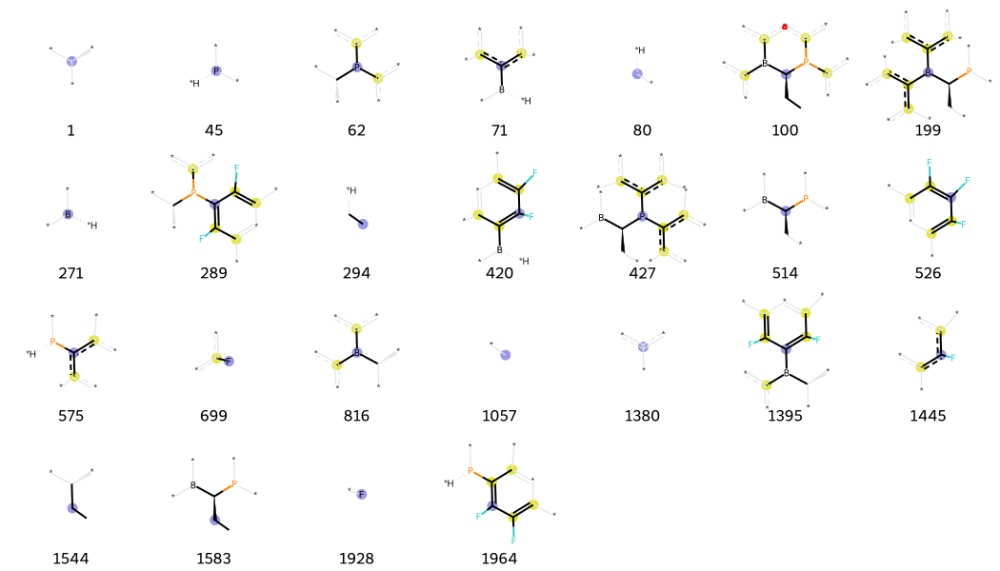


=== FLP #25 ===
SMILES: P([C@@H](CB(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


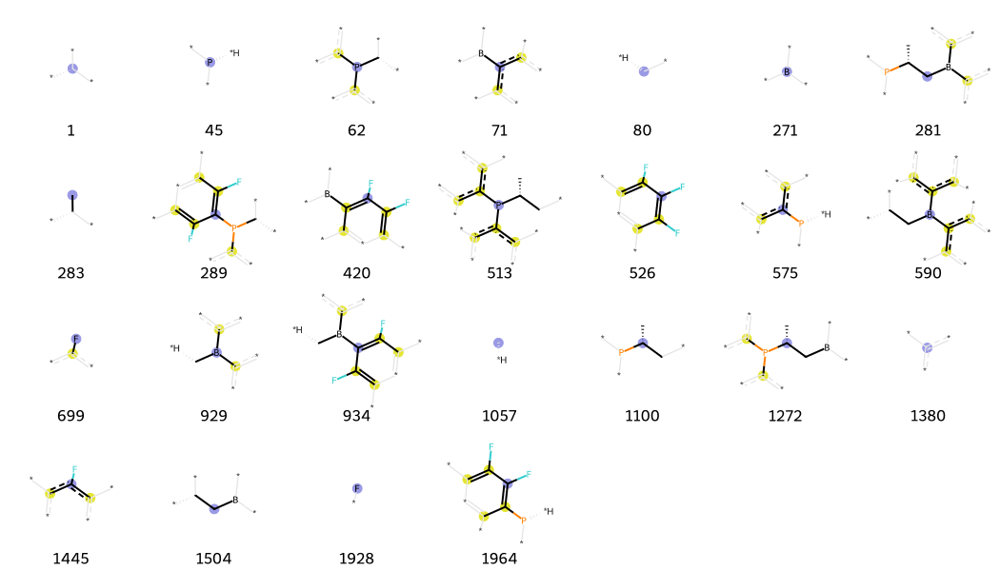


=== FLP #26 ===
SMILES: P(c1ccccc1)(/C(=C\C(C)(C)C)/[Al](CC)CC)CC


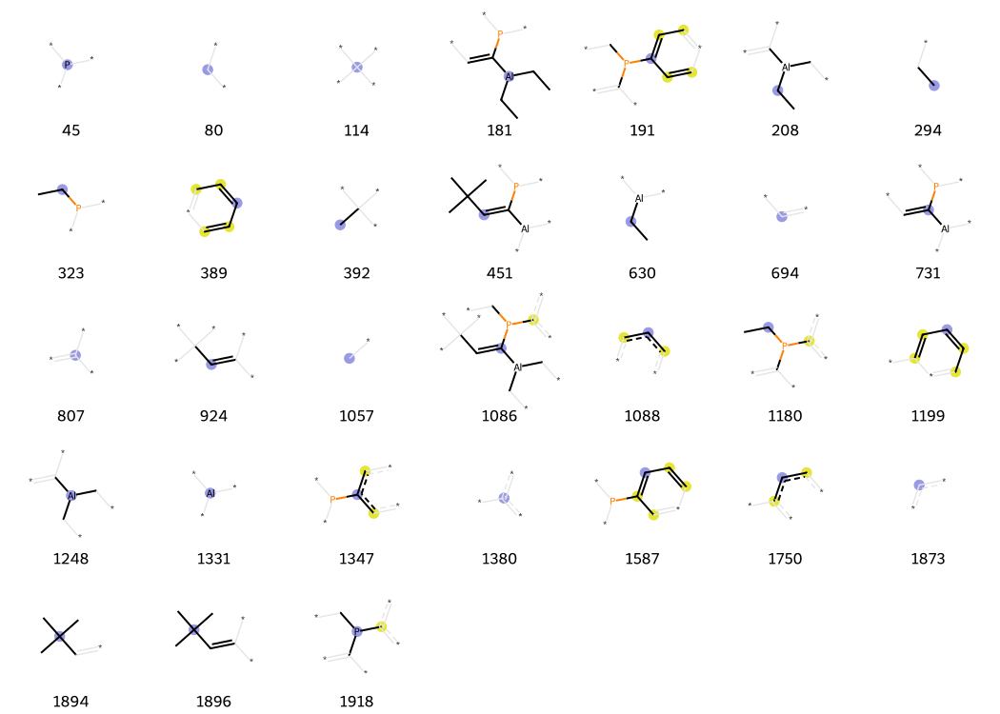


=== FLP #27 ===
SMILES: P([C@H]1[C@H](B(c2c(c(c(c(c2F)F)F)F)F)c2c(c(c(c(c2F)F)F)F)F)[C@H]2CC[C@@H]1C2)(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


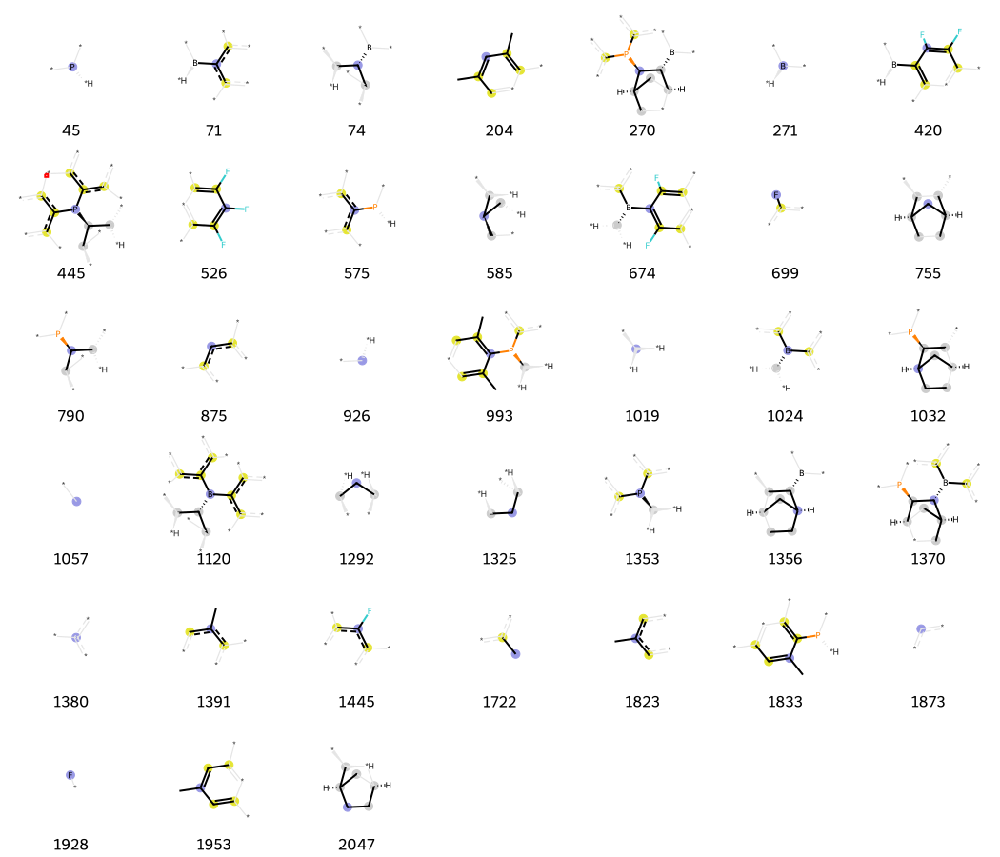


=== FLP #28 ===
SMILES: B(n1nc(cc1C(C)(C)C)C(C)(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


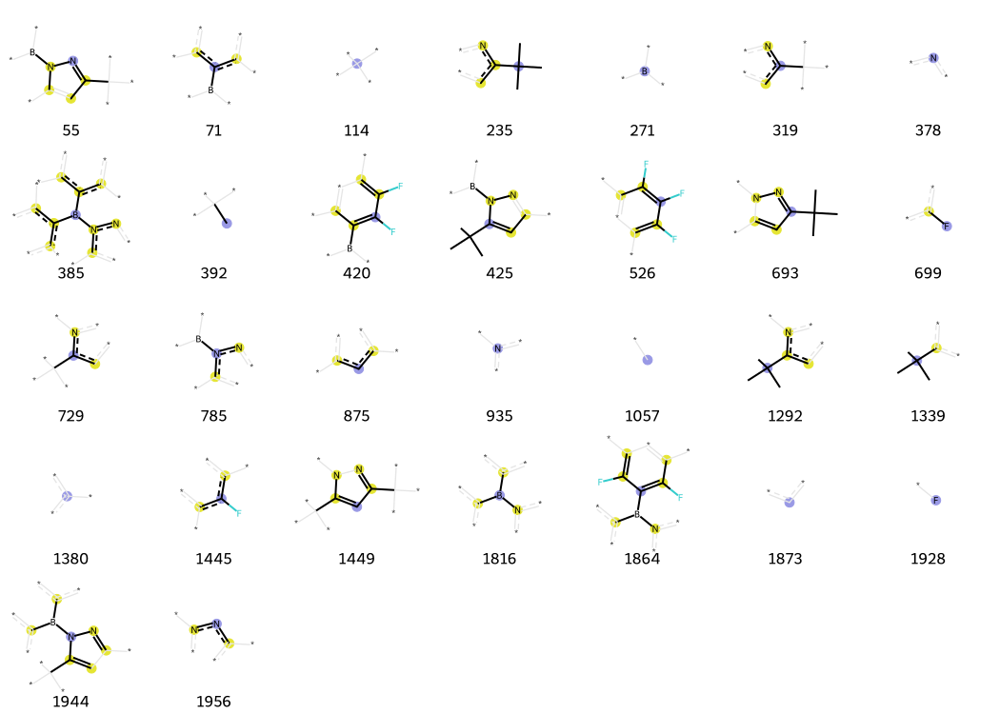


=== FLP #29 ===
SMILES: B(c1ccccc1CN1C(CCCC1(C)C)(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


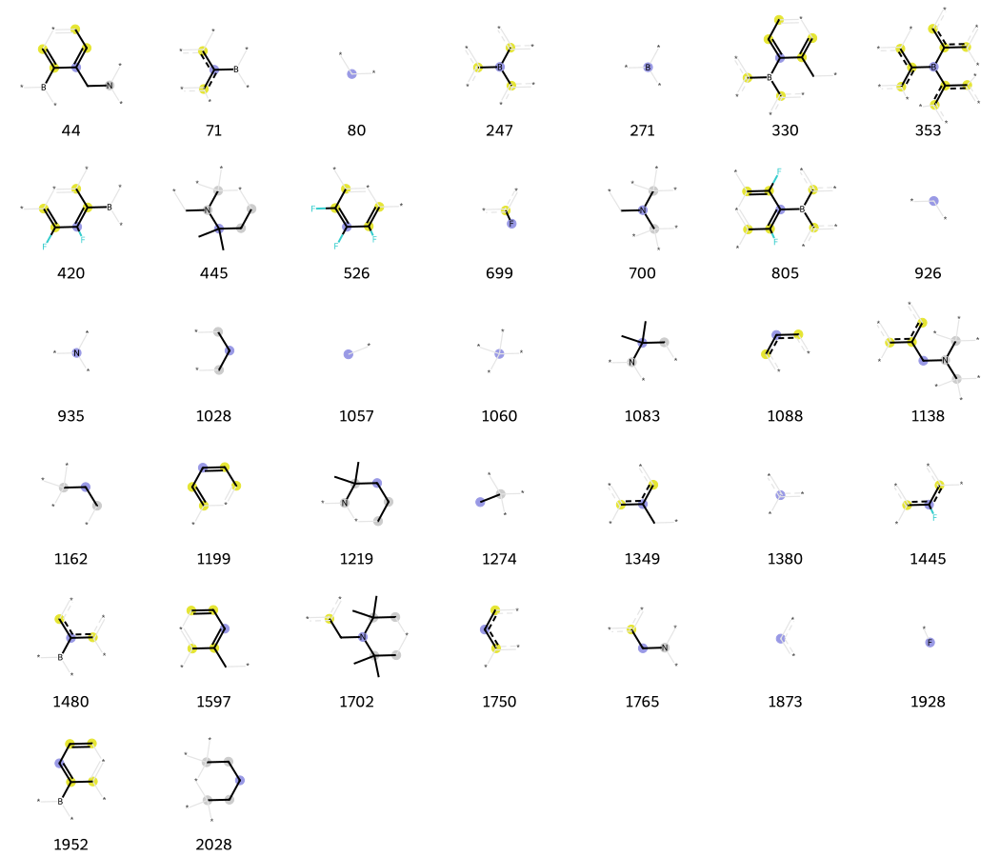


=== FLP #30 ===
SMILES: B(c1ccccc1CN1[C@@H](C(c2cccc(c12)C(C)C)(C)C)c1ccccc1)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


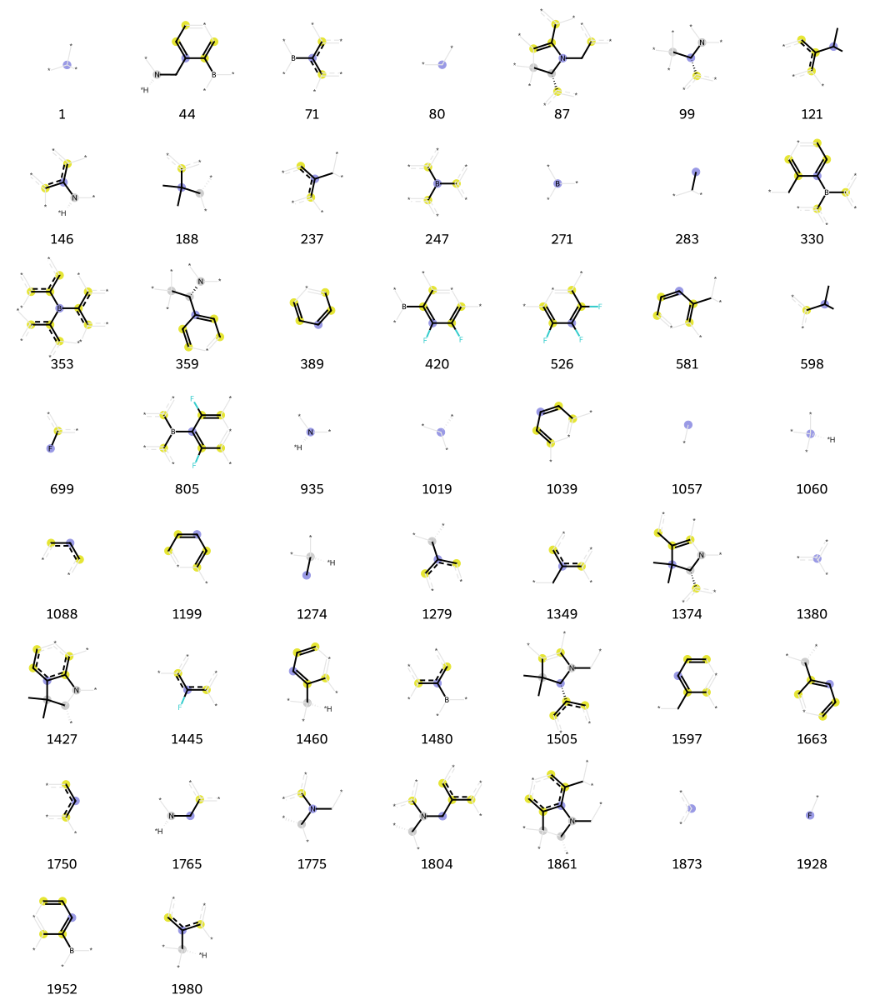


=== FLP #31 ===
SMILES: B(c1ccccc1CN1C(C[C@H](c2ccc(cc12)C)C)(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


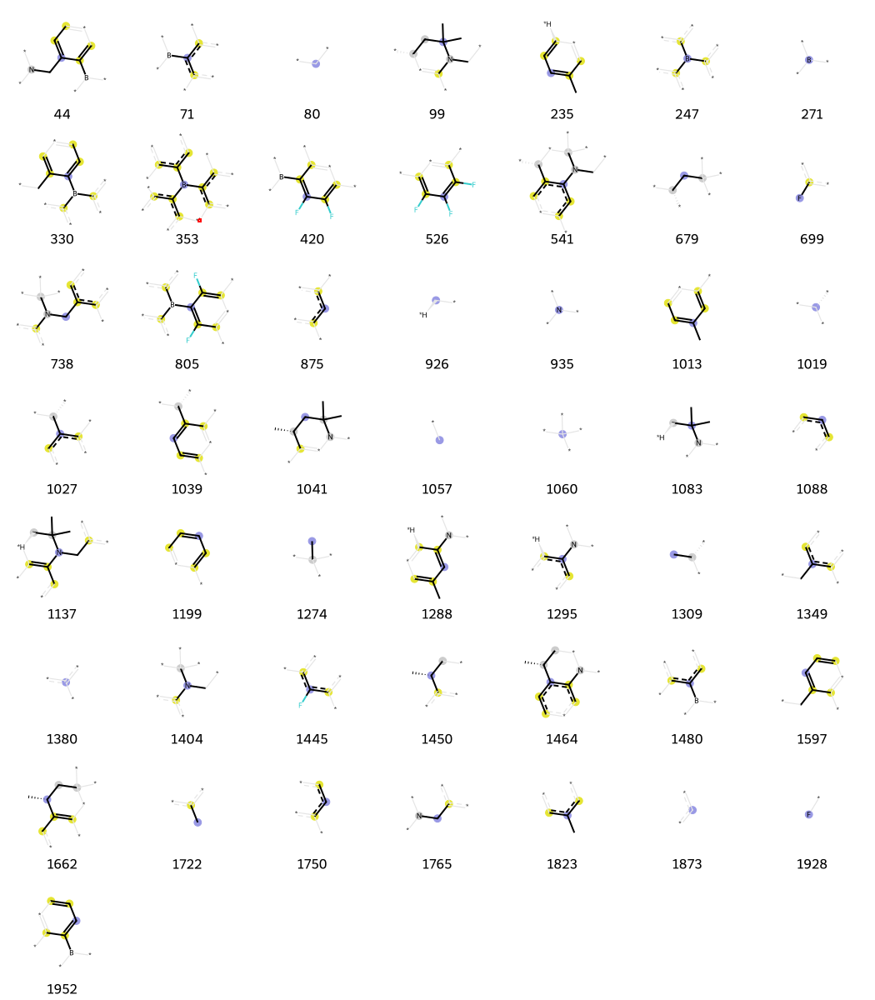


=== FLP #32 ===
SMILES: B(c1ccccc1CN1C(COCC1(C)C)(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


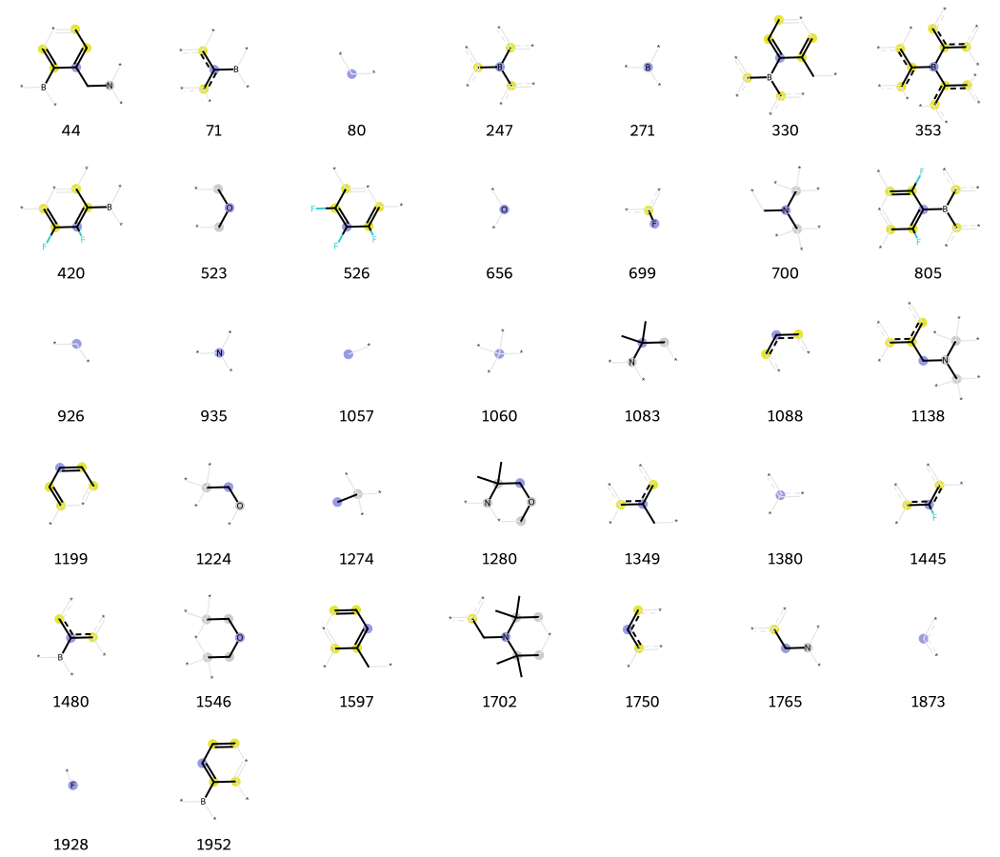


=== FLP #33 ===
SMILES: B(c1ccccc1CN1C(CCCC1(C)C)(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


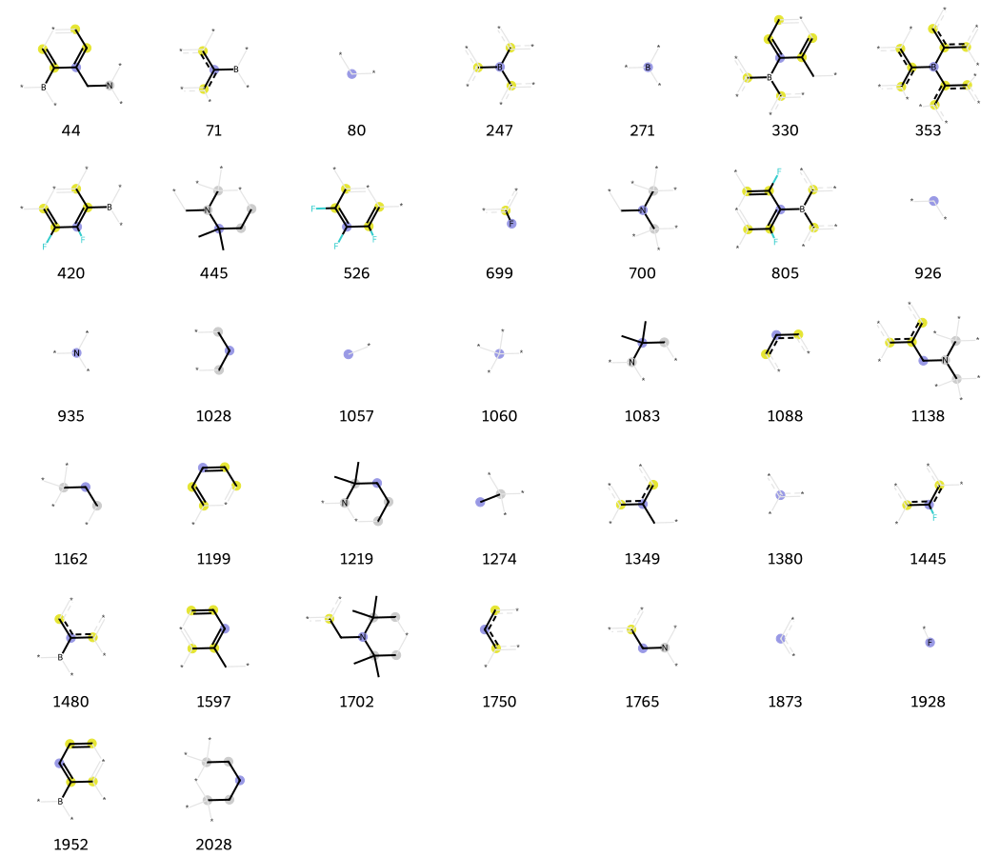


=== FLP #34 ===
SMILES: B(c1ccccc1CN1[C@@H](C(c2ccccc12)(C)C)c1ccccc1)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


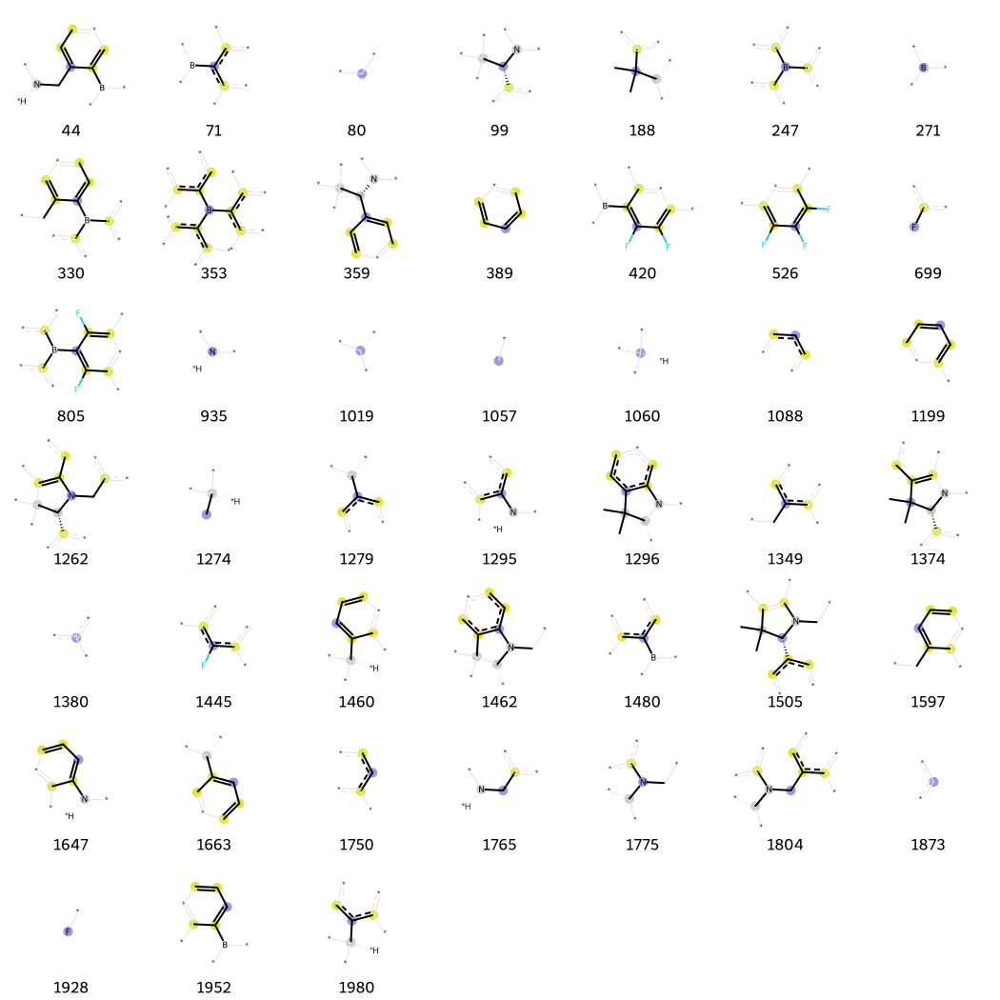


=== FLP #35 ===
SMILES: B(c1ccccc1CN1C(C)(C)C[C@@H](c2cccc(c12)C(C)C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


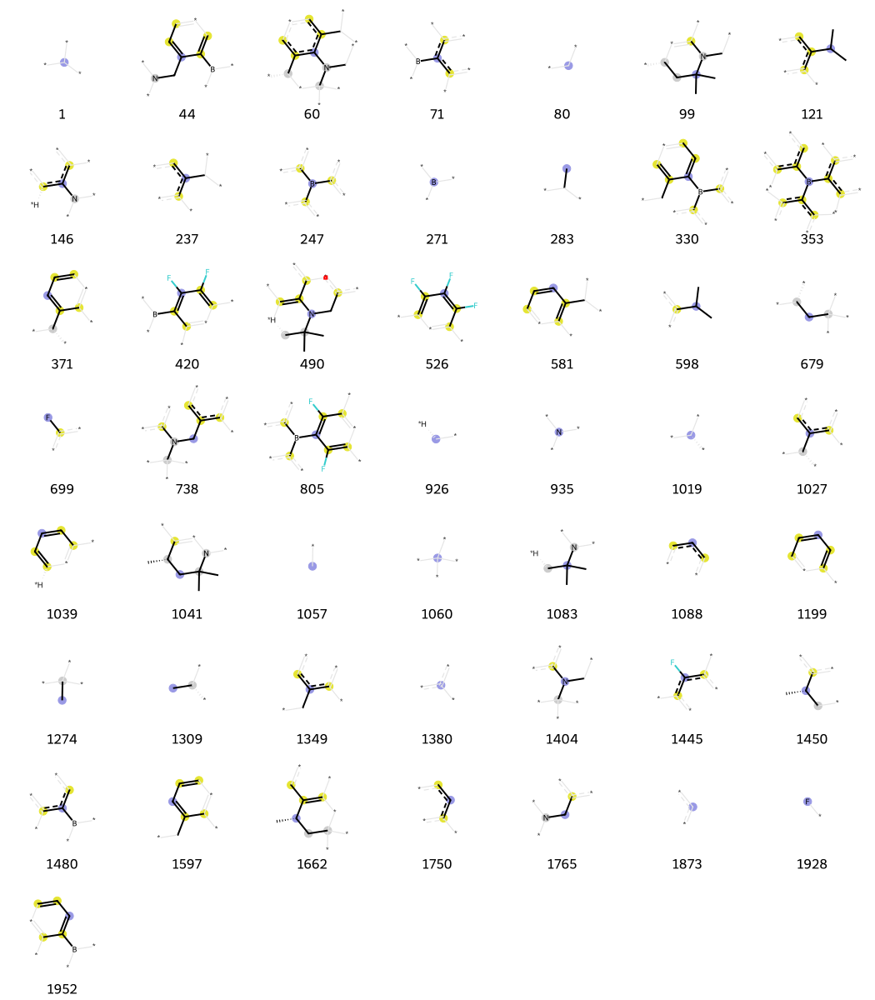


=== FLP #36 ===
SMILES: B(c1ccccc1CN1[C@@]2([C@](c3ccccc13)(C)CC[C@H](C2)C(C)C)c1ccccc1)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


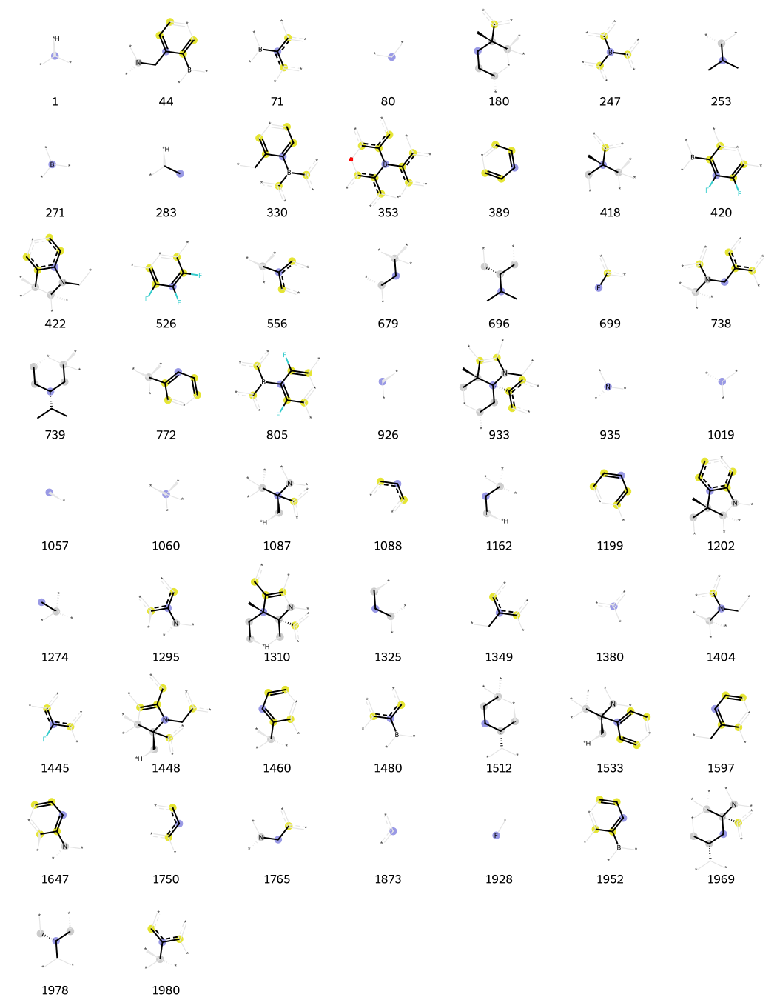


=== FLP #37 ===
SMILES: P(B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)(C1CCCCC1)C1CCCCC1


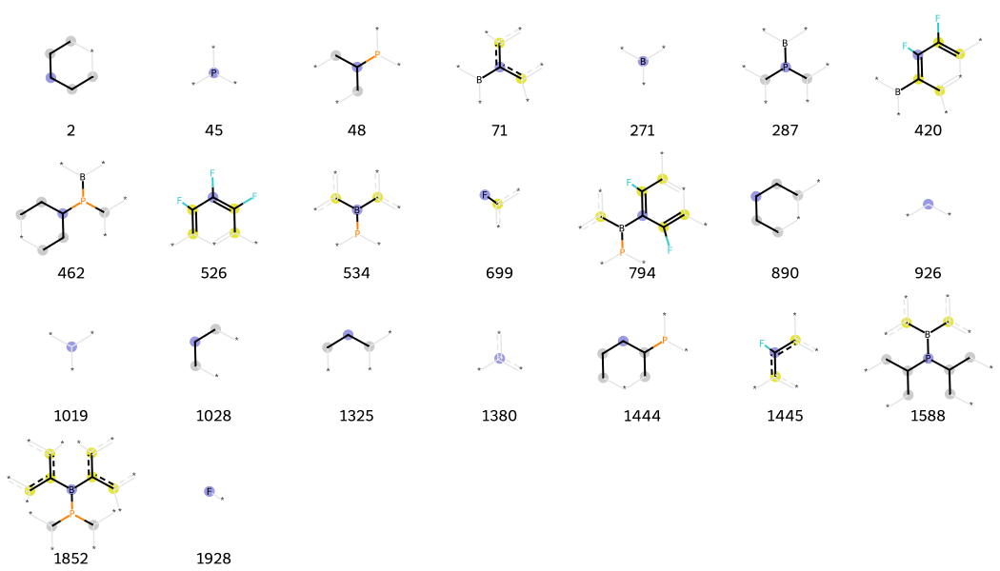


=== FLP #38 ===
SMILES: B(c1ccc2ccccc2c1c1c(ccc2ccccc12)N(C)C(C)C)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


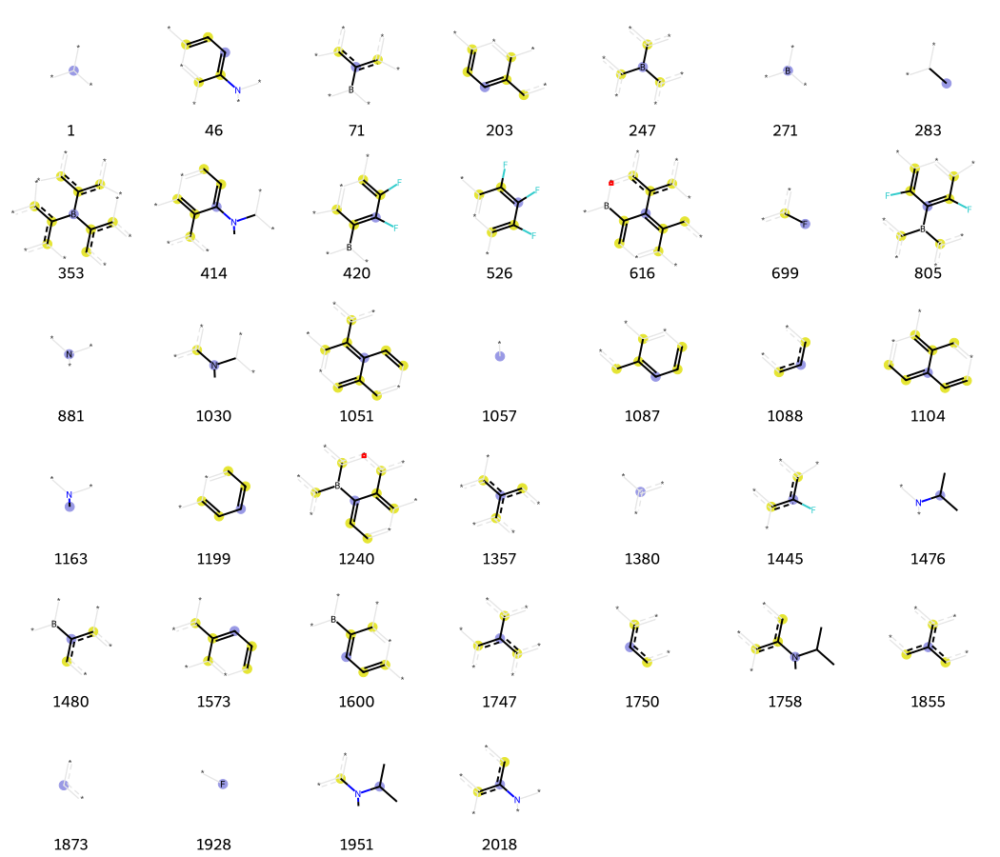


=== FLP #39 ===
SMILES: P1(F)(N(c2c1cccc2)C)(c1ccccc1)c1ccccc1


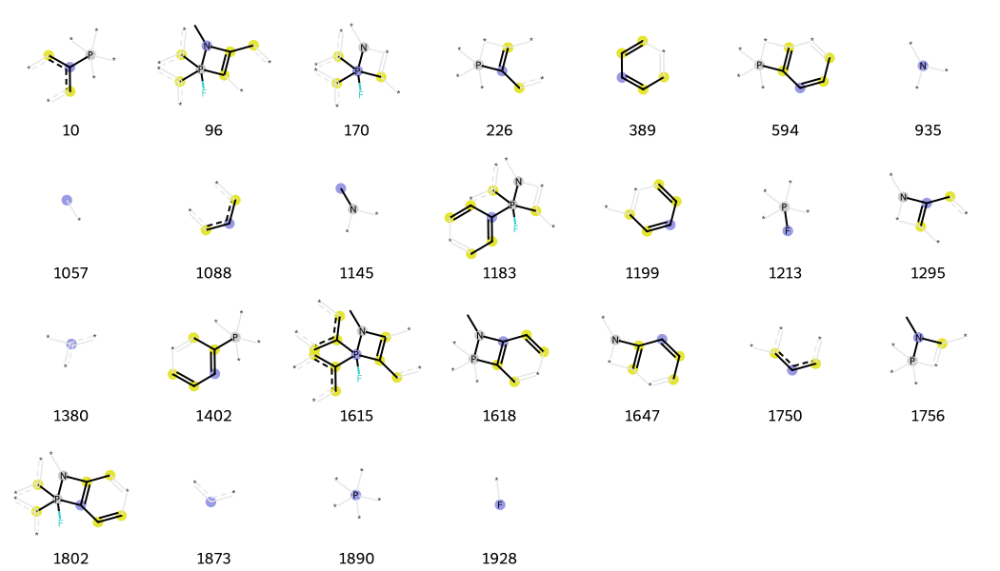


=== FLP #40 ===
SMILES: C(=C\N1CCN(C)CC1)(/[Si](C)(C)C)\[Al](CC(C)C)CC(C)C


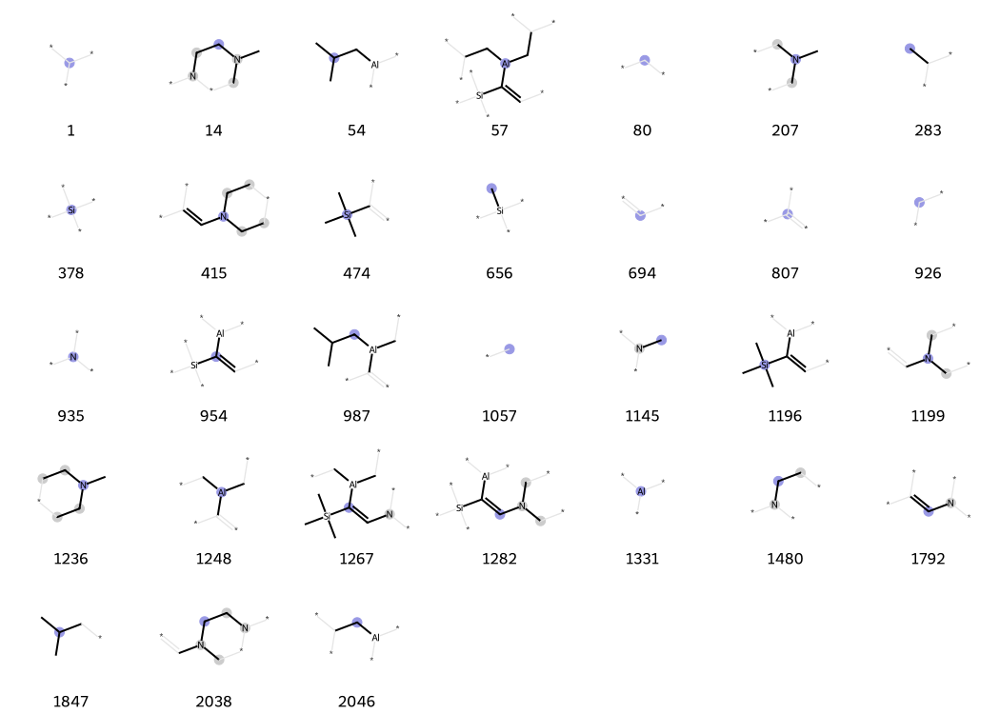


=== FLP #41 ===
SMILES: o1c2ccccc2ob1c1ccccc1P(c1ccccc1)c1ccccc1


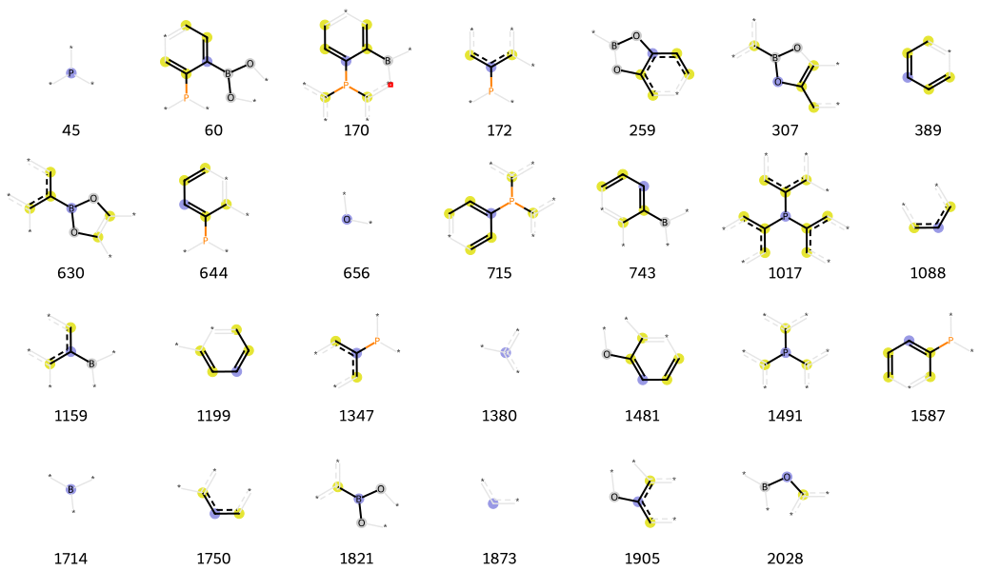


=== FLP #42 ===
SMILES: P(B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)(C(C)(C)C)C(C)(C)C


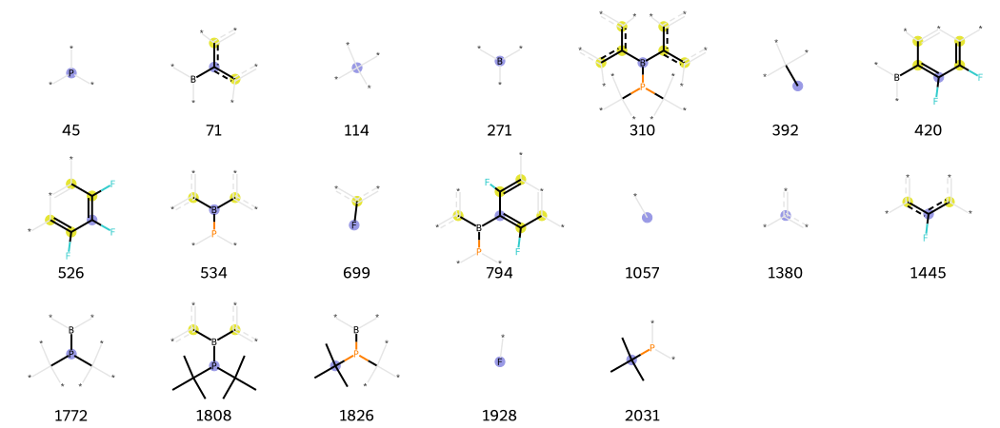


=== FLP #43 ===
SMILES: C(CBc1c(cc(cc1C(F)(F)F)C(F)(F)F)C(F)(F)F)P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


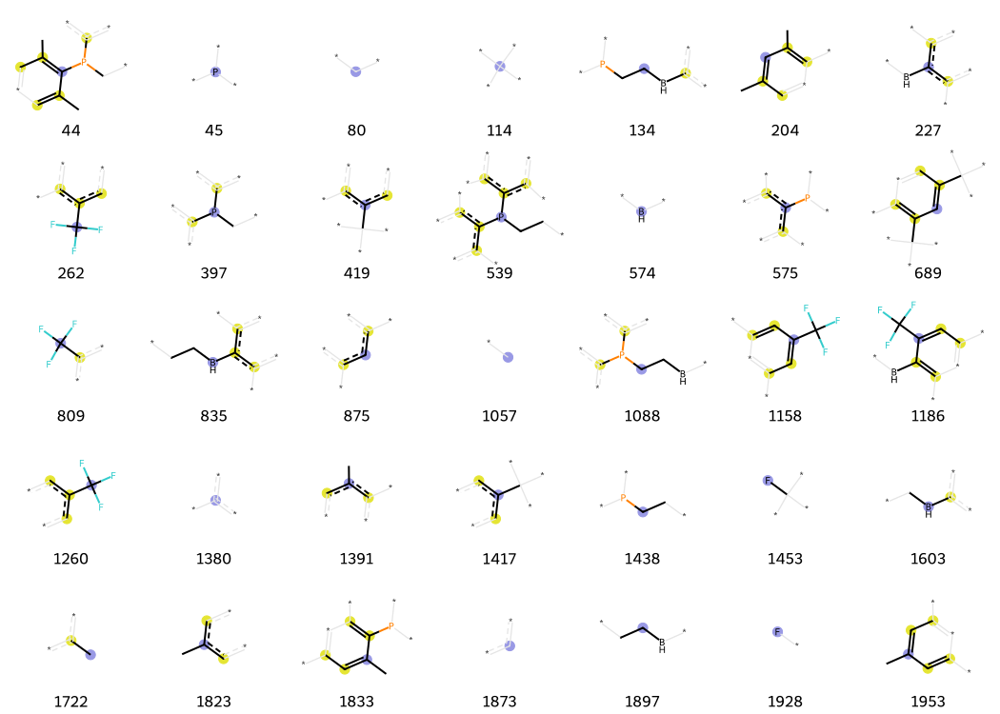


=== FLP #44 ===
SMILES: C(CB(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)P(CCB(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)c1c(cc(cc1C)C)C


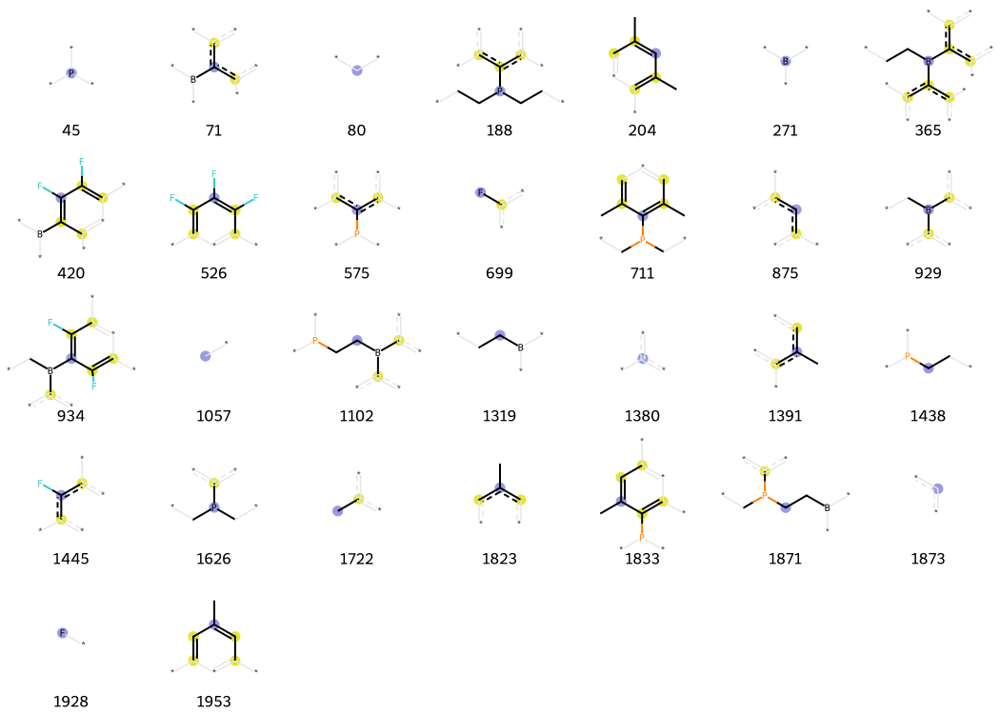


=== FLP #45 ===
SMILES: c1(ccccc1CN1C(CCCC1(C)C)(C)C)B1[C@@H]2CCC[C@H]1CCC2


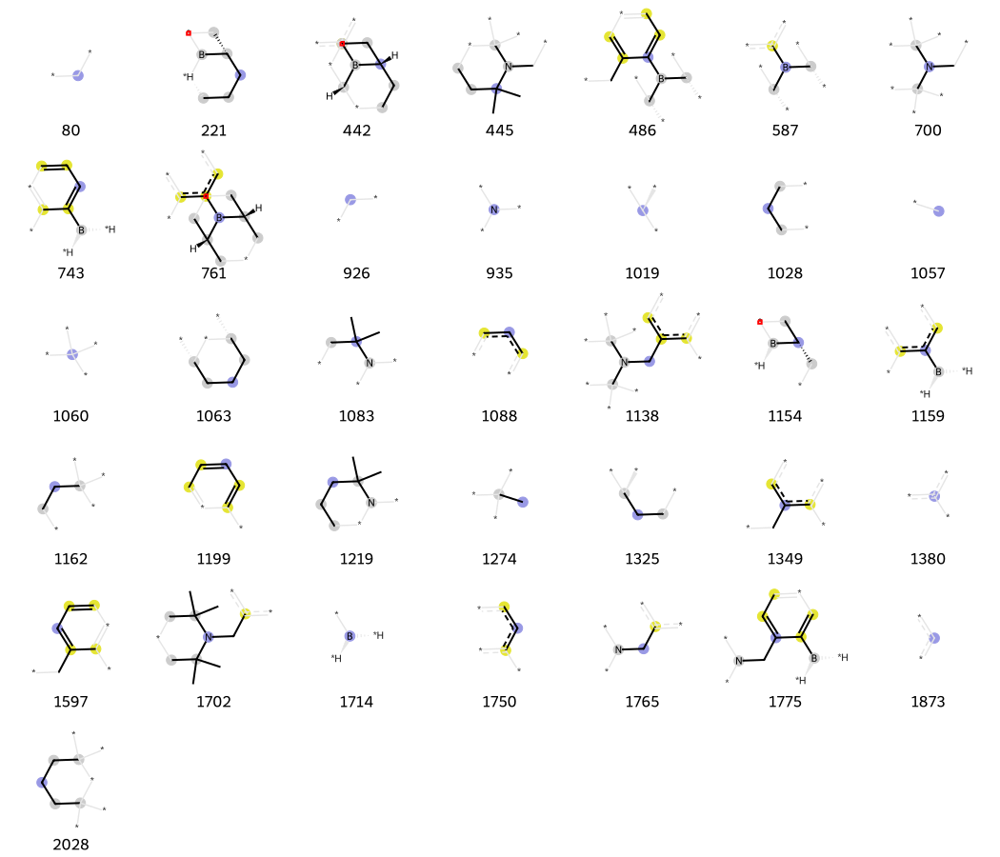


=== FLP #46 ===
SMILES: C[C@H]1B2[C@@H](C)[C@H]3C[C@@H]1C[C@H](C3)C1=C2N2[C@H]([C@H]3C[C@@H]([C@H]2C)C[C@@H]1C3)C


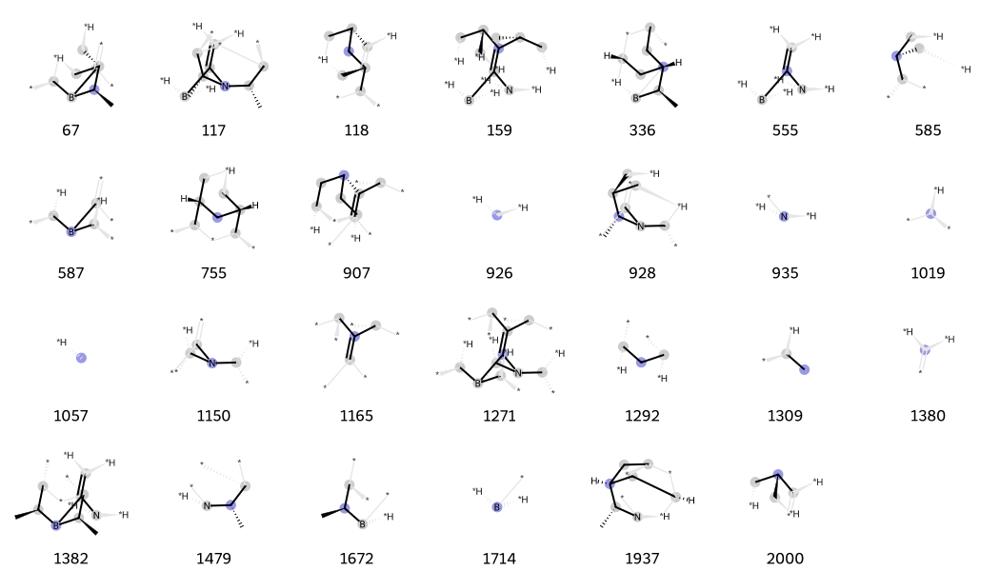


=== FLP #47 ===
SMILES: [C@@H]12C[C@@H]3C[N@@](C[C@H](C1)C3)[C@@H]2c1cccc([C@]2([C@@]3(C([C@@]4(C(B2C([C@](C3(F)F)(C4(F)F)F)(F)F)(F)F)F)(F)F)F)F)c1


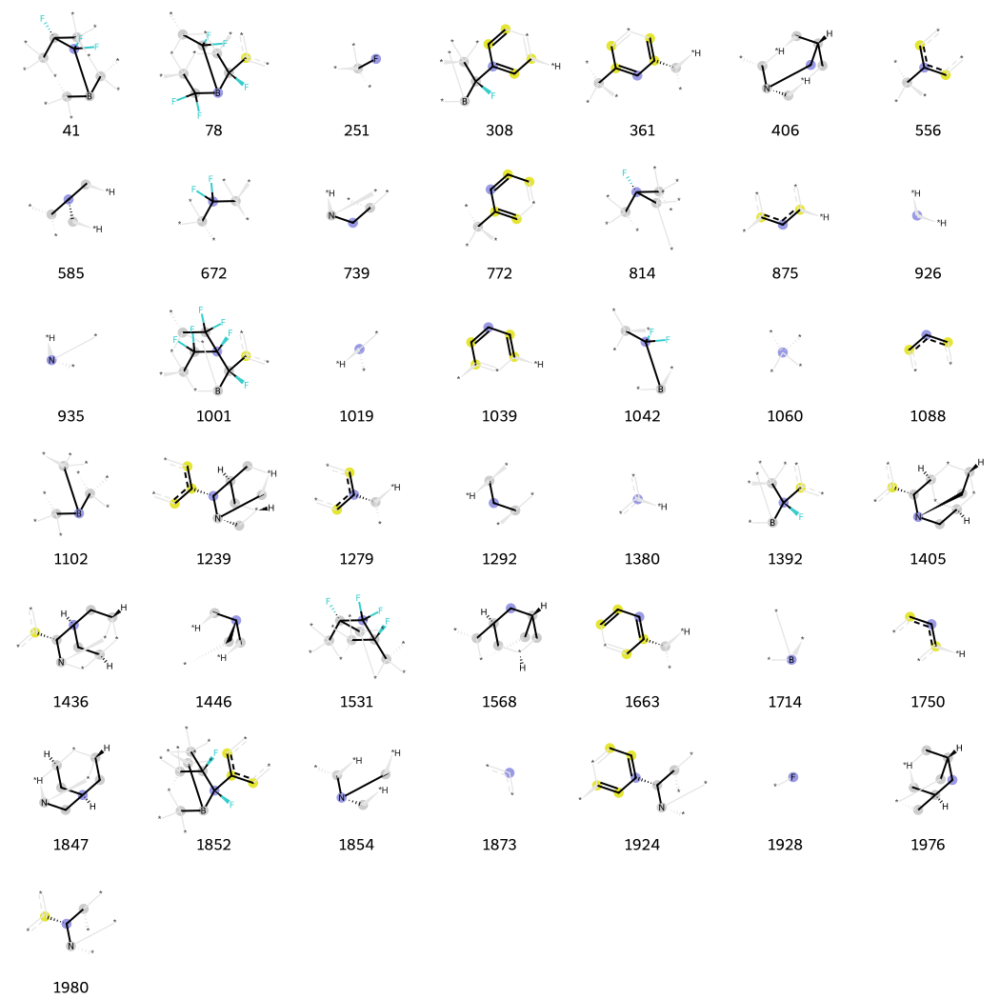


=== FLP #48 ===
SMILES: [C@@H]1(CCCCN1)B(c1c(cccc1C)C)c1c(cccc1C)C


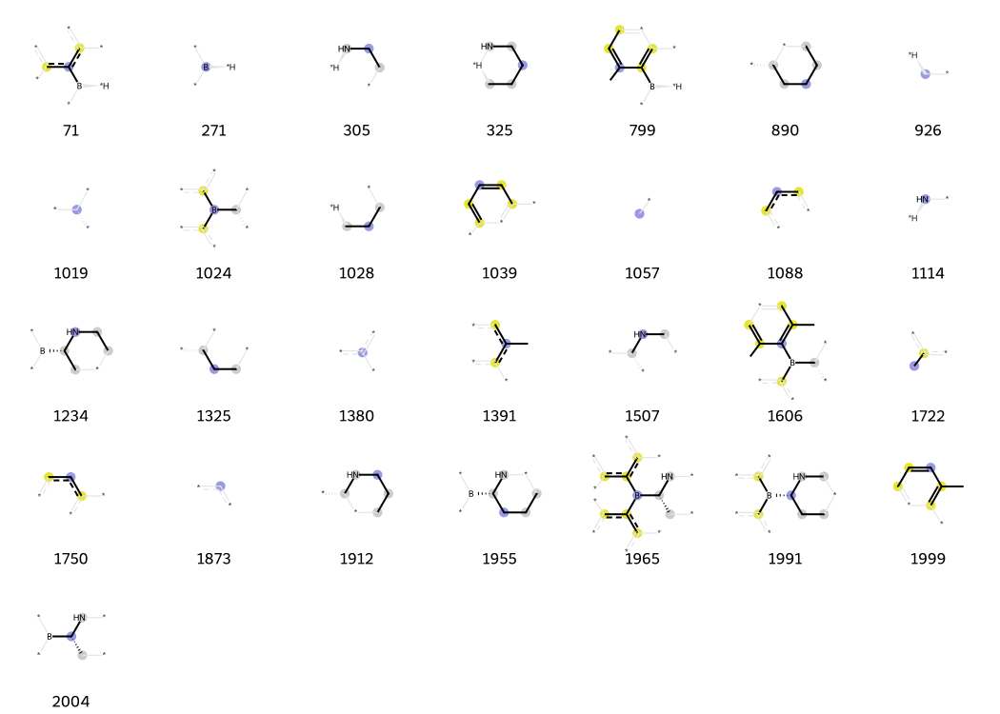


=== FLP #49 ===
SMILES: C12=NC(CCN1C=C1N2B(C(CC1)(C)C)C)(C)C


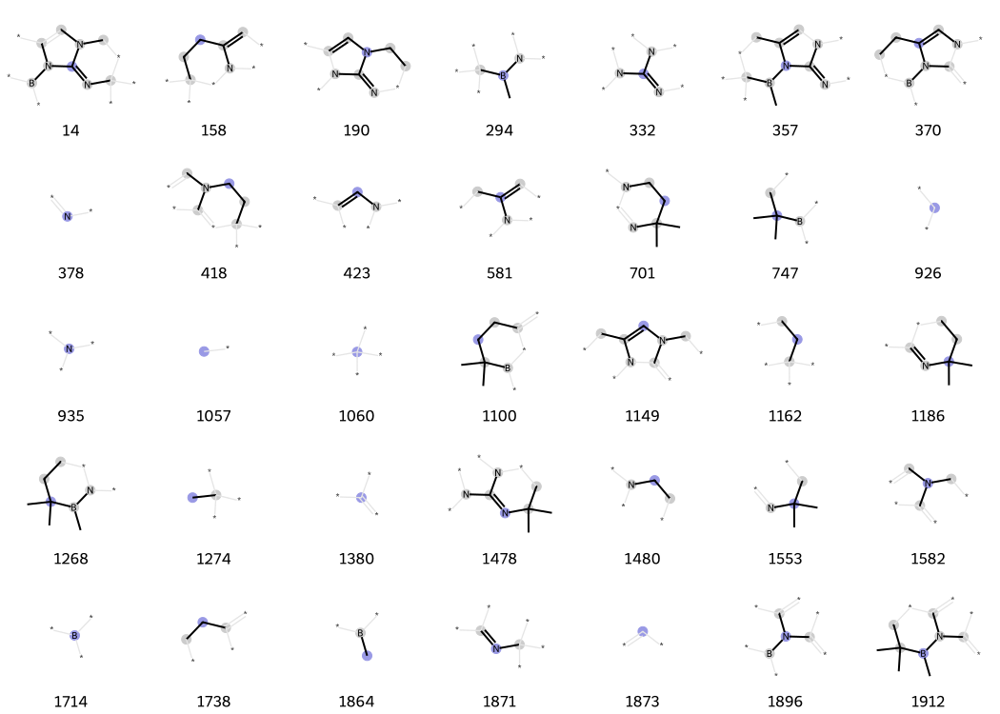


=== FLP #50 ===
SMILES: C1=C2N(C3=NC(CCN13)(C)C)B1[C@@]3(CCC[C@H]1CCC3)CC2


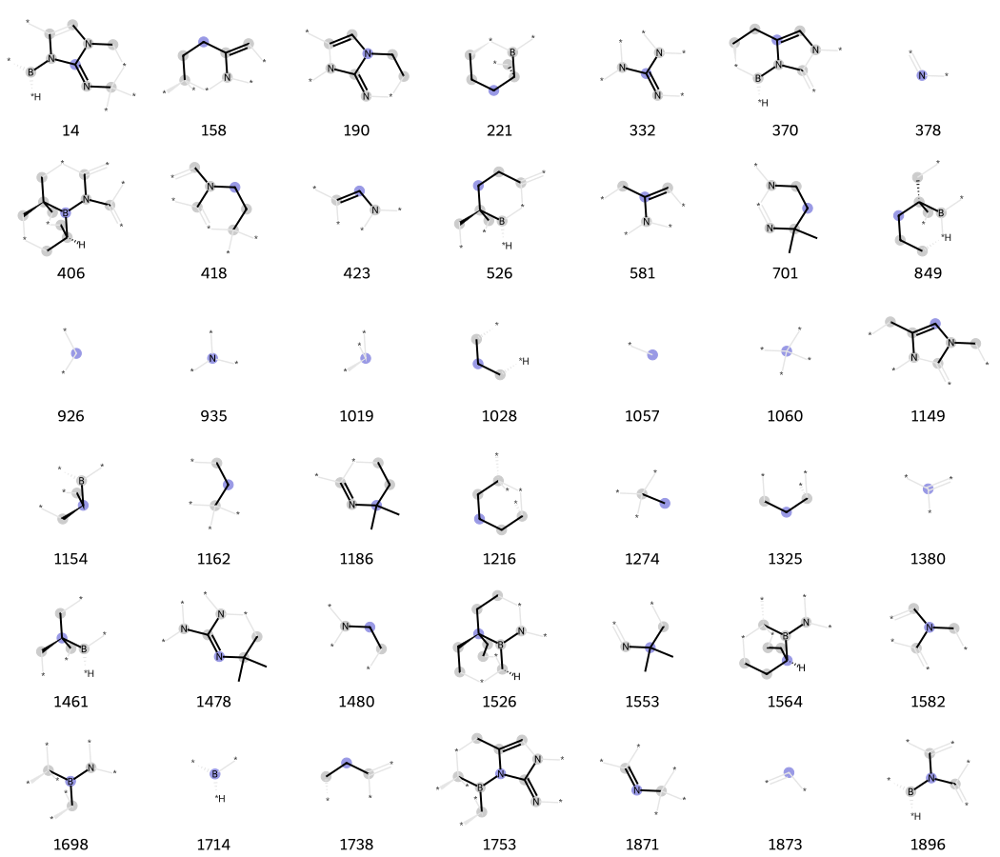


=== FLP #51 ===
SMILES: [C@@H]1(P(CCB1c1c(c(c(c(c1F)F)F)F)F)c1ccccc1)C


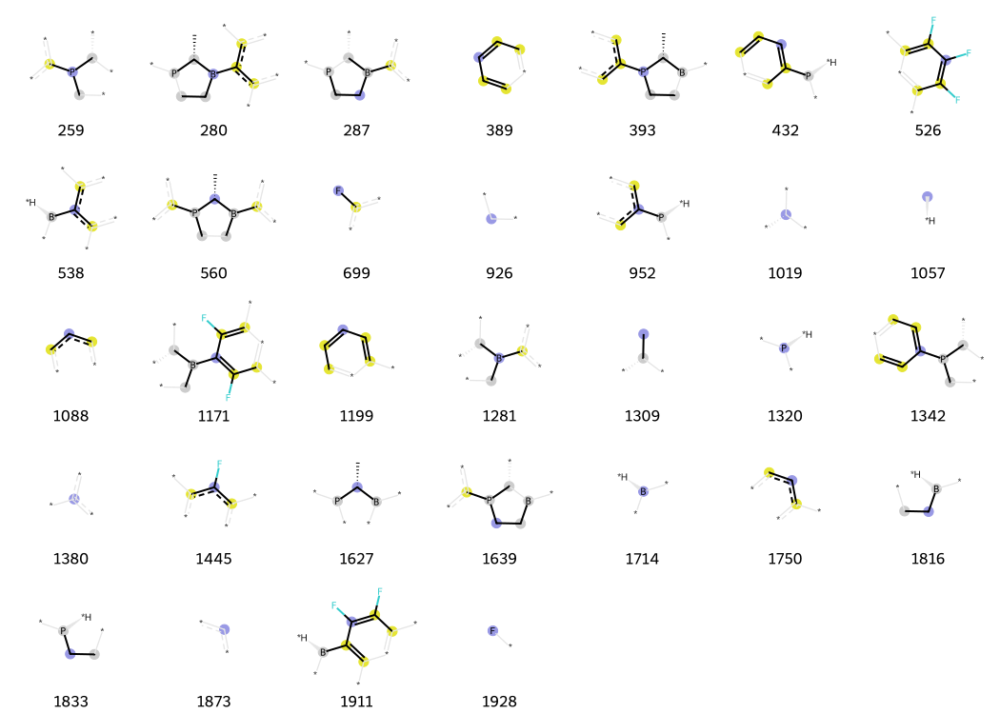


=== FLP #52 ===
SMILES: P(OB(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F)(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


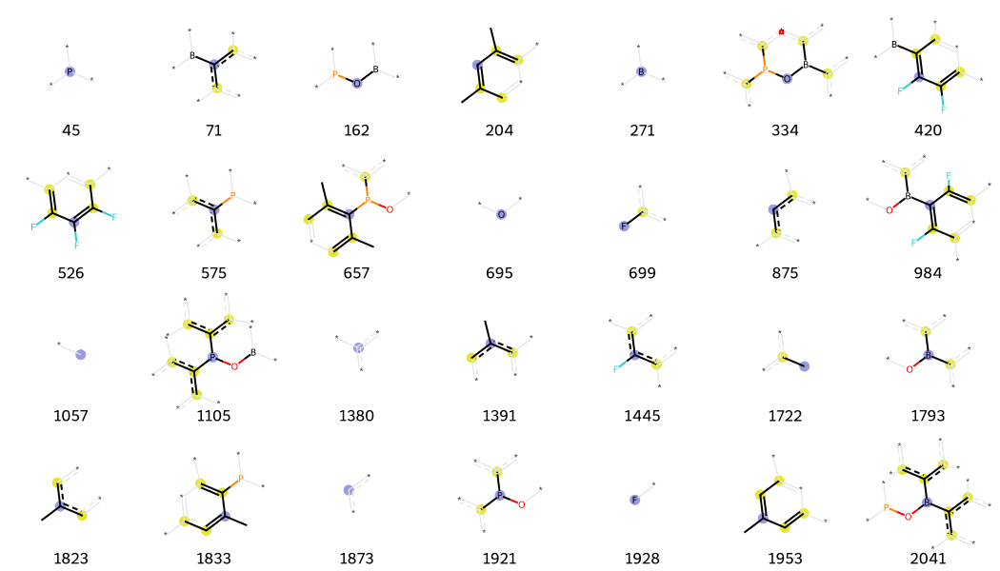


=== FLP #53 ===
SMILES: B(P(C(C)(C)C)C(C)(C)C)(N(C(C)C)C(C)C)N(C(C)C)C(C)C


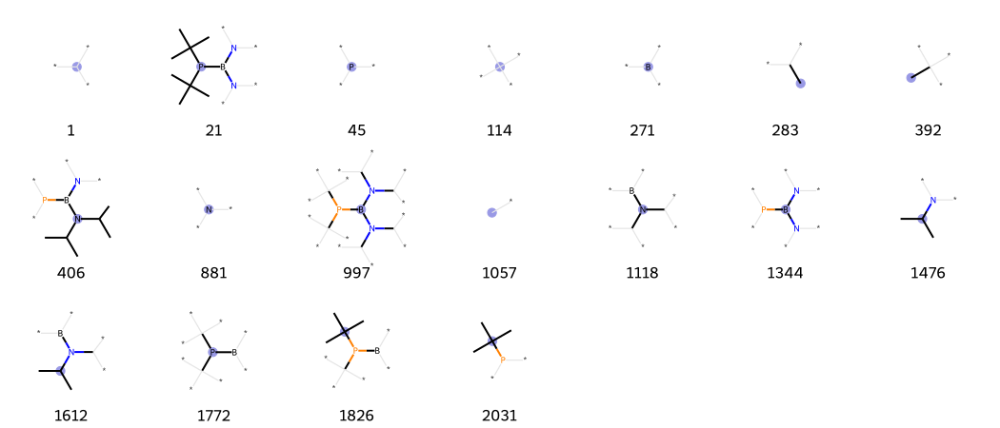


=== FLP #54 ===
SMILES: P(C[Si](C(F)(F)C(F)(F)F)(C(F)(F)C(F)(F)F)C(F)(F)C(F)(F)F)(C(C)(C)C)C(C)(C)C


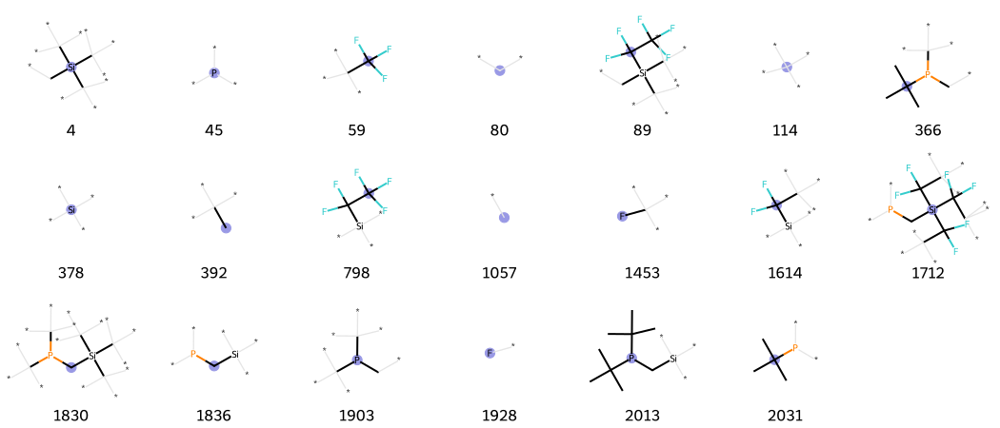


=== FLP #55 ===
SMILES: C([Si](F)(F)F)P(C(C)(C)C)C(C)(C)C


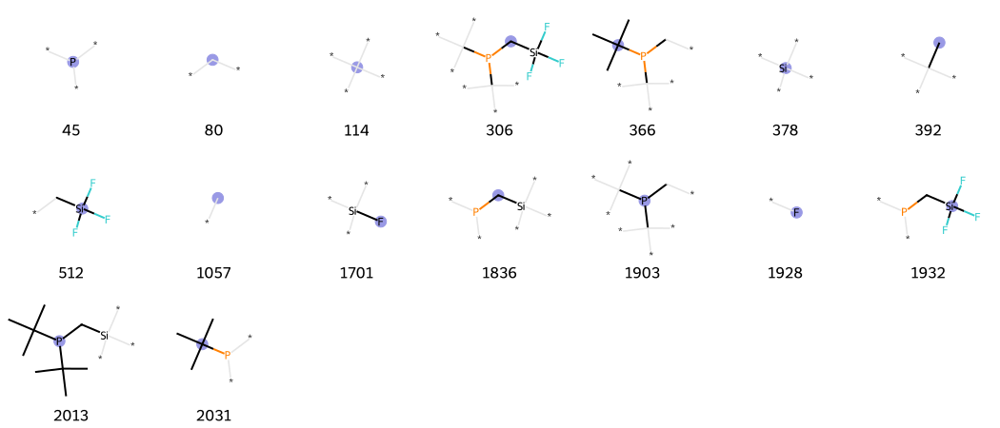


=== FLP #56 ===
SMILES: B(c1ccccc1N(c1ccccc1)c1ccccc1)(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


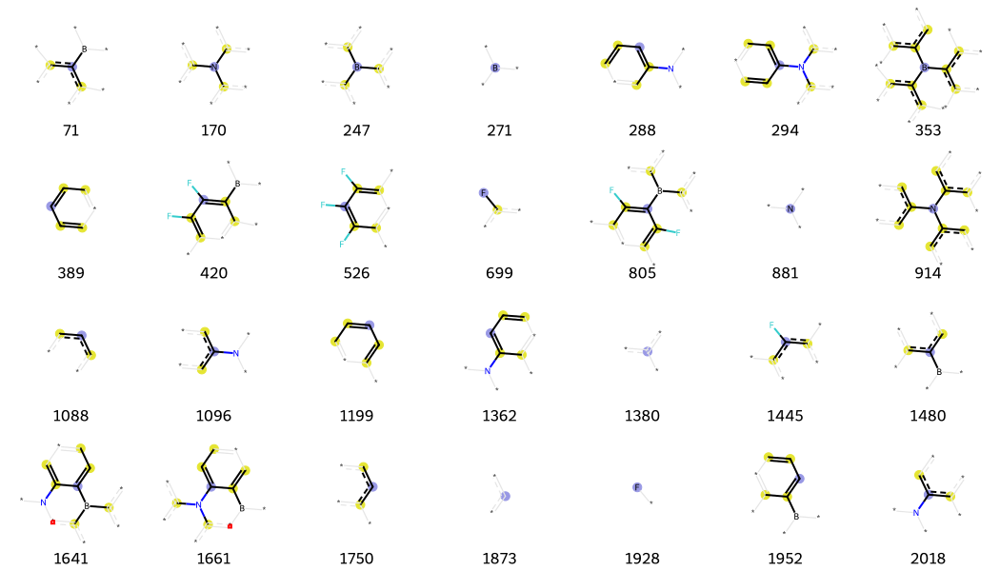


=== FLP #57 ===
SMILES: C([Si](Cl)(Cl)Cl)P(C(C)(C)C)C(C)(C)C


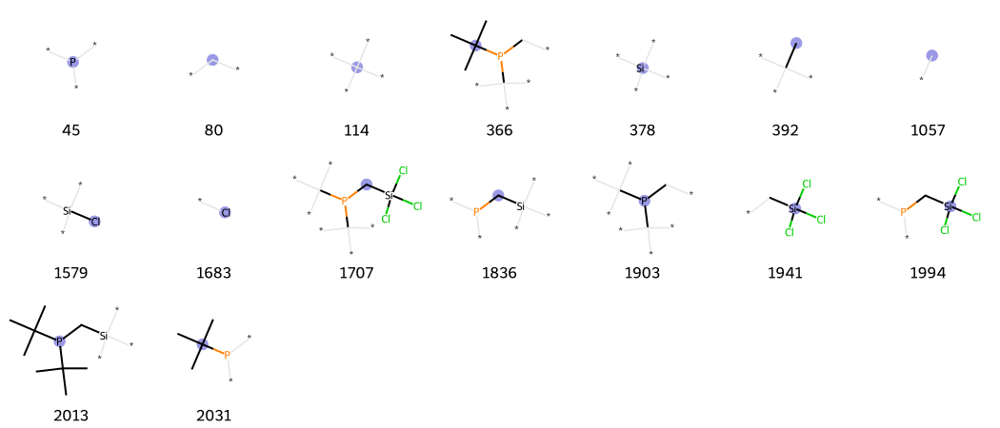


=== FLP #58 ===
SMILES: C(P(C(C)(C)C)C(C)(C)C)B(c1ccccc1)c1ccccc1


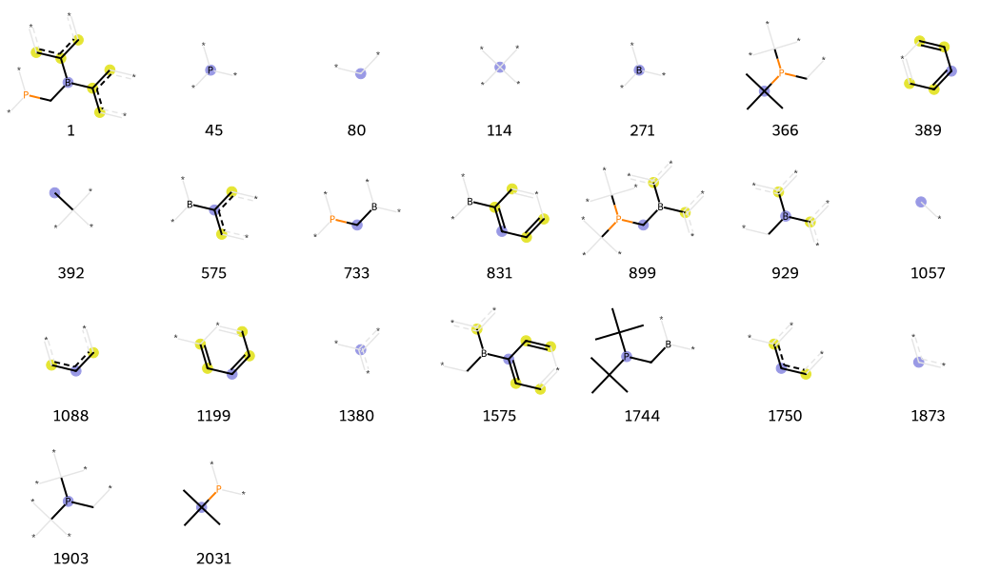


=== FLP #59 ===
SMILES: C(P(C(C)(C)C)C(C)(C)C)B(c1cc(cc(c1)C(F)(F)F)C(F)(F)F)c1cc(cc(c1)C(F)(F)F)C(F)(F)F


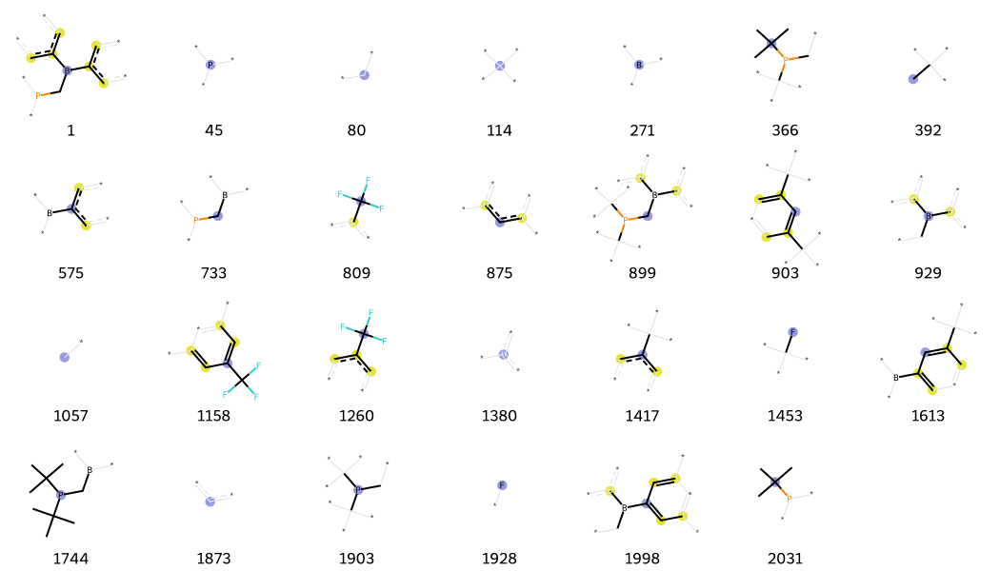


=== FLP #60 ===
SMILES: c12c(cccc1)[C@H](C[C@@H]2P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F


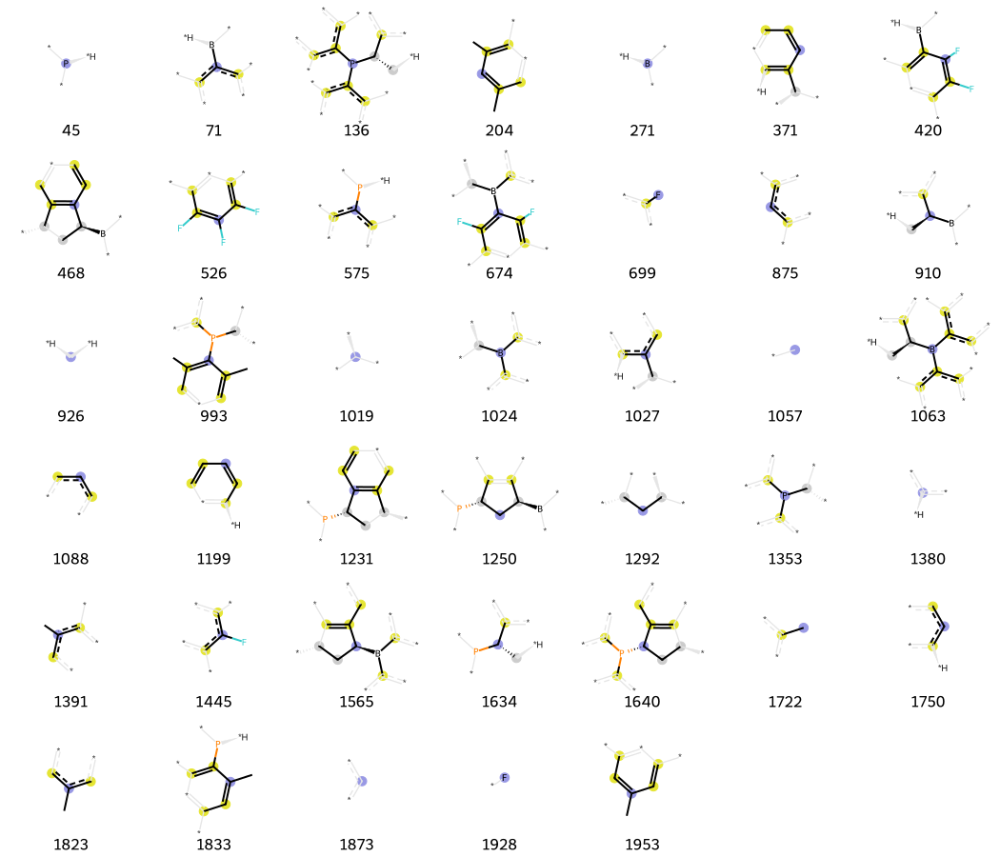


=== FLP #61 ===
SMILES: c1cc(c2c(c1)c1c(c(ccc1)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)o2)P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


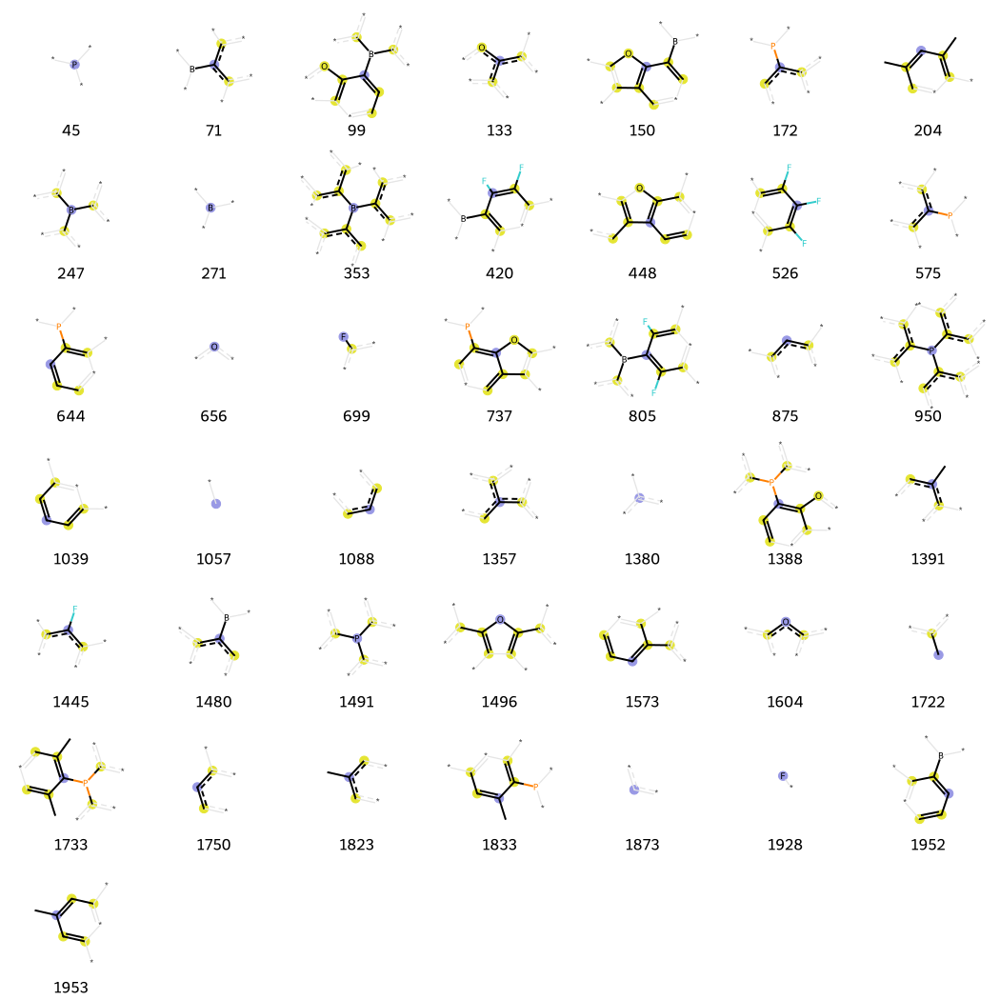


=== FLP #62 ===
SMILES: c1c(c2c(cc1)C(c1c(c(ccc1)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)O2)(C)C)P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C


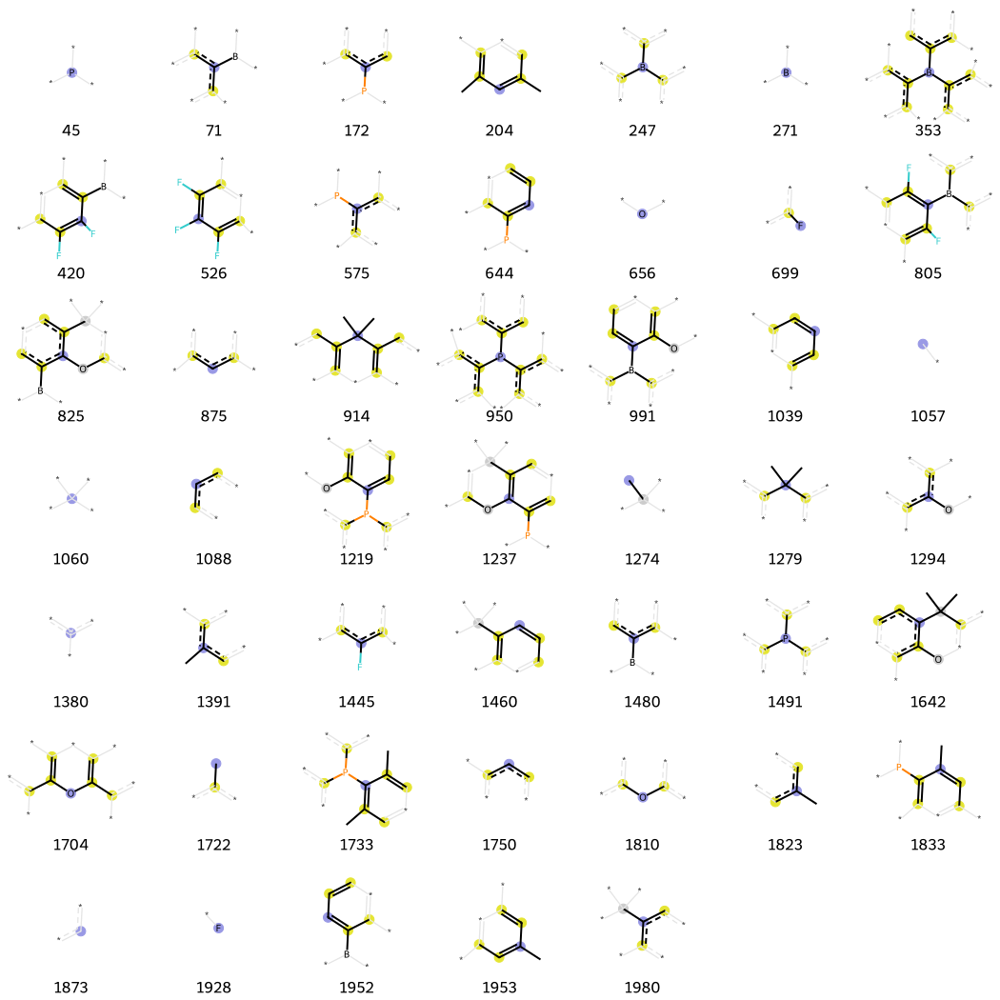


=== FLP #63 ===
SMILES: c1c(c2c(cc1)C(c1c(c(ccc1)B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)O2)(C)C)P(C(C)C)C(C)C


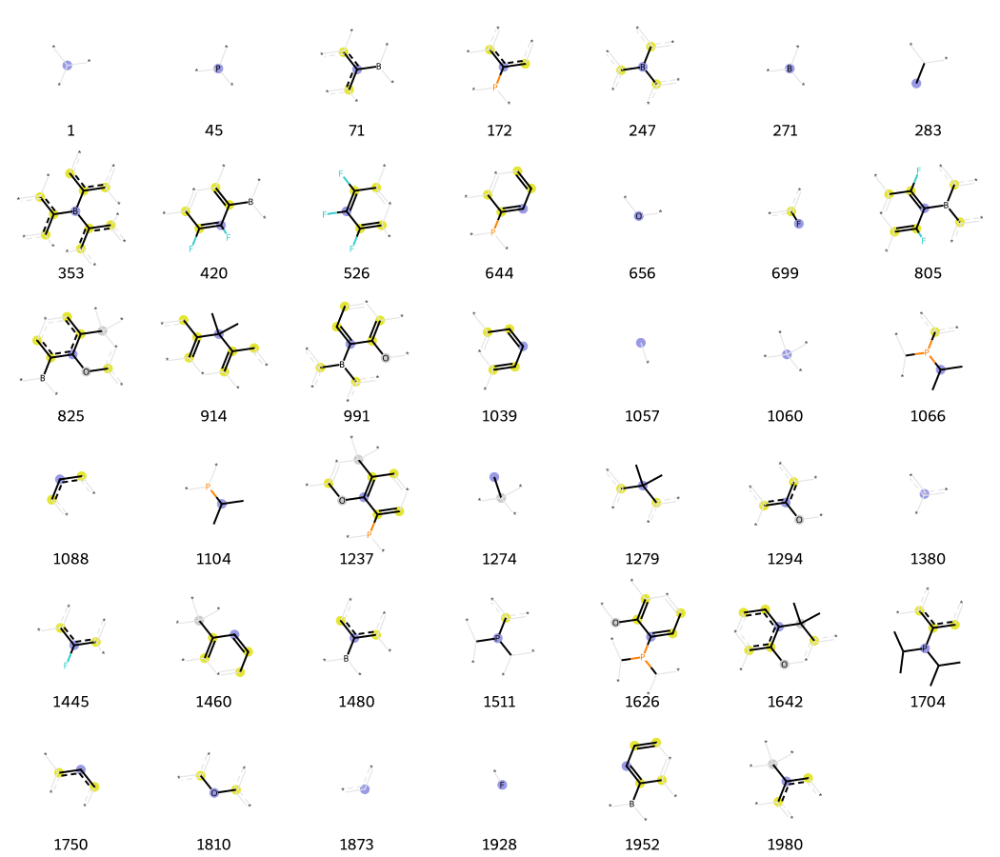


=== FLP #64 ===
SMILES: P(c1c2Oc3c(B(c4c(F)c(F)c(F)c(c4F)F)c4c(c(c(c(c4F)F)F)F)F)cccc3C(c2ccc1)(C)C)(c1ccccc1)c1ccccc1


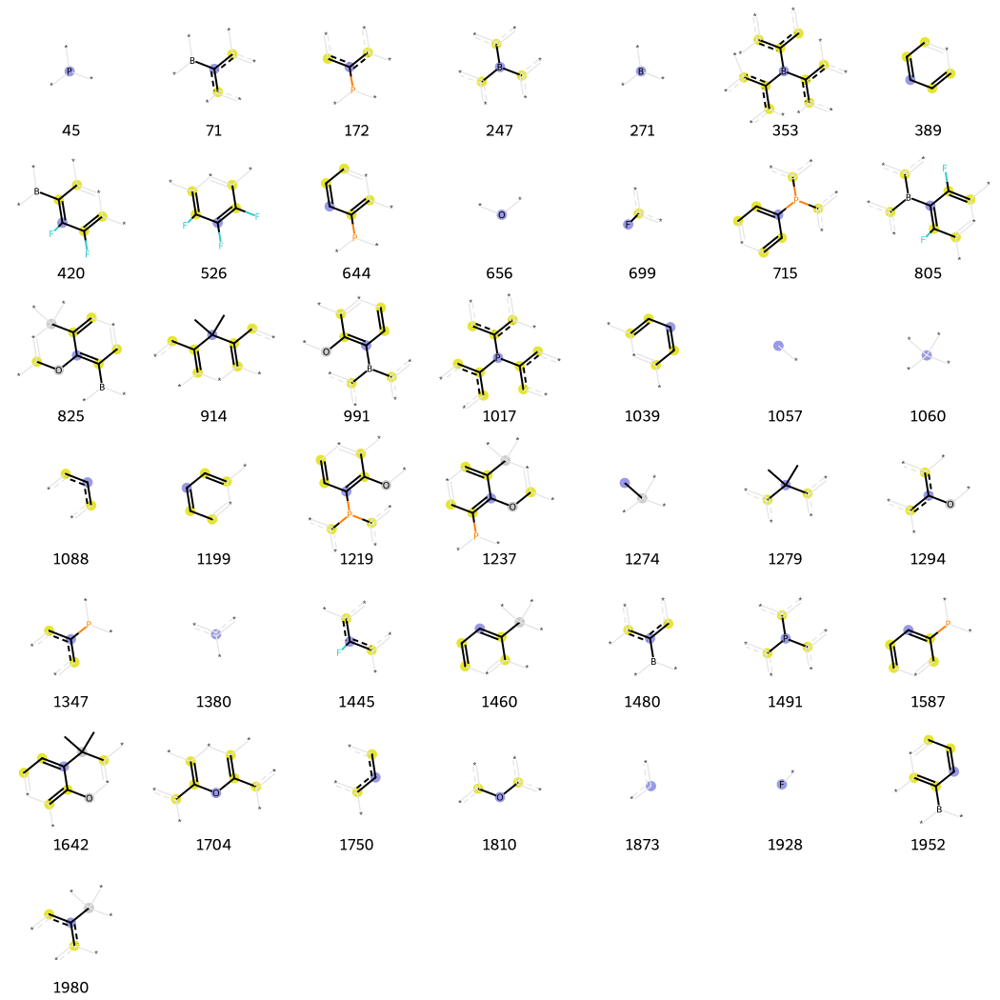


=== FLP #65 ===
SMILES: P(c1c(cc(cc1C)C)C)(c1c(cc(cc1C)C)C)/C(=C/c1ccccc1)/[Al](C(C)(C)C)C(C)(C)C


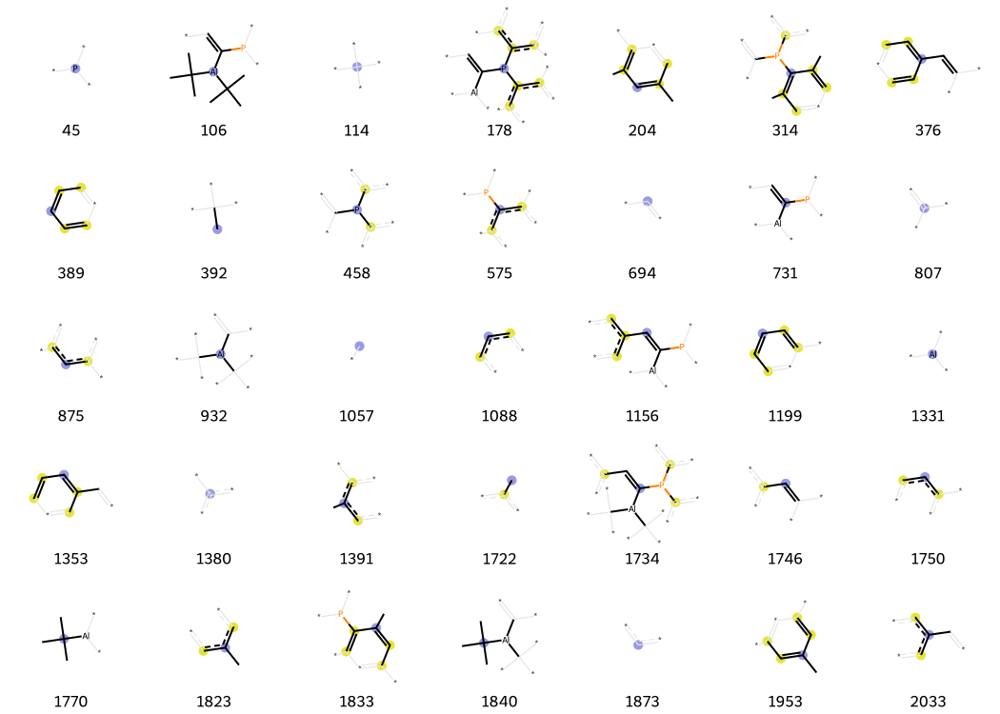


=== FLP #66 ===
SMILES: C(=C\c1ccccc1)(/P(c1c(C)cc(C)cc1C)c1c(C)cc(C)cc1C)\[Al](CC(C)(C)C)CC(C)(C)C


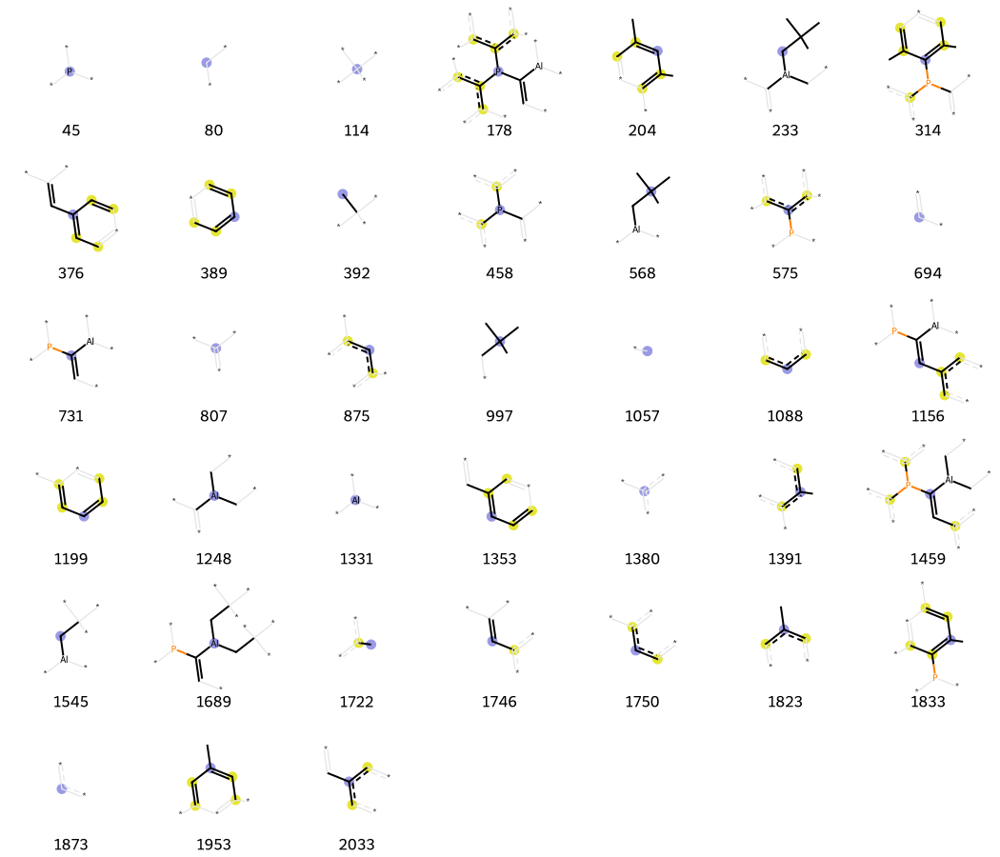


=== FLP #67 ===
SMILES: c1(ccccc1N1C(CCCC1(C)C)(C)C)B(c1c(F)c(F)c(F)c(F)c1F)c1c(c(c(c(c1F)F)F)F)F


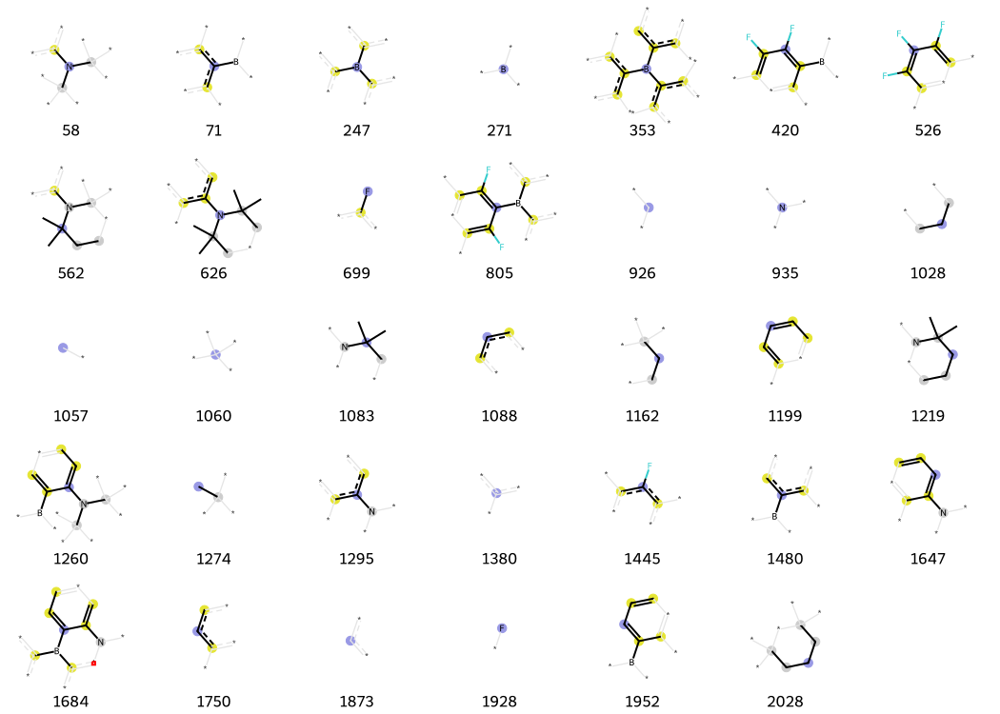


=== FLP #68 ===
SMILES: [Al](C([Si](C)(C)C)[Si](C)(C)C)(C([Si](C)(C)C)[Si](C)(C)C)/C(=C/C(C)(C)C)/Pc1c(C)cc(C)cc1C


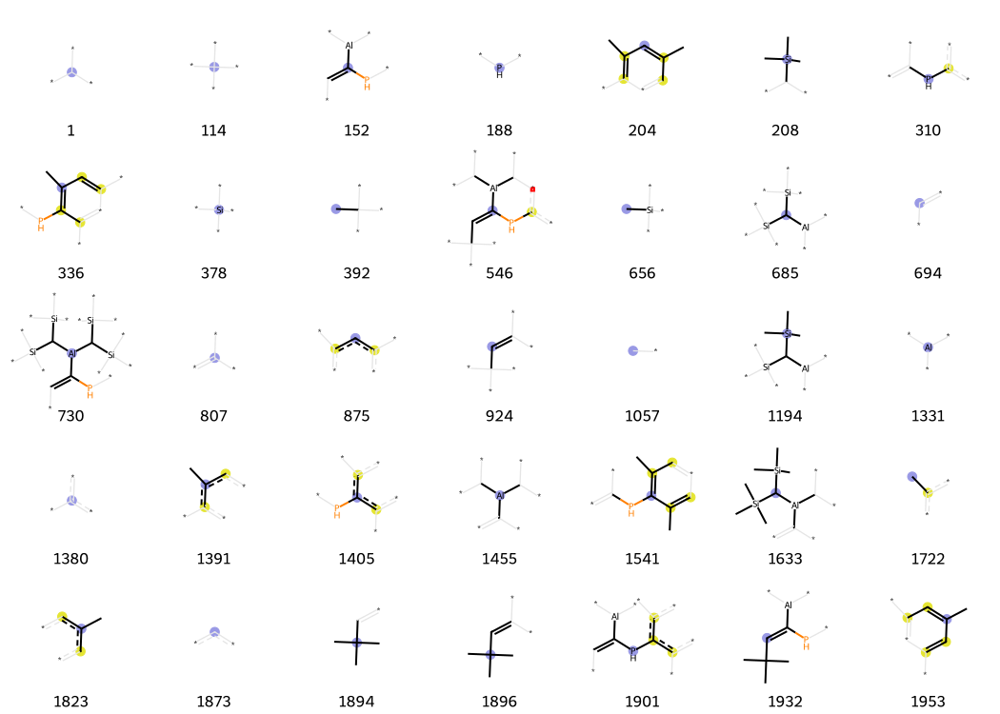


=== FLP #69 ===
SMILES: [Al](C([Si](C)(C)C)[Si](C)(C)C)(C([Si](C)(C)C)[Si](C)(C)C)[C](PC([Si](C)(C)C)[Si](C)(C)C)[CH]C(C)(C)C


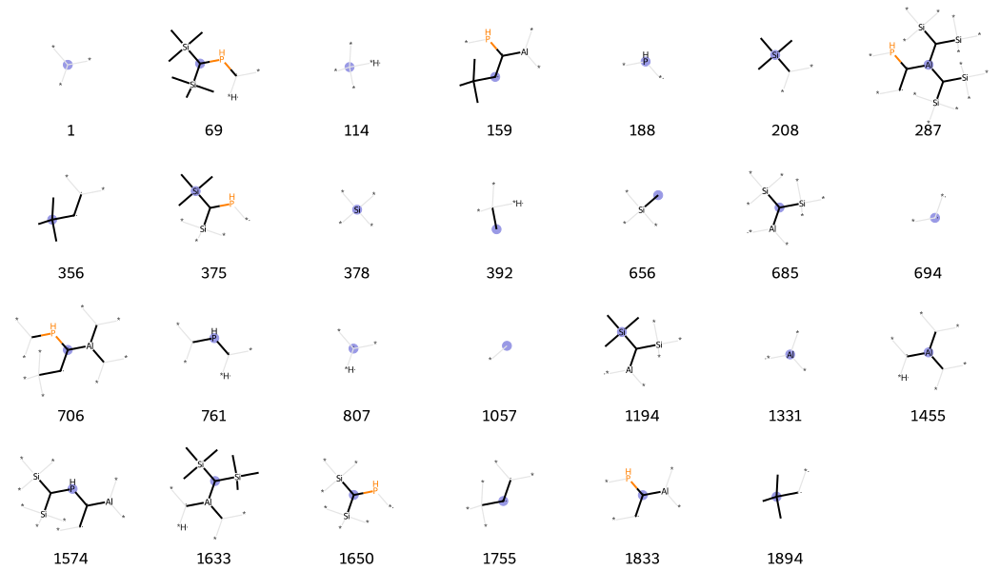


=== FLP #70 ===
SMILES: S(c1ccc(cc1)C)/C(=C\C(C)(C)C)/B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(F)c(F)c1F


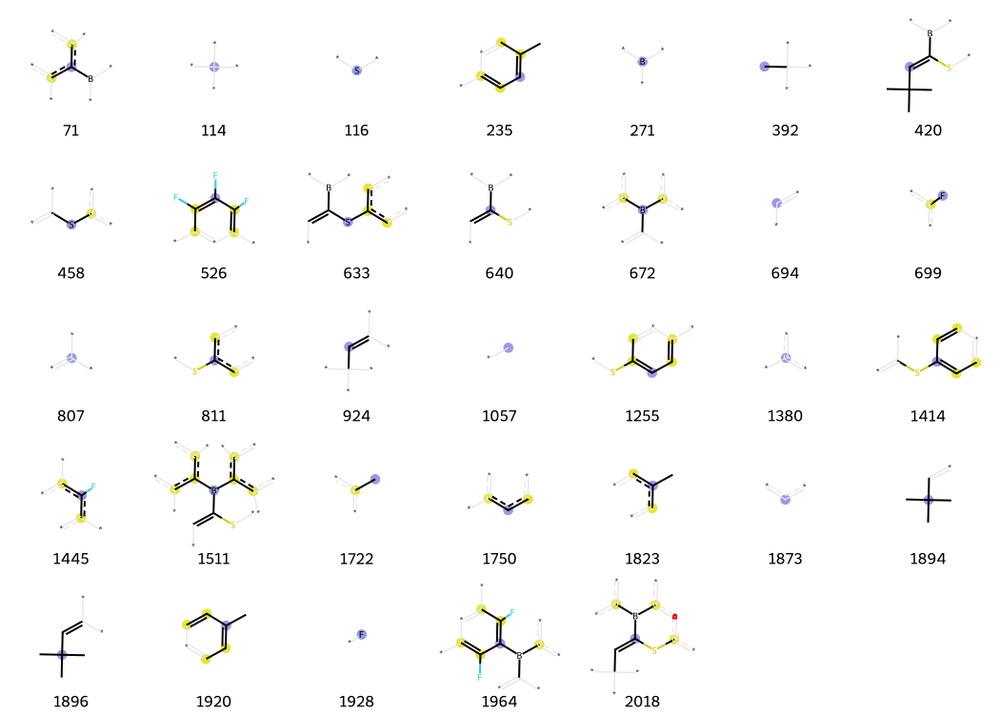


=== FLP #71 ===
SMILES: P(/C(=C\C(C)(C)C)/B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F)c1c(C)cc(C)cc1C


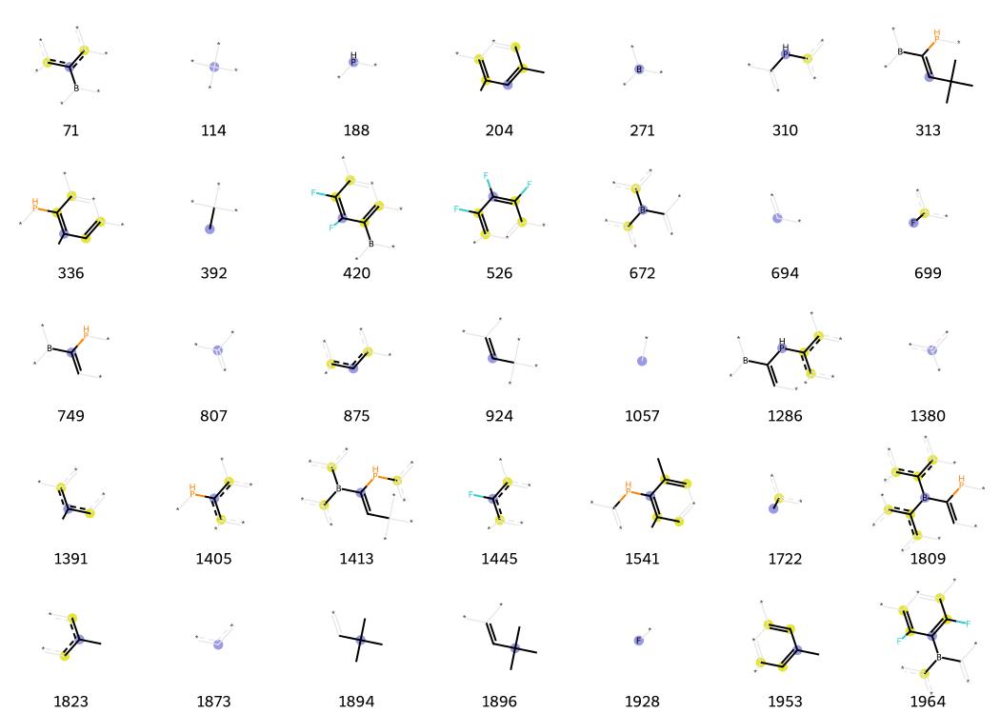


=== FLP #72 ===
SMILES: P(c1c(c(c(c(c1F)F)F)F)F)(c1c(c(c(c(c1F)F)F)F)F)/C(=C\c1ccccc1)/B(c1c(c(c(c(c1F)F)F)F)F)c1c(c(c(c(c1F)F)F)F)F


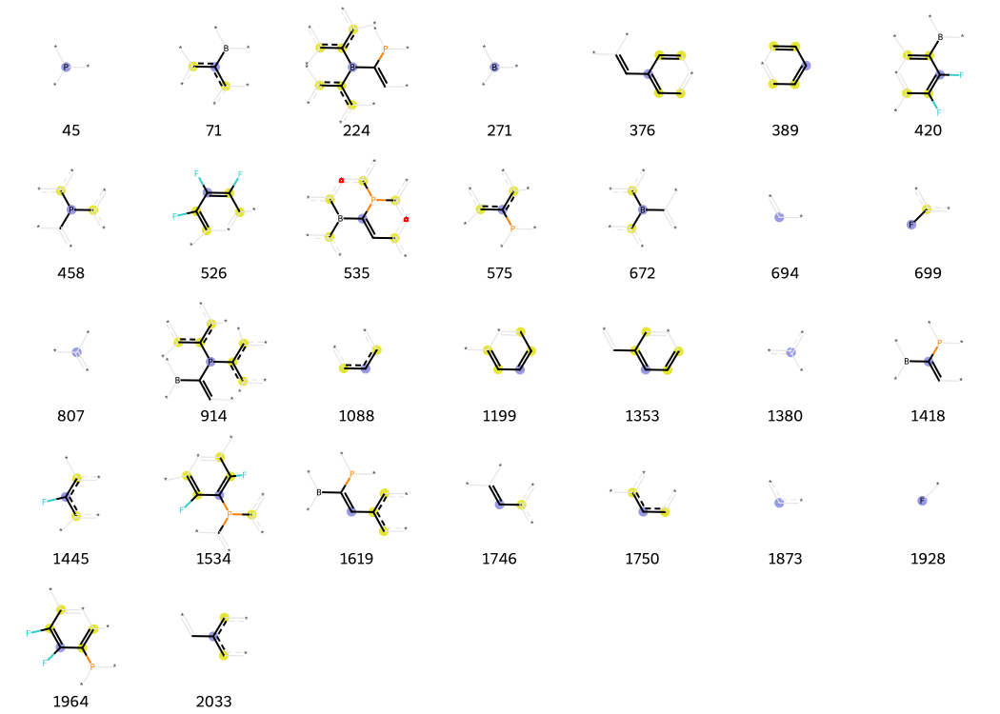


=== FLP #73 ===
SMILES: N1(C2=NCCCN2CCC1)B1[C@H]2CCC[C@@H]1CCC2


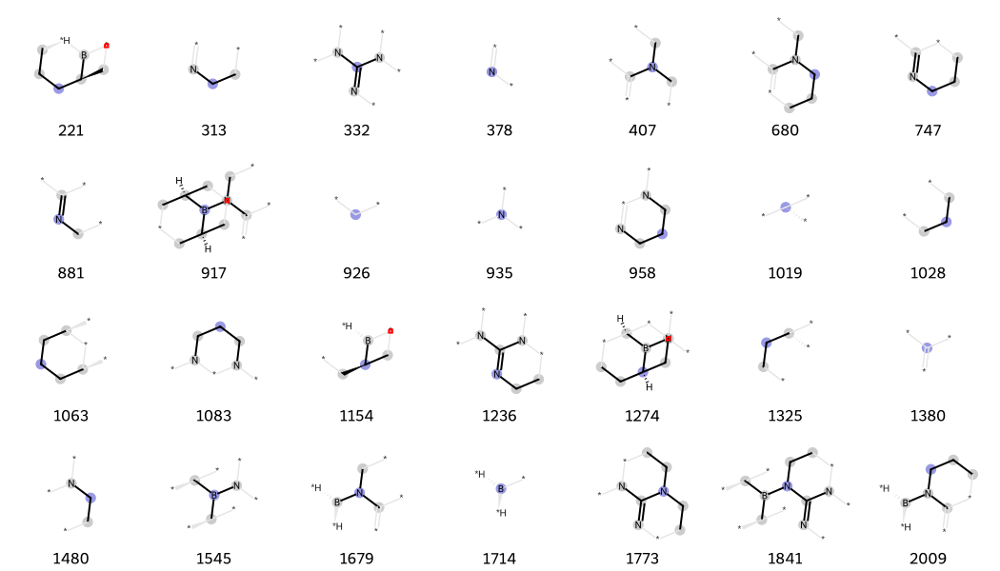

In [6]:
from IPython.display import display

for i in range(len(valid_viz)):
    print(f"\n=== FLP #{i} ===")
    print("SMILES:", valid_viz.loc[i, "smiles"])
    svg_obj = valid_viz.loc[i, "morgan_bits_svg"]  # already an SVG object
    display(svg_obj)  # no SVG(...) wrapper

In [7]:
import os
from pathlib import Path

import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import SimilarityMaps

from morfeus.conformer import ConformerEnsemble
from morfeus.xtb import XTB

from IPython.display import SVG, display

# ===== 1) Load your FLP SMILES =====
# Option A: exactly 1..132 FLPs
csv_path = "/Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_only_smiles_full.csv"

# Option B (if you prefer): "flp_xyz_smiles_obabelonly.csv"
# csv_path = "flp_xyz_smiles_obabelonly.csv"

df = pd.read_csv(csv_path)
print("Rows in CSV:", len(df))
print(df.head())

# We'll look for these columns if present
has_flp_id = "flp_id" in df.columns

# ===== 2) Helper: XTB charges for one FLP SMILES =====

def compute_xtb_charges_for_smiles(smiles, n_conformers=30):
    """
    For a single FLP SMILES:
      - Build RDKit mol (no explicit H) for drawing
      - Add hydrogens, build 3D ensemble with MMFF94
      - Take lowest-energy conformer
      - Run XTB to get Mulliken charges
      - Return (mol_noH, charges_heavy)
    Returns (None, None) on failure.
    """
    if pd.isna(smiles) or smiles == "":
        return None, None

    # RDKit molecule without explicit H (good for 2D drawing)
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        print("⚠️ Bad SMILES, skipping:", smiles)
        return None, None

    # Add Hs for XTB geometry
    mol_H = Chem.AddHs(mol)

    # --- Build conformer ensemble ---
    try:
        ce = ConformerEnsemble.from_rdkit(
            mol_H,
            optimize="MMFF94",
            n_conformers=n_conformers
        )
        ce.prune_rmsd()
        ce.sort()
    except Exception as e:
        print("⚠️ Conformer generation failed:", e)
        return None, None

    if len(ce) == 0:
        print("⚠️ No conformers generated for:", smiles)
        return None, None

    elements = ce.elements              # element symbols / Z
    coordinates = ce[0].coordinates     # lowest-energy conformer

    # --- Run XTB and get Mulliken charges ---
    try:
        xtb = XTB(elements, coordinates)
        charges_dict = xtb.get_charges(model="Mulliken")  # 1-indexed dict
    except Exception as e:
        print("⚠️ XTB failed for this FLP:", e)
        return None, None

    # Convert to list in xTB atom order
    all_charges = [charges_dict[i + 1] for i in range(len(elements))]

    # Match XTB charges to RDKit mol (heavy atoms only, no explicit H)
    num_heavy = mol.GetNumAtoms()
    # Assuming xTB returns charges for heavy atoms first, then hydrogens
    charges_heavy = all_charges[:num_heavy]

    if len(charges_heavy) != num_heavy:
        print("⚠️ Charge length mismatch, skipping:", smiles)
        return None, None

    return mol, charges_heavy


# ===== 3) Generate and save SimilarityMaps for all FLPs =====

output_dir = Path("/Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps")
output_dir.mkdir(parents=True, exist_ok=True)
print("Saving SVGs to:", output_dir)

n_ok = 0
for idx, row in df.iterrows():
    smiles = row["smiles"]

    # Choose an identifier for the filename
    if has_flp_id:
        flp_id = int(row["flp_id"])
        base_name = f"flp_{flp_id}"
    else:
        # fall back to row index or filename column if present
        base_name = f"flp_{idx}"
        if "filename" in df.columns and isinstance(row["filename"], str):
            base_name = Path(row["filename"]).stem

    print(f"\n=== Processing {base_name} ===")
    print("SMILES:", smiles)

    mol, charges_heavy = compute_xtb_charges_for_smiles(smiles)
    if mol is None or charges_heavy is None:
        continue

    # Draw 2D similarity map colored by charges
    d = Draw.MolDraw2DSVG(400, 400)
    SimilarityMaps.GetSimilarityMapFromWeights(
        mol,
        charges_heavy,
        draw2d=d
    )
    d.FinishDrawing()
    svg_data = d.GetDrawingText()

    out_path = output_dir / f"{base_name}_charges.svg"
    with open(out_path, "w") as f:
        f.write(svg_data)

    n_ok += 1
    print("Saved:", out_path)

print(f"\nDone. Successfully generated charge maps for {n_ok} FLPs.")

Rows in CSV: 132
   flp_id              xyz_path  \
0       1  data/raw/xyz/1/1.xyz   
1       2  data/raw/xyz/2/2.xyz   
2       3  data/raw/xyz/3/3.xyz   
3       4  data/raw/xyz/4/4.xyz   
4       5  data/raw/xyz/5/5.xyz   

                                              smiles  \
0  Cc1cc(C)c(P(c2c(C)cc(C)cc2C)c2c(F)c(F)c(B(c3c(...   
1                                                NaN   
2  CC1(C)CCCC(C)(C)N1Cc1ccccc1B(c1c(F)c(F)c(F)c(F...   
3  Fc1c(F)c(F)c(B(c2c(F)c(F)c(F)c(F)c2F)P(C2CCCCC...   
4  CC(C)(C)P(B(c1c(F)c(F)c(F)c(F)c1F)c1c(F)c(F)c(...   

                                               error  
0                                                NaN  
1  RDKit could not parse SMILES: [P]1(CC[B]1(c1c(...  
2                                                NaN  
3                                                NaN  
4                                                NaN  
Saving SVGs to: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps

=== Processing flp_1

[19:10:13] UFFTYPER: Warning: hybridization set to SP3 for atom 8


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_41_charges.svg

=== Processing flp_42 ===
SMILES: CC(C)[CH2][Al]([CH2]C(C)C)/[C](=C\N1CCN(C)CC1)[Si](C)(C)C


[19:10:14] UFFTYPER: Warning: hybridization set to SP3 for atom 4


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_42_charges.svg

=== Processing flp_43 ===
SMILES: CC(C)(C)c1cccc(OB(c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)n1
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_43_charges.svg

=== Processing flp_44 ===
SMILES: c1ccc(P(c2ccccc2)c2ccccc2B2Oc3ccccc3O2)cc1
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_44_charges.svg

=== Processing flp_45 ===
SMILES: nan

=== Processing flp_46 ===
SMILES: nan

=== Processing flp_47 ===
SMILES: nan

=== Processing flp_48 ===
SMILES: nan

=== Processing flp_49 ===
SMILES: nan

=== Processing flp_50 ===
SMILES: nan

=== Processing flp_51 ===
SMILES: Cc1cc(C)c(P(CCBc2c(C(F)(F)F)cc(C(F)(F)F)cc2C(F)(F)F)c2c(C)cc(C)cc2C)c(C)c1
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_51_charges.svg

=== Processing flp_52 ===
SMILES: nan

=== Processing flp_53 ===
SMILES: nan

=== Processing flp_54 =

[19:15:09] UFFTYPER: Warning: hybridization set to SP3 for atom 15


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_88_charges.svg

=== Processing flp_89 ===
SMILES: Cc1cc(C)c(P(/[C](=C/c2ccccc2)[Al]([CH2]C(C)(C)C)[CH2]C(C)(C)C)c2c(C)cc(C)cc2C)c(C)c1


[19:15:10] UFFTYPER: Warning: hybridization set to SP3 for atom 15


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_89_charges.svg

=== Processing flp_90 ===
SMILES: Cc1cc(C)c(P/[C](=C\C(C)(C)C)[Al]([CH]([Si](C)(C)C)[Si](C)(C)C)[CH]([Si](C)(C)C)[Si](C)(C)C)c(C)c1


[19:15:11] UFFTYPER: Warning: hybridization set to SP3 for atom 13


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_90_charges.svg

=== Processing flp_91 ===
SMILES: CC(C)(C)[CH][C](PC([Si](C)(C)C)[Si](C)(C)C)[Al]([CH]([Si](C)(C)C)[Si](C)(C)C)[CH]([Si](C)(C)C)[Si](C)(C)C


[19:15:13] UFFTYPER: Warning: hybridization set to SP3 for atom 16


Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_91_charges.svg

=== Processing flp_92 ===
SMILES: nan

=== Processing flp_93 ===
SMILES: nan

=== Processing flp_94 ===
SMILES: Cc1ccc(S/C(=C\C(C)(C)C)B(c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)cc1
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_94_charges.svg

=== Processing flp_95 ===
SMILES: Cc1cc(C)c(P/C(=C\C(C)(C)C)B(c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)c(C)c1
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_95_charges.svg

=== Processing flp_96 ===
SMILES: Fc1c(F)c(F)c(B(/C(=C/c2ccccc2)P(c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)c2c(F)c(F)c(F)c(F)c2F)c(F)c1F
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_96_charges.svg

=== Processing flp_97 ===
SMILES: C1CN=C2N(C1)CCCN2B1[C@H]2CCC[C@@H]1CCC2
Saved: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_charge_maps/flp_97_charges.svg

=== Processin

In [12]:
from pathlib import Path
from morfeus.io import read_xyz
from morfeus.xtb import XTB

# 1) Point to your CO2.xyz in Downloads
xyz_path = Path("/Users/kishu/Downloads/CO2.xyz")  # adjust if needed

print("File exists:", xyz_path.exists())

# 2) Read the XYZ and run xTB
elements, coords = read_xyz(str(xyz_path))
xtb = XTB(elements, coords)

E_co2_Eh = xtb.get_energy()
print("CO2 energy (Eh):", E_co2_Eh)

File exists: True
CO2 energy (Eh): -10.3078989


In [13]:
import py3Dmol

with open(xyz_path) as f:
    xyz_str = f.read()

view = py3Dmol.view(width=400, height=400)
view.addModel(xyz_str, "xyz")
view.setStyle({"stick": {}})
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [11]:
from __future__ import annotations

from pathlib import Path
import numpy as np
import pandas as pd

from morfeus.io import read_xyz
from morfeus.xtb import XTB
from morfeus.sterimol import Sterimol


# ========= CONFIG =========

# Your repo root
REPO_ROOT = Path("/Users/kishu/Downloads/FLPCO2DB-main")

# CSV with bare FLPs (1.xyz, 10.xyz, etc. — Windows-style paths inside)
FLP_CSV = REPO_ROOT / "data" / "processed" / "flp_xyz_smiles_obabelonly.csv"

# CSV with FLP–CO2 complexes (1CO2.xyz, 10CO2.xyz, etc.)
CO2_COMPLEX_CSV = REPO_ROOT / "data" / "processed" / "co2_xyz_smiles_obabelonly.csv"

# Isolated CO2 geometry → adjust if your path is different
# e.g. if you have data/raw/xyz/CO2/CO2.xyz
CO2_XYZ = REPO_ROOT / "data" / "raw" / "xyz" / "CO2" / "CO2.xyz"

HARTREE_TO_KJ = 2625.49962


# ========= HELPERS =========

def safe_xtb_descriptors_from_xyz(xyz_path: Path):
    """
    Run xTB on an XYZ and return:
      - energy_Eh
      - homo_eV
      - lumo_eV
      - gap_eV
    Returns None on failure.
    """
    try:
        elements, coords = read_xyz(str(xyz_path))
    except Exception as e:
        print(f"⚠️ read_xyz failed for {xyz_path}: {e}")
        return None

    try:
        xtb = XTB(elements, coords)
        energy_Eh = xtb.get_energy()
        homo_eV = xtb.get_homo(unit="eV")
        lumo_eV = xtb.get_lumo(unit="eV")
        gap_eV = xtb.get_homo_lumo_gap(unit="eV")
    except Exception as e:
        print(f"⚠️ XTB failed for {xyz_path}: {e}")
        return None

    return {
        "energy_Eh": energy_Eh,
        "homo_eV": homo_eV,
        "lumo_eV": lumo_eV,
        "gap_eV": gap_eV,
    }


def auto_choose_sterimol_indices(elements):
    """
    Pick two heavy atoms (non-H) as a simple Sterimol axis.
    Returns 1-indexed atom indices as required by Sterimol.
    """
    heavy_indices = []
    for i, el in enumerate(elements, start=1):
        if isinstance(el, int):
            if el != 1:
                heavy_indices.append(i)
        else:
            if str(el).upper() != "H":
                heavy_indices.append(i)

    if len(heavy_indices) < 2:
        raise ValueError("Not enough heavy atoms to define Sterimol axis")

    return heavy_indices[0], heavy_indices[1]


def safe_sterimol_from_xyz(xyz_path: Path):
    """
    Compute Sterimol L, B1, B5 from XYZ using a simple automatic axis.
    Returns dict or None on failure.
    """
    try:
        elements, coords = read_xyz(str(xyz_path))
    except Exception as e:
        print(f"⚠️ read_xyz failed for Sterimol at {xyz_path}: {e}")
        return None

    try:
        dummy_idx, attached_idx = auto_choose_sterimol_indices(elements)
        ster = Sterimol(
            elements=elements,
            coordinates=coords,
            dummy_index=dummy_idx,
            attached_index=attached_idx,
            radii_type="crc",
            calculate=True,
        )
        return {
            "L": ster.L_value,
            "B1": ster.B_1_value,
            "B5": ster.B_5_value,
        }
    except Exception as e:
        print(f"⚠️ Sterimol failed for {xyz_path}: {e}")
        return None


def add_flp_id_column(df: pd.DataFrame) -> pd.DataFrame:
    """
    Ensure there is an integer 'flp_id' column.
    Uses 'filename' like '10.xyz' or '10CO2.xyz' → flp_id = 10.
    """
    if "flp_id" in df.columns:
        return df

    if "filename" not in df.columns:
        raise ValueError("Expected a 'filename' column to derive flp_id")

    def infer_flp_id(fname: str) -> int | None:
        stem = Path(fname).stem  # '10' or '10CO2'
        stem = stem.replace("CO2", "").replace("co2", "")
        return int(stem) if stem.isdigit() else None

    df = df.copy()
    df["flp_id"] = df["filename"].apply(infer_flp_id)
    return df


# ========= 1) FLP: energy + HOMO/LUMO + Sterimol =========

print("Loading FLP CSV:", FLP_CSV)
flp_df = pd.read_csv(FLP_CSV)
flp_df = add_flp_id_column(flp_df)

flp_xtb_energy = []
flp_homo = []
flp_lumo = []
flp_gap = []
flp_L = []
flp_B1 = []
flp_B5 = []

for idx, row in flp_df.iterrows():
    # xyz_path in CSV is Windows-style: 'data\\raw\\xyz\\1\\1.xyz'
    xyz_rel_raw = row["xyz_path"]
    xyz_rel = Path(xyz_rel_raw.replace("\\", "/"))  # normalize slashes
    xyz_abs = REPO_ROOT / xyz_rel

    print(f"\n[FLP] {idx}: {xyz_abs}  (exists={xyz_abs.exists()})")

    # xTB descriptors
    desc = safe_xtb_descriptors_from_xyz(xyz_abs)
    if desc is None:
        flp_xtb_energy.append(np.nan)
        flp_homo.append(np.nan)
        flp_lumo.append(np.nan)
        flp_gap.append(np.nan)
    else:
        flp_xtb_energy.append(desc["energy_Eh"])
        flp_homo.append(desc["homo_eV"])
        flp_lumo.append(desc["lumo_eV"])
        flp_gap.append(desc["gap_eV"])

    # Sterimol
    ster = safe_sterimol_from_xyz(xyz_abs)
    if ster is None:
        flp_L.append(np.nan)
        flp_B1.append(np.nan)
        flp_B5.append(np.nan)
    else:
        flp_L.append(ster["L"])
        flp_B1.append(ster["B1"])
        flp_B5.append(ster["B5"])

flp_df["energy_Eh"] = flp_xtb_energy
flp_df["homo_eV"] = flp_homo
flp_df["lumo_eV"] = flp_lumo
flp_df["gap_eV"] = flp_gap
flp_df["Sterimol_L"] = flp_L
flp_df["Sterimol_B1"] = flp_B1
flp_df["Sterimol_B5"] = flp_B5

flp_out = REPO_ROOT / "data" / "processed" / "flp_xtb_sterimol.csv"
flp_out.parent.mkdir(parents=True, exist_ok=True)
flp_df.to_csv(flp_out, index=False)
print("\nSaved FLP descriptors to:", flp_out)


# ========= 2) FLP–CO2 complexes: energy + HOMO/LUMO =========

print("\nLoading FLP–CO2 complex CSV:", CO2_COMPLEX_CSV)
co2_df = pd.read_csv(CO2_COMPLEX_CSV)
co2_df = add_flp_id_column(co2_df)

cx_energy = []
cx_homo = []
cx_lumo = []
cx_gap = []

for idx, row in co2_df.iterrows():
    xyz_rel_raw = row["xyz_path"]          # e.g. 'data\\raw\\xyz\\10\\10CO2.xyz'
    xyz_rel = Path(xyz_rel_raw.replace("\\", "/"))
    xyz_abs = REPO_ROOT / xyz_rel

    print(f"\n[FLP–CO2] {idx}: {xyz_abs}  (exists={xyz_abs.exists()})")

    desc = safe_xtb_descriptors_from_xyz(xyz_abs)
    if desc is None:
        cx_energy.append(np.nan)
        cx_homo.append(np.nan)
        cx_lumo.append(np.nan)
        cx_gap.append(np.nan)
    else:
        cx_energy.append(desc["energy_Eh"])
        cx_homo.append(desc["homo_eV"])
        cx_lumo.append(desc["lumo_eV"])
        cx_gap.append(desc["gap_eV"])

co2_df["energy_Eh"] = cx_energy
co2_df["homo_eV"] = cx_homo
co2_df["lumo_eV"] = cx_lumo
co2_df["gap_eV"] = cx_gap

co2_out = REPO_ROOT / "data" / "processed" / "flp_co2_xtb.csv"
co2_df.to_csv(co2_out, index=False)
print("\nSaved FLP–CO2 complex descriptors to:", co2_out)


# ========= 3) Isolated CO2 energy =========

if not CO2_XYZ.exists():
    print("\n⚠️ CO2 XYZ file not found at:", CO2_XYZ)
    print("   Set CO2_XYZ to the correct path for the isolated CO2 geometry.")
    E_CO2_Eh = 0.0  # placeholder so binding energy doesn't crash
else:
    co2_elements, co2_coords = read_xyz(str(CO2_XYZ))
    xtb_co2 = XTB(co2_elements, co2_coords)
    E_CO2_Eh = xtb_co2.get_energy()
    print("\nIsolated CO2 energy (Eh):", E_CO2_Eh)


# ========= 4) Binding energies =========
# ΔE_bind = E_complex - (E_FLP + E_CO2)

flp_energy_df = flp_df[["flp_id", "energy_Eh"]].rename(
    columns={"energy_Eh": "energy_flp_Eh"}
)

cx_energy_df = co2_df[["flp_id", "energy_Eh", "xyz_path", "smiles"]].rename(
    columns={
        "energy_Eh": "energy_complex_Eh",
        "xyz_path": "xyz_path_complex",
        "smiles": "smiles_complex",
    }
)

merged = pd.merge(cx_energy_df, flp_energy_df, on="flp_id", how="left")

merged["E_CO2_Eh"] = E_CO2_Eh
merged["binding_energy_Eh"] = (
    merged["energy_complex_Eh"] - (merged["energy_flp_Eh"] + merged["E_CO2_Eh"])
)
merged["binding_energy_kJmol"] = merged["binding_energy_Eh"] * HARTREE_TO_KJ

bind_out = REPO_ROOT / "data" / "processed" / "flp_co2_binding_energies.csv"
merged.to_csv(bind_out, index=False)

print("\nSaved binding energies to:", bind_out)
print("Columns:", merged.columns.tolist())

Loading FLP CSV: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_xyz_smiles_obabelonly.csv

[FLP] 0: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/1/1.xyz  (exists=True)

[FLP] 1: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/10/10.xyz  (exists=True)

[FLP] 2: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/103/103.xyz  (exists=True)

[FLP] 3: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/104/104.xyz  (exists=True)

[FLP] 4: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/105/105.xyz  (exists=True)

[FLP] 5: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/106/106.xyz  (exists=True)

[FLP] 6: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/107/107.xyz  (exists=True)

[FLP] 7: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/108/108.xyz  (exists=True)

[FLP] 8: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/109/109.xyz  (exists=True)

[FLP] 9: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/11/11.xyz  (exists=True)

[FLP] 10: /Users/kishu/Downloads/FLPCO

In [14]:
from __future__ import annotations

from pathlib import Path
import numpy as np
import pandas as pd

from morfeus.io import read_xyz
from morfeus.xtb import XTB
from morfeus.sterimol import Sterimol


# ========= CONFIG =========

# Your repo root
REPO_ROOT = Path("/Users/kishu/Downloads/FLPCO2DB-main")

# CSV with bare FLPs (1.xyz, 10.xyz, etc. — Windows-style paths inside)
FLP_CSV = REPO_ROOT / "data" / "processed" / "flp_xyz_smiles_obabelonly.csv"

# CSV with FLP–CO2 complexes (1CO2.xyz, 10CO2.xyz, etc.)
CO2_COMPLEX_CSV = REPO_ROOT / "data" / "processed" / "co2_xyz_smiles_obabelonly.csv"

# Isolated CO2 geometry: you said this is in Downloads as CO2.xyz
CO2_XYZ = Path("/Users/kishu/Downloads/CO2.xyz")

HARTREE_TO_KJ = 2625.49962


# ========= HELPERS =========

def safe_xtb_descriptors_from_xyz(xyz_path: Path):
    """
    Run xTB on an XYZ and return:
      - energy_Eh
      - homo_eV
      - lumo_eV
      - gap_eV
    Returns None on failure.
    """
    try:
        elements, coords = read_xyz(str(xyz_path))
    except Exception as e:
        print(f"⚠️ read_xyz failed for {xyz_path}: {e}")
        return None

    try:
        xtb = XTB(elements, coords)
        energy_Eh = xtb.get_energy()
        homo_eV = xtb.get_homo(unit="eV")
        lumo_eV = xtb.get_lumo(unit="eV")
        gap_eV = xtb.get_homo_lumo_gap(unit="eV")
    except Exception as e:
        print(f"⚠️ XTB failed for {xyz_path}: {e}")
        return None

    return {
        "energy_Eh": energy_Eh,
        "homo_eV": homo_eV,
        "lumo_eV": lumo_eV,
        "gap_eV": gap_eV,
    }


def auto_choose_sterimol_indices(elements):
    """
    Pick two heavy atoms (non-H) as a simple Sterimol axis.
    Returns 1-indexed atom indices as required by Sterimol.
    """
    heavy_indices = []
    for i, el in enumerate(elements, start=1):
        if isinstance(el, int):
            if el != 1:
                heavy_indices.append(i)
        else:
            if str(el).upper() != "H":
                heavy_indices.append(i)

    if len(heavy_indices) < 2:
        raise ValueError("Not enough heavy atoms to define Sterimol axis")

    return heavy_indices[0], heavy_indices[1]


def safe_sterimol_from_xyz(xyz_path: Path):
    """
    Compute Sterimol L, B1, B5 from XYZ using a simple automatic axis.
    Returns dict or None on failure.
    """
    try:
        elements, coords = read_xyz(str(xyz_path))
    except Exception as e:
        print(f"⚠️ read_xyz failed for Sterimol at {xyz_path}: {e}")
        return None

    try:
        dummy_idx, attached_idx = auto_choose_sterimol_indices(elements)
        ster = Sterimol(
            elements=elements,
            coordinates=coords,
            dummy_index=dummy_idx,
            attached_index=attached_idx,
            radii_type="crc",
            calculate=True,
        )
        return {
            "L": ster.L_value,
            "B1": ster.B_1_value,
            "B5": ster.B_5_value,
        }
    except Exception as e:
        print(f"⚠️ Sterimol failed for {xyz_path}: {e}")
        return None


def add_flp_id_column(df: pd.DataFrame) -> pd.DataFrame:
    """
    Ensure there is an integer 'flp_id' column.
    Uses 'filename' like '10.xyz' or '10CO2.xyz' → flp_id = 10.
    """
    if "flp_id" in df.columns:
        return df

    if "filename" not in df.columns:
        raise ValueError("Expected a 'filename' column to derive flp_id")

    def infer_flp_id(fname: str) -> int | None:
        stem = Path(fname).stem  # '10' or '10CO2'
        stem = stem.replace("CO2", "").replace("co2", "")
        return int(stem) if stem.isdigit() else None

    df = df.copy()
    df["flp_id"] = df["filename"].apply(infer_flp_id)
    return df


# ========= 1) FLP: energy + HOMO/LUMO + Sterimol =========

print("Loading FLP CSV:", FLP_CSV)
flp_df = pd.read_csv(FLP_CSV)
flp_df = add_flp_id_column(flp_df)

flp_xtb_energy = []
flp_homo = []
flp_lumo = []
flp_gap = []
flp_L = []
flp_B1 = []
flp_B5 = []

for idx, row in flp_df.iterrows():
    # xyz_path in CSV is Windows-style: 'data\\raw\\xyz\\1\\1.xyz'
    xyz_rel_raw = row["xyz_path"]
    xyz_rel = Path(xyz_rel_raw.replace("\\", "/"))  # normalize slashes
    xyz_abs = REPO_ROOT / xyz_rel

    print(f"\n[FLP] {idx}: {xyz_abs}  (exists={xyz_abs.exists()})")

    # xTB descriptors
    desc = safe_xtb_descriptors_from_xyz(xyz_abs)
    if desc is None:
        flp_xtb_energy.append(np.nan)
        flp_homo.append(np.nan)
        flp_lumo.append(np.nan)
        flp_gap.append(np.nan)
    else:
        flp_xtb_energy.append(desc["energy_Eh"])
        flp_homo.append(desc["homo_eV"])
        flp_lumo.append(desc["lumo_eV"])
        flp_gap.append(desc["gap_eV"])

    # Sterimol
    ster = safe_sterimol_from_xyz(xyz_abs)
    if ster is None:
        flp_L.append(np.nan)
        flp_B1.append(np.nan)
        flp_B5.append(np.nan)
    else:
        flp_L.append(ster["L"])
        flp_B1.append(ster["B1"])
        flp_B5.append(ster["B5"])

flp_df["energy_Eh"] = flp_xtb_energy
flp_df["homo_eV"] = flp_homo
flp_df["lumo_eV"] = flp_lumo
flp_df["gap_eV"] = flp_gap
flp_df["Sterimol_L"] = flp_L
flp_df["Sterimol_B1"] = flp_B1
flp_df["Sterimol_B5"] = flp_B5

flp_out = REPO_ROOT / "data" / "processed" / "flp_xtb_sterimol.csv"
flp_out.parent.mkdir(parents=True, exist_ok=True)
flp_df.to_csv(flp_out, index=False)
print("\nSaved FLP descriptors to:", flp_out)


# ========= 2) FLP–CO2 complexes: energy + HOMO/LUMO =========

print("\nLoading FLP–CO2 complex CSV:", CO2_COMPLEX_CSV)
co2_df = pd.read_csv(CO2_COMPLEX_CSV)
co2_df = add_flp_id_column(co2_df)

cx_energy = []
cx_homo = []
cx_lumo = []
cx_gap = []

for idx, row in co2_df.iterrows():
    xyz_rel_raw = row["xyz_path"]          # e.g. 'data\\raw\\xyz\\10\\10CO2.xyz'
    xyz_rel = Path(xyz_rel_raw.replace("\\", "/"))
    xyz_abs = REPO_ROOT / xyz_rel

    print(f"\n[FLP–CO2] {idx}: {xyz_abs}  (exists={xyz_abs.exists()})")

    desc = safe_xtb_descriptors_from_xyz(xyz_abs)
    if desc is None:
        cx_energy.append(np.nan)
        cx_homo.append(np.nan)
        cx_lumo.append(np.nan)
        cx_gap.append(np.nan)
    else:
        cx_energy.append(desc["energy_Eh"])
        cx_homo.append(desc["homo_eV"])
        cx_lumo.append(desc["lumo_eV"])
        cx_gap.append(desc["gap_eV"])

co2_df["energy_Eh"] = cx_energy
co2_df["homo_eV"] = cx_homo
co2_df["lumo_eV"] = cx_lumo
co2_df["gap_eV"] = cx_gap

co2_out = REPO_ROOT / "data" / "processed" / "flp_co2_xtb.csv"
co2_df.to_csv(co2_out, index=False)
print("\nSaved FLP–CO2 complex descriptors to:", co2_out)


# ========= 3) Isolated CO2 energy =========

print("\nCO2_XYZ path:", CO2_XYZ, "exists =", CO2_XYZ.exists())

if not CO2_XYZ.exists():
    print("⚠️ CO2 XYZ file not found, binding energies will be wrong (E_CO2_Eh = 0).")
    E_CO2_Eh = 0.0
else:
    co2_elements, co2_coords = read_xyz(str(CO2_XYZ))
    xtb_co2 = XTB(co2_elements, co2_coords)
    E_CO2_Eh = xtb_co2.get_energy()
    print("Isolated CO2 energy (Eh):", E_CO2_Eh)


# ========= 4) Binding energies =========
# ΔE_bind = E_complex - (E_FLP + E_CO2)

flp_energy_df = flp_df[["flp_id", "energy_Eh"]].rename(
    columns={"energy_Eh": "energy_flp_Eh"}
)

cx_energy_df = co2_df[["flp_id", "energy_Eh", "xyz_path", "smiles"]].rename(
    columns={
        "energy_Eh": "energy_complex_Eh",
        "xyz_path": "xyz_path_complex",
        "smiles": "smiles_complex",
    }
)

merged = pd.merge(cx_energy_df, flp_energy_df, on="flp_id", how="left")

merged["E_CO2_Eh"] = E_CO2_Eh
merged["binding_energy_Eh"] = (
    merged["energy_complex_Eh"] - (merged["energy_flp_Eh"] + merged["E_CO2_Eh"])
)
merged["binding_energy_kJmol"] = merged["binding_energy_Eh"] * HARTREE_TO_KJ

bind_out = REPO_ROOT / "data" / "processed" / "flp_co2_binding_energies.csv"
merged.to_csv(bind_out, index=False)

print("\nSaved binding energies to:", bind_out)
print("Columns:", merged.columns.tolist())

Loading FLP CSV: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_xyz_smiles_obabelonly.csv

[FLP] 0: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/1/1.xyz  (exists=True)

[FLP] 1: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/10/10.xyz  (exists=True)

[FLP] 2: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/103/103.xyz  (exists=True)

[FLP] 3: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/104/104.xyz  (exists=True)

[FLP] 4: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/105/105.xyz  (exists=True)

[FLP] 5: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/106/106.xyz  (exists=True)

[FLP] 6: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/107/107.xyz  (exists=True)

[FLP] 7: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/108/108.xyz  (exists=True)

[FLP] 8: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/109/109.xyz  (exists=True)

[FLP] 9: /Users/kishu/Downloads/FLPCO2DB-main/data/raw/xyz/11/11.xyz  (exists=True)

[FLP] 10: /Users/kishu/Downloads/FLPCO

In [15]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# --- Paths ---
REPO_ROOT = Path("/Users/kishu/Downloads/FLPCO2DB-main")

# FLP descriptors (xTB + Sterimol)
flp_desc_path = REPO_ROOT / "data" / "processed" / "flp_xtb_sterimol.csv"

# Binding energies (complex + FLP + CO2)
bind_path = REPO_ROOT / "data" / "processed" / "flp_co2_binding_energies.csv"

flp_desc = pd.read_csv(flp_desc_path)
bind_df  = pd.read_csv(bind_path)

print("FLP descriptors:", flp_desc.shape)
print("Binding energies:", bind_df.shape)

FLP descriptors: (133, 12)
Binding energies: (132, 8)


In [16]:
# Select only the descriptor columns we actually want to use as features
desc_cols = [
    "homo_eV",
    "lumo_eV",
    "gap_eV",
    "Sterimol_L",
    "Sterimol_B1",
    "Sterimol_B5",
]

# Keep only flp_id + descriptor columns (plus maybe energy_Eh if you want)
flp_desc_use = flp_desc[["flp_id"] + desc_cols].copy()

# Merge binding energies with descriptors
df = bind_df.merge(flp_desc_use, on="flp_id", how="inner")

print("Merged shape:", df.shape)
df.head()

Merged shape: (132, 14)


,flp_id,energy_complex_Eh,xyz_path_complex,smiles_complex,energy_flp_Eh,E_CO2_Eh,binding_energy_Eh,binding_energy_kJmol,homo_eV,lumo_eV,gap_eV,Sterimol_L,Sterimol_B1,Sterimol_B5
0,1,-168.580030,data\raw\xyz\1\1CO2.xyz,c1(c(c(c(c(c1P(c1c(cc(cc1C)C)C)c1c(cc(cc1C)C)C...,-158.265463,-10.307899,-0.006668,-17.505860,-10.2385,-9.4958,0.742643,9.391682,4.015971,7.663485
1,10,-58.825939,data\raw\xyz\10\10CO2.xyz,c12ccccc1[N]1(C(CCCC1(C)C)(C)C)C(=O)O[BH2]2,-48.522607,-10.307899,0.004567,11.990473,-8.8769,-7.3528,1.524090,4.721954,2.872469,5.290843
2,103,-88.314300,data\raw\xyz\103\103CO2.xyz,P1(c2cccc3cccc(B(c4c(cc(cc4C)C)C)OC1=O)c23)c1c...,-77.996512,-10.307899,-0.009890,-25.965535,-9.2569,-7.6737,1.583204,7.879349,3.433776,7.607486
3,104,-81.972262,data\raw\xyz\104\104CO2.xyz,P1(c2cccc3cccc(B(c4c(cccc4C)C)OC1=O)c23)c1c(cc...,-71.655100,-10.307899,-0.009263,-24.319425,-9.3736,-7.7531,1.620471,6.589130,3.443199,6.784774
4,105,-108.267622,data\raw\xyz\105\105CO2.xyz,[P]1(c2c3c([B](c4c(cc(cc4C)C)C)(c4c(cc(cc4C)C)...,-97.984797,-10.307899,0.025073,65.830176,-9.4080,-7.0178,2.390152,7.584064,4.729355,7.674196


In [17]:
# Target
y = df["binding_energy_kJmol"]

# Feature matrix
X = df[desc_cols].copy()

# Remove rows with NaNs in features or target
mask = X.notnull().all(axis=1) & y.notnull()
X_clean = X[mask].reset_index(drop=True)
y_clean = y[mask].reset_index(drop=True)
df_clean = df[mask].reset_index(drop=True)

print("After cleaning:")
print("  X_clean:", X_clean.shape)
print("  y_clean:", y_clean.shape)

# Optional: sanity-check basic stats
print("Binding energy (kJ/mol):")
print("  min:", y_clean.min())
print("  max:", y_clean.max())
print("  mean:", y_clean.mean())

After cleaning:
  X_clean: (127, 6)
  y_clean: (127,)
Binding energy (kJ/mol):
  min: -163.223950735893
  max: 238.3396523940471
  mean: -17.92534024023574


In [62]:
X_train, X_test, y_train, y_test = train_test_split(
    X_clean,
    y_clean,
    test_size=0.2,
    random_state=0,
)

print("Train:", X_train.shape, "Test:", X_test.shape)

Train: (101, 6) Test: (26, 6)


In [63]:
ridge_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", Ridge(alpha=1.0, random_state=0)),
])

ridge_pipe.fit(X_train, y_train)

y_pred_ridge = ridge_pipe.predict(X_test)

mse_ridge = mean_squared_error(y_test, y_pred_ridge)
rmse_ridge = mse_ridge ** 0.5   # or np.sqrt(mse_ridge)
r2_ridge   = r2_score(y_test, y_pred_ridge)

print("Ridge Regression:")
print("  MSE (kJ/mol^2):", mse_ridge)
print("  RMSE (kJ/mol): ", rmse_ridge)
print("  R^2:", r2_ridge)

Ridge Regression:
  MSE (kJ/mol^2): 2205.2456565780476
  RMSE (kJ/mol):  46.96004319182477
  R^2: -0.1988753870860427


In [65]:
rf = RandomForestRegressor(
    n_estimators=500,
    max_depth=None,
    random_state=0,
    n_jobs=-1,
)

rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = mse_rf ** 0.5
r2_rf   = r2_score(y_test, y_pred_rf)

print("\nRandom Forest:")
print("  MSE (kJ/mol^2):", mse_rf)
print("  RMSE (kJ/mol): ", rmse_rf)
print("  R^2:", r2_rf)


Random Forest:
  MSE (kJ/mol^2): 1088.798759958011
  RMSE (kJ/mol):  32.996950767578674
  R^2: 0.40807772099685546


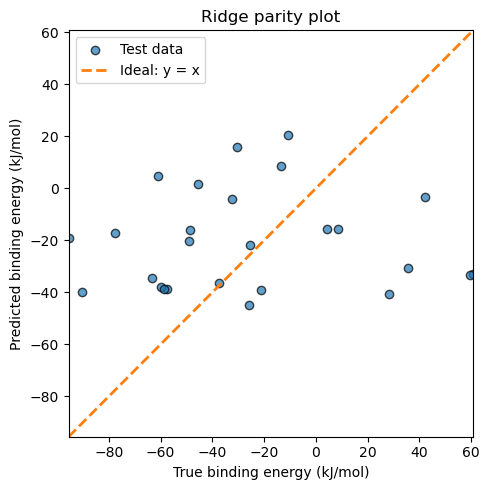

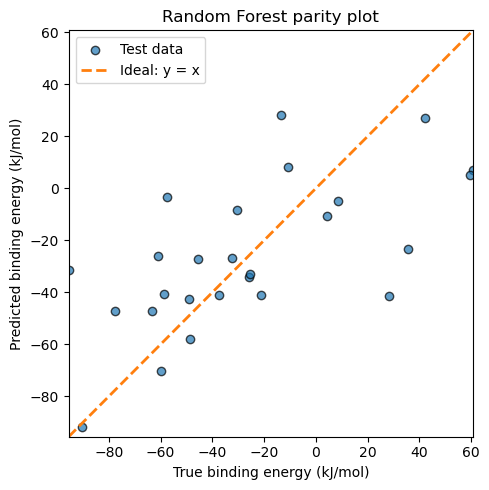

In [67]:
import matplotlib.pyplot as plt

def parity_plot(y_true, y_pred, title):
    plt.figure(figsize=(5, 5))

    # Data points (test set)
    plt.scatter(
        y_true, y_pred,
        alpha=0.7,
        color="tab:blue",
        edgecolor="k",
        label="Test data"
    )

    # 1:1 line
    lims = [
        min(y_true.min(), y_pred.min()),
        max(y_true.max(), y_pred.max())
    ]
    plt.plot(
        lims, lims,
        color="tab:orange",
        linestyle="--",
        linewidth=2,
        label="Ideal: y = x"
    )

    plt.xlim(lims)
    plt.ylim(lims)
    plt.xlabel("True binding energy (kJ/mol)")
    plt.ylabel("Predicted binding energy (kJ/mol)")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

# usage
parity_plot(y_test, y_pred_ridge, "Ridge parity plot")
parity_plot(y_test, y_pred_rf,    "Random Forest parity plot")


Random Forest feature importances:
lumo_eV          0.2424
homo_eV          0.2059
Sterimol_B5      0.1840
Sterimol_L       0.1574
gap_eV           0.1291
Sterimol_B1      0.0811


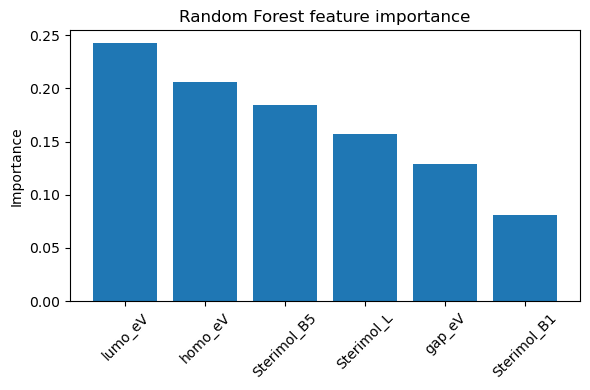

In [68]:
import numpy as np

importances = rf.feature_importances_
idx = np.argsort(importances)[::-1]

print("\nRandom Forest feature importances:")
for i in idx:
    print(f"{desc_cols[i]:15s}  {importances[i]:.4f}")

plt.figure(figsize=(6,4))
plt.bar(range(len(desc_cols)), importances[idx])
plt.xticks(range(len(desc_cols)), [desc_cols[i] for i in idx], rotation=45)
plt.ylabel("Importance")
plt.title("Random Forest feature importance")
plt.tight_layout()
plt.show()

In [69]:
import numpy as np

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# ---------- Helper to train & evaluate ----------
def eval_model(name, model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse  = mean_squared_error(y_test, y_pred)     # old sklearn → no `squared=` arg
    rmse = float(mse ** 0.5)
    r2   = r2_score(y_test, y_pred)

    print(f"\n{name}")
    print("-" * len(name))
    print("MSE :", mse)
    print("RMSE:", rmse)
    print("R²  :", r2)

    return {"name": name, "mse": mse, "rmse": rmse, "r2": r2}


results = []

# ---------- 1) Plain Linear Regression ----------
lin_model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", LinearRegression())
])
results.append(eval_model("LinearRegression", lin_model,
                          X_train, y_train, X_test, y_test))

# ---------- 2) Ridge (L2) ----------
ridge_model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", Ridge(alpha=1.0))
])
results.append(eval_model("Ridge (alpha=1.0)", ridge_model,
                          X_train, y_train, X_test, y_test))

# ---------- 3) Lasso (L1) ----------
lasso_model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", Lasso(alpha=0.001))
])
results.append(eval_model("Lasso (alpha=1e-3)", lasso_model,
                          X_train, y_train, X_test, y_test))

# ---------- 4) Elastic Net (L1 + L2) ----------
enet_model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", ElasticNet(alpha=0.001, l1_ratio=0.5))
])
results.append(eval_model("ElasticNet (alpha=1e-3, l1=0.5)", enet_model,
                          X_train, y_train, X_test, y_test))

# ---------- 5) Support Vector Regressor (RBF kernel) ----------
svr_model = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", SVR(kernel="rbf", C=10.0, epsilon=0.1))
])
results.append(eval_model("SVR (RBF, C=10)", svr_model,
                          X_train, y_train, X_test, y_test))

# ---------- 6) Random Forest ----------
rf_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=0,
    n_jobs=-1,
)
results.append(eval_model("RandomForest", rf_model,
                          X_train, y_train, X_test, y_test))

# ---------- 7) Gradient Boosting ----------
gbr_model = GradientBoostingRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=3,
    random_state=0,
)
results.append(eval_model("GradientBoosting", gbr_model,
                          X_train, y_train, X_test, y_test))


# Optional: put results in a DataFrame to sort by RMSE
import pandas as pd
results_df = pd.DataFrame(results)
print("\n=== Summary (sorted by RMSE) ===")
print(results_df.sort_values("rmse"))


LinearRegression
----------------
MSE : 2198.427103869109
RMSE: 46.88738747114312
R²  : -0.19516850073807013

Ridge (alpha=1.0)
-----------------
MSE : 2205.2456565780476
RMSE: 46.96004319182477
R²  : -0.1988753870860427

Lasso (alpha=1e-3)
------------------
MSE : 2210.1696807241397
RMSE: 47.012441765176796
R²  : -0.20155231849119404

ElasticNet (alpha=1e-3, l1=0.5)
-------------------------------
MSE : 2209.956797630787
RMSE: 47.010177596248106
R²  : -0.20143658521667818

SVR (RBF, C=10)
---------------
MSE : 1925.8505676488842
RMSE: 43.884513984421474
R²  : -0.04698305963003557


/opt/anaconda3/envs/pyomo_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.065e+05, tolerance: 4.489e+01
  model = cd_fast.enet_coordinate_descent(



RandomForest
------------
MSE : 1103.40249396944
RMSE: 33.217502825610474
R²  : 0.400138443477533

GradientBoosting
----------------
MSE : 1621.1583478892037
RMSE: 40.2636107159952
R²  : 0.11866197942349177

=== Summary (sorted by RMSE) ===
                              name          mse       rmse        r2
5                     RandomForest  1103.402494  33.217503  0.400138
6                 GradientBoosting  1621.158348  40.263611  0.118662
4                  SVR (RBF, C=10)  1925.850568  43.884514 -0.046983
0                 LinearRegression  2198.427104  46.887387 -0.195169
1                Ridge (alpha=1.0)  2205.245657  46.960043 -0.198875
3  ElasticNet (alpha=1e-3, l1=0.5)  2209.956798  47.010178 -0.201437
2               Lasso (alpha=1e-3)  2210.169681  47.012442 -0.201552


In [70]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# Dictionary of models
model_dict = {
    "LinearRegression": Pipeline([
        ("scaler", StandardScaler()),
        ("reg", LinearRegression())
    ]),
    "Ridge (alpha=1.0)": Pipeline([
        ("scaler", StandardScaler()),
        ("reg", Ridge(alpha=1.0))
    ]),
    "Lasso (alpha=1e-3)": Pipeline([
        ("scaler", StandardScaler()),
        ("reg", Lasso(alpha=0.001))
    ]),
    "ElasticNet (alpha=1e-3, l1=0.5)": Pipeline([
        ("scaler", StandardScaler()),
        ("reg", ElasticNet(alpha=0.001, l1_ratio=0.5))
    ]),
    "SVR (RBF, C=10)": Pipeline([
        ("scaler", StandardScaler()),
        ("reg", SVR(kernel="rbf", C=10.0, epsilon=0.1))
    ]),
    "RandomForest": RandomForestRegressor(
        n_estimators=300,
        max_depth=None,
        random_state=0,
        n_jobs=-1,
    ),
    "GradientBoosting": GradientBoostingRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=3,
        random_state=0,
    ),
}

def eval_model(name, model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse  = mean_squared_error(y_test, y_pred)
    rmse = float(mse ** 0.5)
    r2   = r2_score(y_test, y_pred)

    print(f"\n{name}")
    print("-" * len(name))
    print("MSE :", mse)
    print("RMSE:", rmse)
    print("R²  :", r2)

    return {"name": name, "mse": mse, "rmse": rmse, "r2": r2}, y_pred, model

results = []
predictions = {}   # name -> y_pred
fitted_models = {} # name -> fitted model

for name, model in model_dict.items():
    res, y_pred, fitted = eval_model(name, model, X_train, y_train, X_test, y_test)
    results.append(res)
    predictions[name] = y_pred
    fitted_models[name] = fitted

results_df = pd.DataFrame(results).sort_values("rmse")
print("\n=== Summary (sorted by RMSE) ===")
print(results_df)


LinearRegression
----------------
MSE : 2198.427103869109
RMSE: 46.88738747114312
R²  : -0.19516850073807013

Ridge (alpha=1.0)
-----------------
MSE : 2205.2456565780476
RMSE: 46.96004319182477
R²  : -0.1988753870860427

Lasso (alpha=1e-3)
------------------
MSE : 2210.1696807241397
RMSE: 47.012441765176796
R²  : -0.20155231849119404

ElasticNet (alpha=1e-3, l1=0.5)
-------------------------------
MSE : 2209.956797630787
RMSE: 47.010177596248106
R²  : -0.20143658521667818

SVR (RBF, C=10)
---------------
MSE : 1925.8505676488842
RMSE: 43.884513984421474
R²  : -0.04698305963003557

RandomForest
------------
MSE : 1103.40249396944
RMSE: 33.217502825610474
R²  : 0.400138443477533


/opt/anaconda3/envs/pyomo_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.065e+05, tolerance: 4.489e+01
  model = cd_fast.enet_coordinate_descent(



GradientBoosting
----------------
MSE : 1621.1583478892037
RMSE: 40.2636107159952
R²  : 0.11866197942349177

=== Summary (sorted by RMSE) ===
                              name          mse       rmse        r2
5                     RandomForest  1103.402494  33.217503  0.400138
6                 GradientBoosting  1621.158348  40.263611  0.118662
4                  SVR (RBF, C=10)  1925.850568  43.884514 -0.046983
0                 LinearRegression  2198.427104  46.887387 -0.195169
1                Ridge (alpha=1.0)  2205.245657  46.960043 -0.198875
3  ElasticNet (alpha=1e-3, l1=0.5)  2209.956798  47.010178 -0.201437
2               Lasso (alpha=1e-3)  2210.169681  47.012442 -0.201552


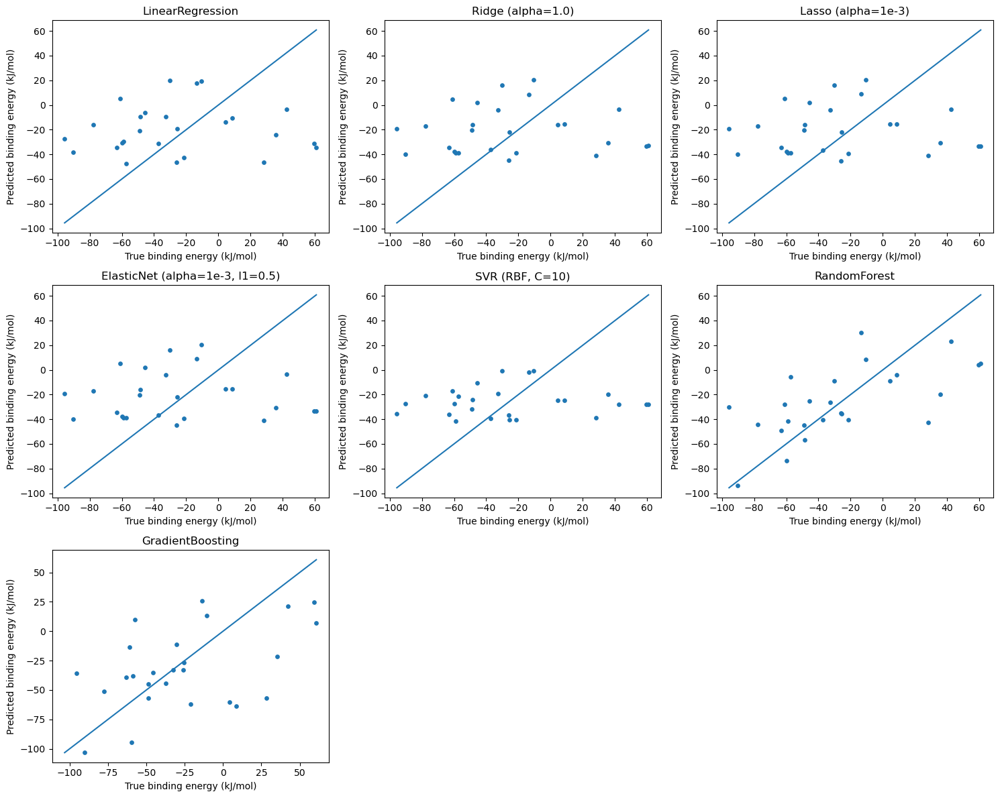

In [71]:
import matplotlib.pyplot as plt
import math

n_models = len(predictions)
n_cols = 3
n_rows = math.ceil(n_models / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

axes = axes.ravel()  # flatten in case of multiple rows
y_true = y_test

for ax, (name, y_pred) in zip(axes, predictions.items()):
    ax.scatter(y_true, y_pred, s=15)
    
    # y = x line
    y_min = min(y_true.min(), y_pred.min())
    y_max = max(y_true.max(), y_pred.max())
    ax.plot([y_min, y_max], [y_min, y_max])
    
    ax.set_title(name)
    ax.set_xlabel("True binding energy (kJ/mol)")
    ax.set_ylabel("Predicted binding energy (kJ/mol)")

# If there are more subplots than models, hide the extra axes
for j in range(len(predictions), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

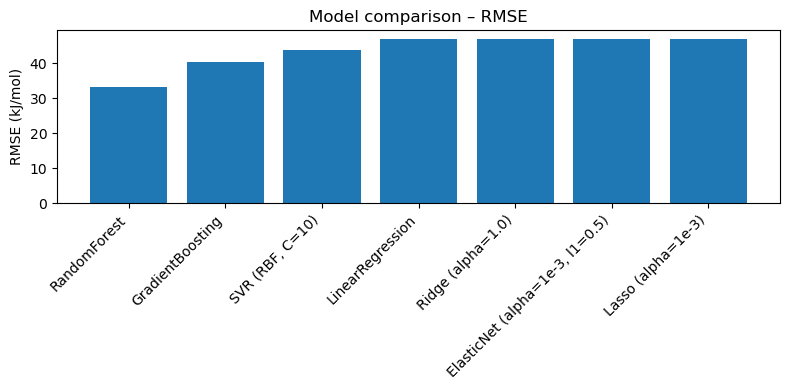

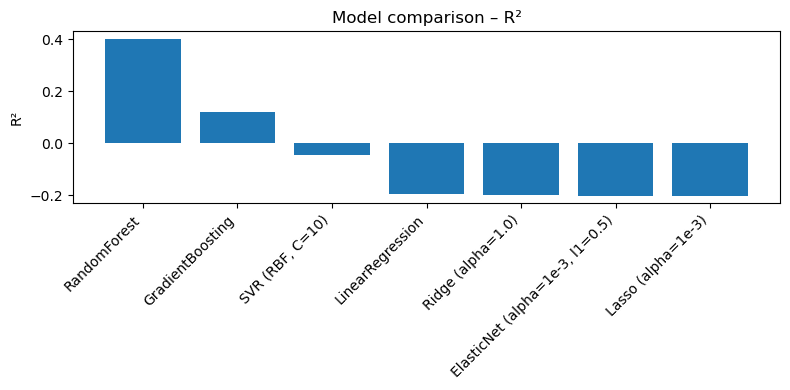

In [72]:
# Ensure results_df is sorted the way you like
results_df = results_df.reset_index(drop=True)

plt.figure(figsize=(8, 4))
plt.bar(results_df["name"], results_df["rmse"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("RMSE (kJ/mol)")
plt.title("Model comparison – RMSE")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.bar(results_df["name"], results_df["r2"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("R²")
plt.title("Model comparison – R²")
plt.tight_layout()
plt.show()

In [73]:
from pathlib import Path
import pandas as pd

# Adjust if your path is different
REPO_ROOT = Path("/Users/kishu/Downloads/FLPCO2DB-main")

bind_path     = REPO_ROOT / "data" / "processed" / "flp_co2_binding_energies.csv"
flp_desc_path = REPO_ROOT / "data" / "processed" / "flp_xtb_sterimol.csv"

# 1) Load CSVs
bind_df = pd.read_csv(bind_path)
flp_df  = pd.read_csv(flp_desc_path)

print("bind_df columns:\n", bind_df.columns.tolist())
print("flp_df columns:\n", flp_df.columns.tolist())

# 2) Keep only the FLP descriptors you care about
flp_desc = flp_df[
    [
        "flp_id",
        "energy_Eh",
        "Sterimol_L",
        "Sterimol_B1",
        "Sterimol_B5",
        "homo_eV",
        "lumo_eV",
        "gap_eV",
    ]
].rename(columns={"energy_Eh": "energy_flp_Eh"})

# 3) Merge: binding energies + descriptors
full = pd.merge(bind_df, flp_desc, on="flp_id", how="left")

print("\nFULL columns:\n", full.columns.tolist())
print("Shape (rows, cols):", full.shape)

# Optional: save for later reuse
full_out = REPO_ROOT / "data" / "processed" / "flp_full_dataset.csv"
full.to_csv(full_out, index=False)
print("\nSaved combined dataset to:", full_out)


bind_df columns:
 ['flp_id', 'energy_complex_Eh', 'xyz_path_complex', 'smiles_complex', 'energy_flp_Eh', 'E_CO2_Eh', 'binding_energy_Eh', 'binding_energy_kJmol']
flp_df columns:
 ['xyz_path', 'filename', 'smiles', 'error', 'flp_id', 'energy_Eh', 'homo_eV', 'lumo_eV', 'gap_eV', 'Sterimol_L', 'Sterimol_B1', 'Sterimol_B5']

FULL columns:
 ['flp_id', 'energy_complex_Eh', 'xyz_path_complex', 'smiles_complex', 'energy_flp_Eh_x', 'E_CO2_Eh', 'binding_energy_Eh', 'binding_energy_kJmol', 'energy_flp_Eh_y', 'Sterimol_L', 'Sterimol_B1', 'Sterimol_B5', 'homo_eV', 'lumo_eV', 'gap_eV']
Shape (rows, cols): (132, 15)

Saved combined dataset to: /Users/kishu/Downloads/FLPCO2DB-main/data/processed/flp_full_dataset.csv


Using feature columns: ['Sterimol_L', 'Sterimol_B1', 'Sterimol_B5', 'homo_eV', 'lumo_eV', 'gap_eV']


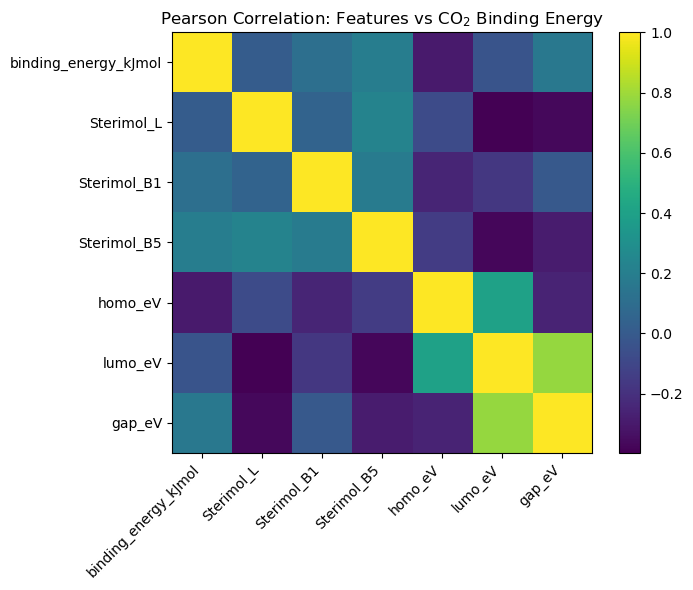

In [74]:
import numpy as np
import matplotlib.pyplot as plt

target_col = "binding_energy_kJmol"
candidate_features = [
    "energy_flp_Eh",
    "Sterimol_L",
    "Sterimol_B1",
    "Sterimol_B5",
    "homo_eV",
    "lumo_eV",
    "gap_eV",
]

# Keep only features that REALLY exist in `full`
feature_cols = [c for c in candidate_features if c in full.columns]
print("Using feature columns:", feature_cols)

# Drop rows with any NaNs in target or selected features
corr_df = full[[target_col] + feature_cols].dropna()

corr = corr_df.corr()

plt.figure(figsize=(8, 6))
im = plt.imshow(corr, interpolation="nearest")
plt.colorbar(im, fraction=0.046, pad=0.04)

ticks = np.arange(len(corr.columns))
plt.xticks(ticks, corr.columns, rotation=45, ha="right")
plt.yticks(ticks, corr.index)

plt.title("Pearson Correlation: Features vs CO$_2$ Binding Energy")
plt.tight_layout()
plt.show()

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# Use the same feature_cols from the correlation cell
reg_df = full[["binding_energy_kJmol"] + feature_cols].dropna()

X = reg_df[feature_cols].values
y = reg_df["binding_energy_kJmol"].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=0
)

def eval_model(name, model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse  = mean_squared_error(y_test, y_pred)
    rmse = float(mse ** 0.5)
    r2   = r2_score(y_test, y_pred)

    print(f"\n{name}")
    print("-" * len(name))
    print("MSE :", mse)
    print("RMSE:", rmse)
    print("R²  :", r2)

    return name, y_pred, rmse, r2

results = []

# 1) Linear
lin = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", LinearRegression())
])
results.append(eval_model("LinearRegression", lin,
                          X_train, y_train, X_test, y_test))

# 2) Ridge
ridge = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", Ridge(alpha=1.0))
])
results.append(eval_model("Ridge (α=1.0)", ridge,
                          X_train, y_train, X_test, y_test))

# 3) Lasso
lasso = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", Lasso(alpha=1e-3))
])
results.append(eval_model("Lasso (α=1e-3)", lasso,
                          X_train, y_train, X_test, y_test))

# 4) Elastic Net
enet = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", ElasticNet(alpha=1e-3, l1_ratio=0.5))
])
results.append(eval_model("ElasticNet (α=1e-3, l1=0.5)", enet,
                          X_train, y_train, X_test, y_test))

# 5) SVR
svr = Pipeline([
    ("scaler", StandardScaler()),
    ("reg", SVR(kernel="rbf", C=10.0, epsilon=0.1))
])
results.append(eval_model("SVR (RBF, C=10)", svr,
                          X_train, y_train, X_test, y_test))

# 6) Random Forest
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    random_state=0,
    n_jobs=-1,
)
results.append(eval_model("RandomForest", rf,
                          X_train, y_train, X_test, y_test))

# 7) Gradient Boosting
gbr = GradientBoostingRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=3,
    random_state=0,
)
results.append(eval_model("GradientBoosting", gbr,
                          X_train, y_train, X_test, y_test))

# Quick summary table
summary = pd.DataFrame(
    [{"model": r[0], "rmse": r[2], "r2": r[3]} for r in results]
)
print("\n=== Summary (sorted by RMSE) ===")
print(summary.sort_values("rmse"))


LinearRegression
----------------
MSE : 2198.4271038670954
RMSE: 46.88738747112165
R²  : -0.19516850073697523

Ridge (α=1.0)
-------------
MSE : 2205.2456565780476
RMSE: 46.96004319182477
R²  : -0.1988753870860427

Lasso (α=1e-3)
--------------
MSE : 2210.17128842056
RMSE: 47.012458863800774
R²  : -0.2015531925106766

ElasticNet (α=1e-3, l1=0.5)
---------------------------
MSE : 2209.9567947216724
RMSE: 47.010177565306776
R²  : -0.2014365836351466

SVR (RBF, C=10)
---------------
MSE : 1925.8505676488837
RMSE: 43.884513984421474
R²  : -0.04698305963003557


/opt/anaconda3/envs/pyomo_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.065e+05, tolerance: 4.489e+01
  model = cd_fast.enet_coordinate_descent(



RandomForest
------------
MSE : 1141.5175920370543
RMSE: 33.78635215641153
R²  : 0.3794172812735269

GradientBoosting
----------------
MSE : 1628.6238249429107
RMSE: 40.356211726857005
R²  : 0.11460339453711077

=== Summary (sorted by RMSE) ===
                         model       rmse        r2
5                 RandomForest  33.786352  0.379417
6             GradientBoosting  40.356212  0.114603
4              SVR (RBF, C=10)  43.884514 -0.046983
0             LinearRegression  46.887387 -0.195169
1                Ridge (α=1.0)  46.960043 -0.198875
3  ElasticNet (α=1e-3, l1=0.5)  47.010178 -0.201437
2               Lasso (α=1e-3)  47.012459 -0.201553


In [76]:
import matplotlib.pyplot as plt
import numpy as np

def parity_plot(y_true, y_pred, title="Parity plot"):
    """
    y_true vs y_pred with y=x reference line.
    """
    plt.figure(figsize=(5, 5))
    plt.scatter(y_true, y_pred, alpha=0.7)
    min_val = min(y_true.min(), y_pred.min())
    max_val = max(y_true.max(), y_pred.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle="--")
    plt.xlabel("True binding energy [kJ/mol]")
    plt.ylabel("Predicted binding energy [kJ/mol]")
    plt.title(title)
    plt.tight_layout()
    plt.show()


def residual_plot(y_true, y_pred, title="Residuals plot"):
    """
    Residuals vs predicted.
    """
    residuals = y_pred - y_true
    plt.figure(figsize=(5, 4))
    plt.scatter(y_pred, residuals, alpha=0.7)
    plt.axhline(0.0, linestyle="--")
    plt.xlabel("Predicted binding energy [kJ/mol]")
    plt.ylabel("Residual (y_pred - y_true)")
    plt.title(title)
    plt.tight_layout()
    plt.show()


LinearRegression
----------------
MSE : 2198.4271038670954
RMSE: 46.88738747112165
R²  : -0.19516850073697523


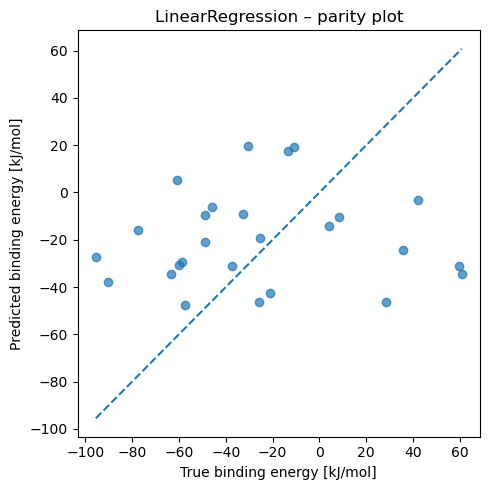

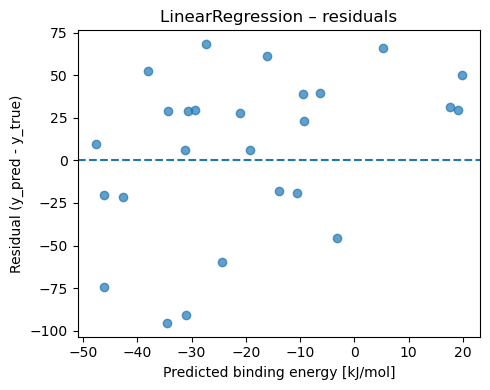


Ridge (α=1.0)
-------------
MSE : 2205.2456565780476
RMSE: 46.96004319182477
R²  : -0.1988753870860427


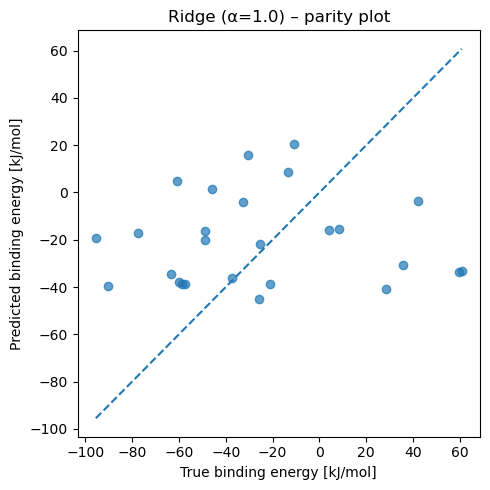

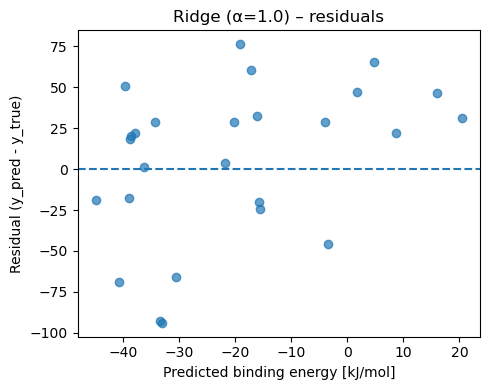


Lasso (α=1e-3)
--------------
MSE : 2210.17128842056
RMSE: 47.012458863800774
R²  : -0.2015531925106766


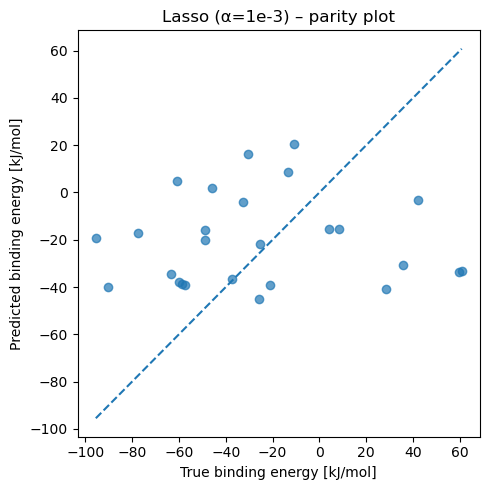

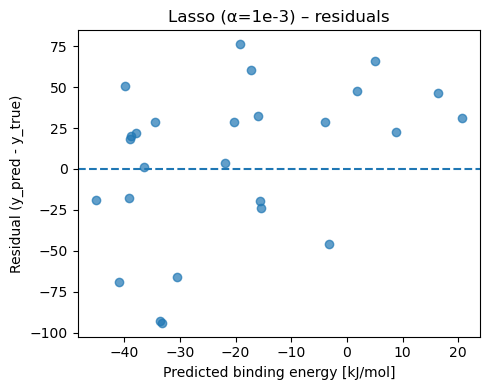


ElasticNet
----------
MSE : 2209.9567947216724
RMSE: 47.010177565306776
R²  : -0.2014365836351466


/opt/anaconda3/envs/pyomo_env/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.065e+05, tolerance: 4.489e+01
  model = cd_fast.enet_coordinate_descent(


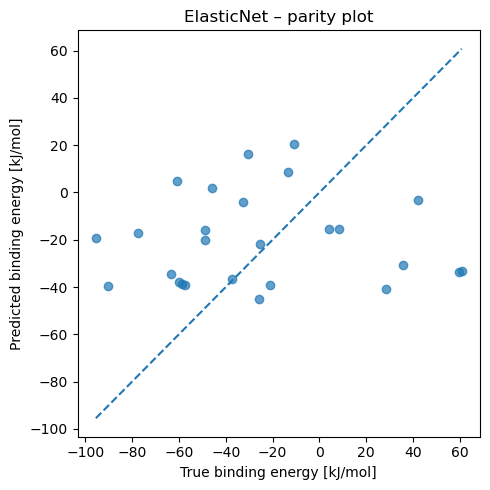

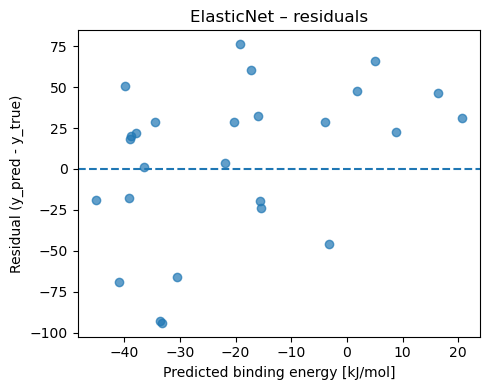


SVR (RBF, C=10)
---------------
MSE : 1925.8505676488837
RMSE: 43.884513984421474
R²  : -0.04698305963003557


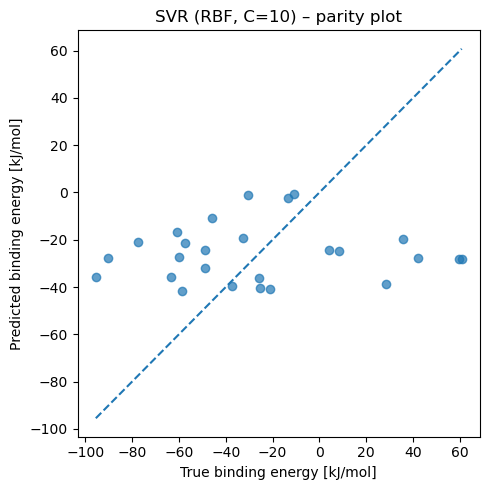

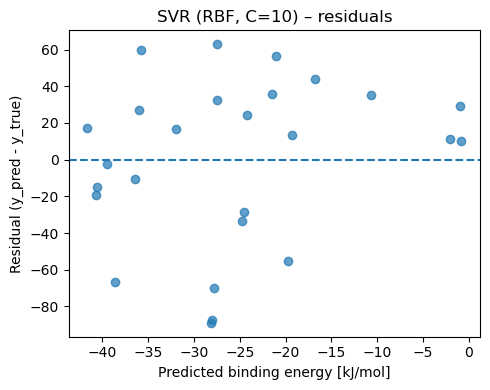


RandomForest
------------
MSE : 1141.5175920370543
RMSE: 33.78635215641153
R²  : 0.3794172812735269


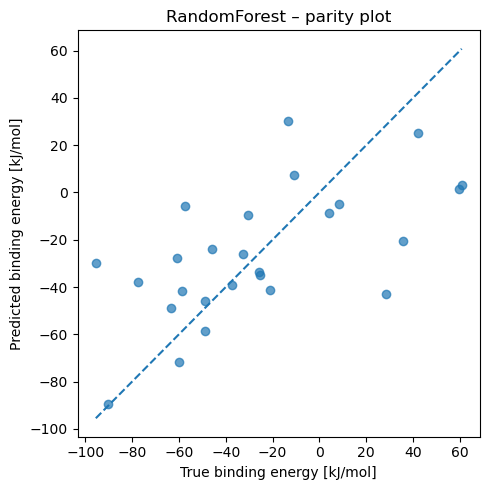

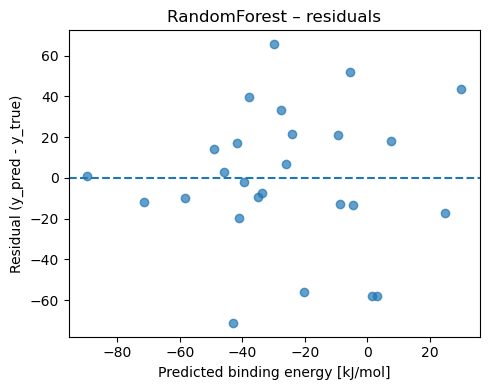


GradientBoosting
----------------
MSE : 1628.6238249429107
RMSE: 40.356211726857005
R²  : 0.11460339453711077


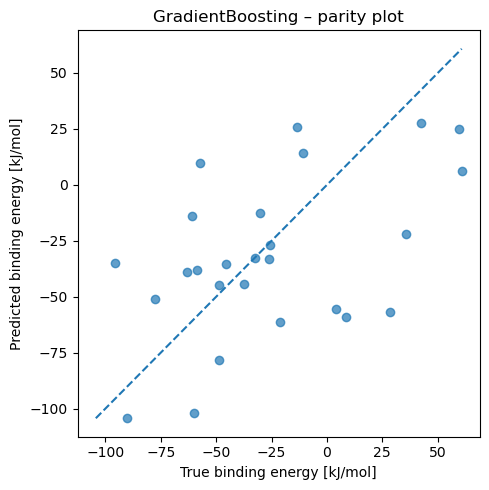

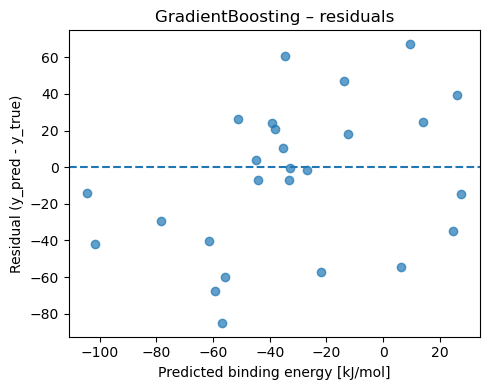


=== Summary (sorted by RMSE) ===
              model       rmse        r2
5      RandomForest  33.786352  0.379417
6  GradientBoosting  40.356212  0.114603
4   SVR (RBF, C=10)  43.884514 -0.046983
0  LinearRegression  46.887387 -0.195169
1     Ridge (α=1.0)  46.960043 -0.198875
3        ElasticNet  47.010178 -0.201437
2    Lasso (α=1e-3)  47.012459 -0.201553


In [77]:
models = {
    "LinearRegression": lin_model,
    "Ridge (α=1.0)":   ridge_model,
    "Lasso (α=1e-3)":  lasso_model,
    "ElasticNet":      enet_model,
    "SVR (RBF, C=10)": svr_model,
    "RandomForest":    rf_model,
    "GradientBoosting": gbr_model,
}

all_results = []

for name, model in models.items():
    # Fit + predict
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Metrics
    mse  = mean_squared_error(y_test, y_pred)
    rmse = float(mse ** 0.5)
    r2   = r2_score(y_test, y_pred)

    print(f"\n{name}")
    print("-" * len(name))
    print("MSE :", mse)
    print("RMSE:", rmse)
    print("R²  :", r2)

    all_results.append({"model": name, "rmse": rmse, "r2": r2})

    # === Plots for this model ===
    parity_plot(y_test, y_pred, title=f"{name} – parity plot")
    residual_plot(y_test, y_pred, title=f"{name} – residuals")

# Summary table
import pandas as pd
summary = pd.DataFrame(all_results)
print("\n=== Summary (sorted by RMSE) ===")
print(summary.sort_values("rmse"))